In [1]:
import shutil
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pyblock.blocking

# from jaqmc.utils.config import ConfigManager

#paths:
# /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval
# /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval
# /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval

In [2]:
digest = dict(np.load("/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_digest.npz"))

print("Digest contents:")
for key, value in sorted(digest.items()):
    if value.ndim == 0:
        print(f"  {key}: {value:.6f}")
    else:
        print(f"  {key}: shape={value.shape}")

Digest contents:
  energy:ecp: 7.579626-0.000476j
  energy:ecp_var: 96.428131+0.916701j
  energy:kinetic: 19.883060+0.000145j
  energy:kinetic_var: 58.360073+0.970033j
  energy:potential: -74.754196
  energy:potential_var: 106.937553
  gamma1_down_ii: shape=(7,)
  gamma1_up_ii: shape=(7,)
  total_energy: -47.291508-0.000331j
  total_energy_real: -47.291512
  total_energy_real_var: 0.416624
  two_rdm_down_down: shape=(7, 7, 7, 7)
  two_rdm_up_down: shape=(7, 7, 7, 7)
  two_rdm_up_up: shape=(7, 7, 7, 7)


In [5]:
import numpy as np

# Assuming 'digest' is loaded as in your snippet
g1_up = digest['gamma1_up_ii']
g1_dn = digest['gamma1_down_ii']
g2_uu = digest['two_rdm_up_up']
g2_dd = digest['two_rdm_down_down']
g2_ud = digest['two_rdm_up_down']

orbitals = ['4s', '3dxy', '3dyz', '3dz^2', '3dxz', '3dx2-y2']

# =====================================================================
# 1. On-Site Term: <S_i^2> for each orbital
# S_i^2 = 3/4 * (n_{i, up} + n_{i, dn} - 2 * n_{i, up} n_{i, dn})
# =====================================================================

# <n_{i, up} n_{i, dn}> -> set all indices to i
n_up_dn_ii = np.einsum('iiii->i', g2_ud)

s2_onsite_per_orbital = 0.75 * (g1_up + g1_dn - 2 * n_up_dn_ii)

print("--- On-site <S_i^2> ---")
for orb, val in zip(orbitals, s2_onsite_per_orbital):
    print(f"{orb:>10}: {val:.6f}")

total_onsite = np.sum(s2_onsite_per_orbital)
print(f"\nTotal On-site S^2: {total_onsite:.6f}\n")


# =====================================================================
# 2. Inter-Orbital Term: <S_i . S_j> (Masking out i=j)
# =====================================================================
mask = 1.0 - np.eye(6)

# --- Ising Term (S_i^z S_j^z) ---
# Maps to ijij in your specific code convention
nn_uu = np.einsum('ijij->ij', g2_uu)
nn_dd = np.einsum('ijij->ij', g2_dd)
nn_ud = np.einsum('ijij->ij', g2_ud)
nn_du = np.einsum('jiji->ij', g2_ud) 

sz_sz_matrix = 0.25 * (nn_uu + nn_dd - nn_ud - nn_du) * mask

# --- Spin-Flip Term 1/2(S_i^+ S_j^- + S_i^- S_j^+) ---
# Swaps the annihilation indices -> maps to ijji in your convention
flip_ud = np.einsum('ijji->ij', g2_ud)
flip_du = np.einsum('jiij->ij', g2_ud)

spin_flip_matrix = -0.5 * (flip_ud + flip_du) * mask

# Combine for total S_i . S_j matrix
s_i_dot_s_j = sz_sz_matrix + spin_flip_matrix

print("--- Inter-orbital <S_i . S_j> Matrix ---")
print(np.round(s_i_dot_s_j, 5))

total_inter = np.sum(s_i_dot_s_j)
print(f"\nTotal Inter-orbital S.S: {total_inter:.6f}")


# =====================================================================
# 3. Total Local S^2
# =====================================================================
total_local_s2 = total_onsite + total_inter
print(f"\n{'='*40}")
print(f"Total Local S^2 (3d + 4s): {total_local_s2:.6f}")
print(f"{'='*40}")

--- On-site <S_i^2> ---
        4s: 0.275779+0.000073j
      3dxy: 0.180720+0.001457j
      3dyz: 0.380165-0.000131j
     3dz^2: 0.120974+0.000050j
      3dxz: 0.179756-0.000077j
   3dx2-y2: 0.201343-0.000382j

Total On-site S^2: 1.338736+0.000989j

--- Inter-orbital <S_i . S_j> Matrix ---
[[-0.000e+00+0.0e+00j  1.850e-03-1.7e-04j -2.079e-02+3.0e-05j
  -1.350e-03-2.0e-05j  3.110e-03-6.0e-05j -1.020e-03-0.0e+00j]
 [ 1.240e-03-2.0e-04j -0.000e+00+0.0e+00j -1.250e-03+4.4e-04j
   2.460e-03+1.0e-04j -2.171e-02+4.0e-05j  3.900e-04-6.3e-04j]
 [-2.063e-02+5.0e-05j  8.000e-05+4.0e-04j -0.000e+00+0.0e+00j
  -7.900e-03+4.0e-05j  2.800e-04-0.0e+00j -2.132e-02-6.0e-05j]
 [-5.700e-04-3.0e-05j  2.000e-03+9.0e-05j -7.660e-03+5.0e-05j
   0.000e+00-0.0e+00j  1.660e-03+1.5e-04j -7.600e-03-5.0e-05j]
 [ 2.280e-03-5.0e-05j -2.079e-02-2.0e-05j  1.000e-04+2.0e-05j
   2.180e-03+1.1e-04j  0.000e+00-0.0e+00j -1.390e-03-1.0e-04j]
 [-1.940e-03+2.0e-05j -2.700e-04-5.1e-04j -2.156e-02-4.0e-05j
  -7.140e-03-1.0e-05j 

### New results accounting for H 1s orbital


RESULTS FOR Sc-H DISTANCE: 2.8 Bohr

--- Subspace Spin Breakdown ---
3d Local Moment S^2:        0.975443+0.000067j
Conduction Band S^2:        0.430178-0.000951j
Kondo Correlation:          -0.069625+0.000350j
Grand Total Subspace:       1.335996-0.000535j

--- Orbital Occupancies ---
   Orbital |  <n> (Total) | <n_up * n_dn> (Double)
--------------------------------------------------
        4s |     0.413520 |               0.011290
      3dxy |     0.300777 |               0.019780
      3dyz |     0.772544 |               0.139396
     3dz^2 |     0.171793 |               0.007163
      3dxz |     0.298383 |               0.018794
   3dx2-y2 |     0.308009 |               0.022458
      H_1s |     0.214194 |               0.009042

RESULTS FOR Sc-H DISTANCE: 3.78 Bohr

--- Subspace Spin Breakdown ---
3d Local Moment S^2:        0.938173+0.001268j
Conduction Band S^2:        0.433630-0.000093j
Kondo Correlation:          -0.063314+0.000422j
Grand Total Subspace:       1.308489+0.0

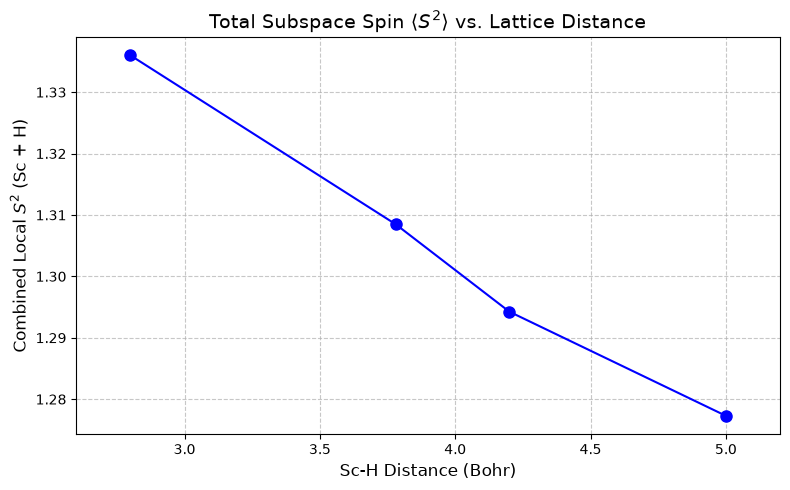

In [5]:
import numpy as np
import os
import matplotlib.pyplot as plt

# Your three run directories
run_paths = [
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval",
    # "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.25_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval",
    # "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval",
    
]

orbitals = ['4s', '3dxy', '3dyz', '3dz^2', '3dxz', '3dx2-y2', 'H_1s']

# Lists to store data for the final plot
plot_distances = []
plot_grand_totals = []

for path in run_paths:
    digest_file = os.path.join(path, "evaluation_digest.npz")
    if not os.path.exists(digest_file):
        print(f"Skipping {path} - file not found.")
        continue
        
    digest = dict(np.load(digest_file))
    
    # Extract the 7-orbital arrays
    g1_up = digest['gamma1_up_ii']
    g1_dn = digest['gamma1_down_ii']
    g2_uu = digest['two_rdm_up_up']
    g2_dd = digest['two_rdm_down_down']
    g2_ud = digest['two_rdm_up_down']

    # =====================================================================
    # 1. On-Site Term: <S_i^2> for each orbital
    # =====================================================================
    n_up_dn_ii = np.einsum('iiii->i', g2_ud)
    s2_onsite_per_orbital = 0.75 * (g1_up + g1_dn - 2 * n_up_dn_ii)

    # =====================================================================
    # 2. Inter-Orbital Term: <S_i . S_j> matrix
    # =====================================================================
    # UPDATE: Mask is now 7x7 to cover the Sc + H subspace
    mask = 1.0 - np.eye(7)

    # --- Ising Term (S_i^z S_j^z) ---
    nn_uu = np.einsum('ijij->ij', g2_uu)
    nn_dd = np.einsum('ijij->ij', g2_dd)
    nn_ud = np.einsum('ijij->ij', g2_ud)
    nn_du = np.einsum('jiji->ij', g2_ud) 
    sz_sz_matrix = 0.25 * (nn_uu + nn_dd - nn_ud - nn_du) * mask

    # --- Spin-Flip Term 1/2(S_i^+ S_j^- + S_i^- S_j^+) ---
    flip_ud = np.einsum('ijji->ij', g2_ud)
    flip_du = np.einsum('jiij->ij', g2_ud)
    spin_flip_matrix = -0.5 * (flip_ud + flip_du) * mask

    # Total S_i . S_j matrix
    s_i_dot_s_j = sz_sz_matrix + spin_flip_matrix

    # =====================================================================
    # 3. Physics Breakdown: 3d Local Moment vs Conduction Band (4s + 1s)
    # =====================================================================
    
    # --- Exact Orbital Occupancies ---
    # <n_i> = <n_{i,up}> + <n_{i,dn}>
    occupancies = g1_up + g1_dn
    # Double occupancy is already calculated as n_up_dn_ii
    double_occupancies = n_up_dn_ii

    # --- Define Subspace Indices ---
    idx_4s = [0]
    idx_3d = [1, 2, 3, 4, 5]
    idx_1s = [6]
    
    idx_cond = idx_4s + idx_1s  # The hybridized conduction band [0, 6]

    # --- 1. The Local Moment (3d Shell Only) ---
    s2_3d_onsite = np.sum(s2_onsite_per_orbital[idx_3d])
    s2_3d_inter  = np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_3d)])
    s2_3d_total  = s2_3d_onsite + s2_3d_inter
    
    # --- 2. The Conduction Band (4s + 1s) ---
    s2_cond_onsite = np.sum(s2_onsite_per_orbital[idx_cond])
    s2_cond_inter  = np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_cond)])
    s2_cond_total  = s2_cond_onsite + s2_cond_inter
    
    # --- 3. The Kondo Exchange Correlation (3d dot Cond) ---
    # Sum of cross-terms between the 3d indices and the conduction indices
    kondo_correlation = np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_cond)]) + np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_3d)])
    
    # Grand Total (Sanity Check)
    grand_total = s2_3d_total + s2_cond_total + kondo_correlation

    # =====================================================================
    # 4. Printing & Data Storage
    # =====================================================================
    dist = path.split('_chain_')[-1].split('_rdm')[0] 
    dist_val = float(dist)
    
    # Store for plotting (taking the real part)
    plot_distances.append(dist_val)
    plot_grand_totals.append(grand_total.real)
    
    print(f"\n{'='*55}")
    print(f"RESULTS FOR Sc-H DISTANCE: {dist_val} Bohr")
    print(f"{'='*55}")
    
    print("\n--- Subspace Spin Breakdown ---")
    print(f"3d Local Moment S^2:        {s2_3d_total:.6f}")
    print(f"Conduction Band S^2:        {s2_cond_total:.6f}")
    print(f"Kondo Correlation:          {kondo_correlation:.6f}")
    print(f"Grand Total Subspace:       {grand_total:.6f}")
    
    print("\n--- Orbital Occupancies ---")
    print(f"{'Orbital':>10} | {'<n> (Total)':>12} | {'<n_up * n_dn> (Double)':>22}")
    print("-" * 50)
    for orb, n_tot, n_dbl in zip(orbitals, occupancies, double_occupancies):
        print(f"{orb:>10} | {n_tot.real:>12.6f} | {n_dbl.real:>22.6f}")
# =====================================================================
# 5. Plotting the Grand Total against Distance
# =====================================================================
# Sort the arrays just in case the directories were read out of order
sorted_indices = np.argsort(plot_distances)
plot_distances = np.array(plot_distances)[sorted_indices]
plot_grand_totals = np.array(plot_grand_totals)[sorted_indices]

plt.figure(figsize=(8, 5))
plt.plot(plot_distances, plot_grand_totals, marker='o', linestyle='-', color='b', markersize=8)

plt.xlabel("Sc-H Distance (Bohr)", fontsize=12)
plt.ylabel(r"Combined Local $S^2$ (Sc + H)", fontsize=12)
plt.title(r"Total Subspace Spin $\langle S^2 \rangle$ vs. Lattice Distance", fontsize=14)

# Set axes limits to provide some visual breathing room
# plt.ylim(0, 1.5)
plt.xlim(min(plot_distances) - 0.2, max(plot_distances) + 0.2)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

In [3]:
digest = dict(np.load("/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_digest.npz"))

print("Digest contents:")
for key, value in sorted(digest.items()):
    if value.ndim == 0:
        print(f"  {key}: {value:.6f}")
    else:
        print(f"  {key}: shape={value.shape}")

Digest contents:
  energy:ecp: 7.579626-0.000476j
  energy:ecp_var: 96.428131+0.916701j
  energy:kinetic: 19.883060+0.000145j
  energy:kinetic_var: 58.360073+0.970033j
  energy:potential: -74.754196
  energy:potential_var: 106.937553
  gamma1_down_ii: shape=(7,)
  gamma1_up_ii: shape=(7,)
  total_energy: -47.291508-0.000331j
  total_energy_real: -47.291512
  total_energy_real_var: 0.416624
  two_rdm_down_down: shape=(7, 7, 7, 7)
  two_rdm_up_down: shape=(7, 7, 7, 7)
  two_rdm_up_up: shape=(7, 7, 7, 7)



RESULTS FOR Sc-H DISTANCE: 2.8 Bohr

--- Subspace Spin Breakdown ---
3d Local Moment S^2:        0.975443
Conduction Band S^2:        0.430178
Kondo Correlation:          -0.069625

--- Orbital Occupancies ---
   Orbital |  <n> (Total) | <n_up * n_dn> (Double)
--------------------------------------------------
        4s |     0.413520 |               0.011290
      3dxy |     0.300777 |               0.019780
      3dyz |     0.772544 |               0.139396
     3dz^2 |     0.171793 |               0.007163
      3dxz |     0.298383 |               0.018794
   3dx2-y2 |     0.308009 |               0.022458
      H_1s |     0.214194 |               0.009042
--------------------------------------------------
  Total 3d |     1.851506 |
Sum (7 orbs) |     2.479220 |
Total outer valence electrons accounted for: 2.479220 out of 4.0
Electrons spilled into higher orbitals (e.g., Sc 4p, H 2s/2p): 1.520780

RESULTS FOR Sc-H DISTANCE: 3.78 Bohr

--- Subspace Spin Breakdown ---
3d Local Mome

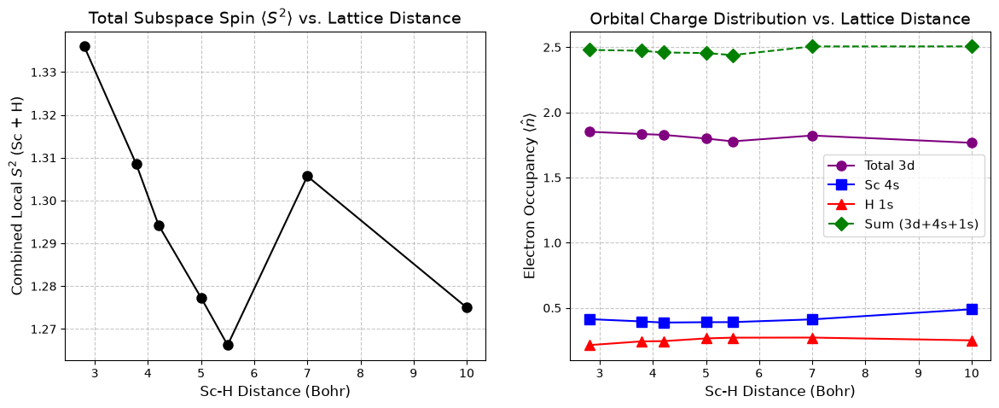

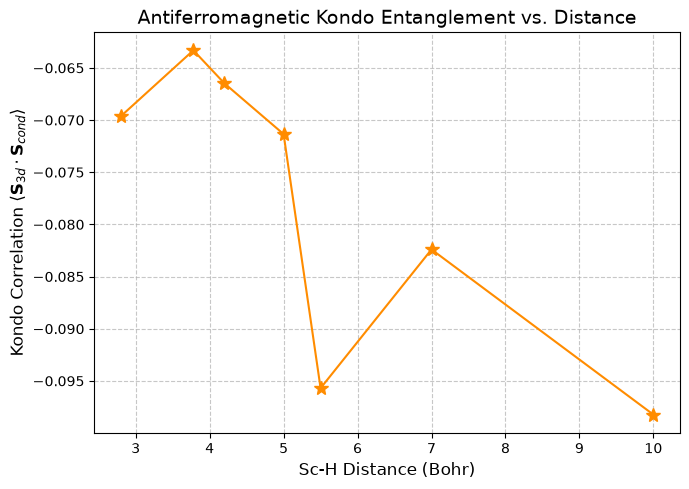

In [4]:
import numpy as np
import os
import matplotlib.pyplot as plt

# Your four run directories
run_paths = [
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval",
    
    
]

orbitals = ['4s', '3dxy', '3dyz', '3dz^2', '3dxz', '3dx2-y2', 'H_1s']

# Lists to store data for plotting
plot_distances = []
plot_grand_totals = []
plot_occ_4s = []
plot_occ_3d = []
plot_occ_1s = []
plot_occ_total = []
plot_kondo = []

for path in run_paths:
    digest_file = os.path.join(path, "evaluation_digest.npz")
    if not os.path.exists(digest_file):
        print(f"Skipping {path} - file not found.")
        continue
        
    digest = dict(np.load(digest_file))
    
    g1_up = digest['gamma1_up_ii']
    g1_dn = digest['gamma1_down_ii']
    g2_uu = digest['two_rdm_up_up']
    g2_dd = digest['two_rdm_down_down']
    g2_ud = digest['two_rdm_up_down']

    # 1. On-Site Term: <S_i^2> 
    n_up_dn_ii = np.einsum('iiii->i', g2_ud)
    s2_onsite_per_orbital = 0.75 * (g1_up + g1_dn - 2 * n_up_dn_ii)

    # 2. Inter-Orbital Term: <S_i . S_j> matrix
    mask = 1.0 - np.eye(7)
    nn_uu = np.einsum('ijij->ij', g2_uu)
    nn_dd = np.einsum('ijij->ij', g2_dd)
    nn_ud = np.einsum('ijij->ij', g2_ud)
    nn_du = np.einsum('jiji->ij', g2_ud) 
    sz_sz_matrix = 0.25 * (nn_uu + nn_dd - nn_ud - nn_du) * mask

    flip_ud = np.einsum('ijji->ij', g2_ud)
    flip_du = np.einsum('jiij->ij', g2_ud)
    spin_flip_matrix = -0.5 * (flip_ud + flip_du) * mask

    s_i_dot_s_j = sz_sz_matrix + spin_flip_matrix

    # 3. Physics Breakdown: 3d Local Moment vs Conduction Band
    occupancies = g1_up + g1_dn
    double_occupancies = n_up_dn_ii

    idx_4s = [0]
    idx_3d = [1, 2, 3, 4, 5]
    idx_1s = [6]
    idx_cond = idx_4s + idx_1s 

    # Spin Subspaces
    s2_3d_total = np.sum(s2_onsite_per_orbital[idx_3d]) + np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_3d)])
    s2_cond_total = np.sum(s2_onsite_per_orbital[idx_cond]) + np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_cond)])
    kondo_correlation = np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_cond)]) + np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_3d)])
    grand_total = s2_3d_total + s2_cond_total + kondo_correlation

    # Extract Exact Occupancies for plotting
    occ_4s = occupancies[0].real
    occ_3d_total = np.sum(occupancies[1:6]).real
    occ_1s = occupancies[6].real
    
    # 4. Printing & Data Storage
    dist = path.split('_chain_')[-1].split('_rdm')[0] 
    dist_val = float(dist)
    
    plot_distances.append(dist_val)
    plot_grand_totals.append(grand_total.real)
    plot_occ_4s.append(occ_4s)
    plot_occ_3d.append(occ_3d_total)
    plot_occ_1s.append(occ_1s)
    plot_kondo.append(kondo_correlation.real)

    occ_total_monitored = occ_4s + occ_3d_total + occ_1s
    plot_occ_total.append(occ_total_monitored)
    
    print(f"\n{'='*55}")
    print(f"RESULTS FOR Sc-H DISTANCE: {dist_val} Bohr")
    print(f"{'='*55}")
    
    print("\n--- Subspace Spin Breakdown ---")
    print(f"3d Local Moment S^2:        {s2_3d_total.real:.6f}")
    print(f"Conduction Band S^2:        {s2_cond_total.real:.6f}")
    print(f"Kondo Correlation:          {kondo_correlation.real:.6f}")
    
    print("\n--- Orbital Occupancies ---")
    print(f"{'Orbital':>10} | {'<n> (Total)':>12} | {'<n_up * n_dn> (Double)':>22}")
    print("-" * 50)
    for orb, n_tot, n_dbl in zip(orbitals, occupancies, double_occupancies):
        print(f"{orb:>10} | {n_tot.real:>12.6f} | {n_dbl.real:>22.6f}")
    
    print("-" * 50)
    print(f"{'Total 3d':>10} | {occ_3d_total:>12.6f} |")

    occ_total_monitored = occ_4s + occ_3d_total + occ_1s
    spilled_electrons = 4.0 - occ_total_monitored
    
    print(f"{'Sum (7 orbs)':>10} | {occ_total_monitored:>12.6f} |")
    print("=" * 50)
    print(f"Total outer valence electrons accounted for: {occ_total_monitored:.6f} out of 4.0")
    print(f"Electrons spilled into higher orbitals (e.g., Sc 4p, H 2s/2p): {spilled_electrons:.6f}")


# =====================================================================
# 5. Plotting
# =====================================================================
# Sort arrays by distance
sorted_indices = np.argsort(plot_distances)
plot_distances = np.array(plot_distances)[sorted_indices]
plot_grand_totals = np.array(plot_grand_totals)[sorted_indices]
plot_occ_total = np.array(plot_occ_total)[sorted_indices]
plot_occ_3d = np.array(plot_occ_3d)[sorted_indices]
plot_occ_4s = np.array(plot_occ_4s)[sorted_indices]
plot_occ_1s = np.array(plot_occ_1s)[sorted_indices]
plot_kondo = np.array(plot_kondo)[sorted_indices]

# Create a figure with two subplots side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Grand Total Spin
ax1.plot(plot_distances, plot_grand_totals, marker='o', linestyle='-', color='black', markersize=8)
ax1.set_xlabel("Sc-H Distance (Bohr)", fontsize=12)
ax1.set_ylabel(r"Combined Local $S^2$ (Sc + H)", fontsize=12)
ax1.set_title(r"Total Subspace Spin $\langle S^2 \rangle$ vs. Lattice Distance", fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.7)

# Plot 2: Orbital Occupancies
ax2.plot(plot_distances, plot_occ_3d, marker='o', linestyle='-', color='purple', label='Total 3d', markersize=8)
ax2.plot(plot_distances, plot_occ_4s, marker='s', linestyle='-', color='blue', label='Sc 4s', markersize=8)
ax2.plot(plot_distances, plot_occ_1s, marker='^', linestyle='-', color='red', label='H 1s', markersize=8)
ax2.plot(plot_distances, plot_occ_total, marker='D', linestyle='--', color='green', label='Sum (3d+4s+1s)', markersize=8)
ax2.set_xlabel("Sc-H Distance (Bohr)", fontsize=12)
ax2.set_ylabel(r"Electron Occupancy $\langle \hat{n} \rangle$", fontsize=12)
ax2.set_title("Orbital Charge Distribution vs. Lattice Distance", fontsize=14)
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend(fontsize=11)

# Plot 3: Separate graph for Kondo Correlation
plt.figure(figsize=(7, 5))
plt.plot(plot_distances, plot_kondo, marker='*', linestyle='-', color='darkorange', markersize=10)

plt.xlabel("Sc-H Distance (Bohr)", fontsize=12)
plt.ylabel(r"Kondo Correlation $\langle \mathbf{S}_{3d} \cdot \mathbf{S}_{cond} \rangle$", fontsize=12)
plt.title("Antiferromagnetic Kondo Entanglement vs. Distance", fontsize=14)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


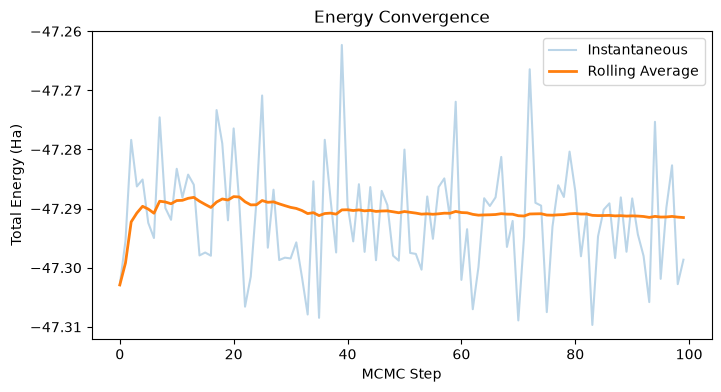

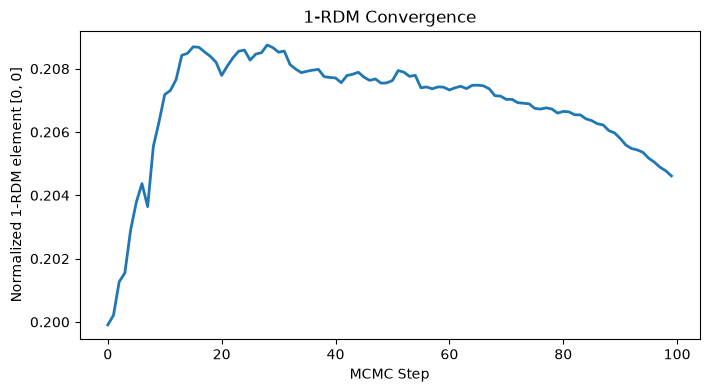

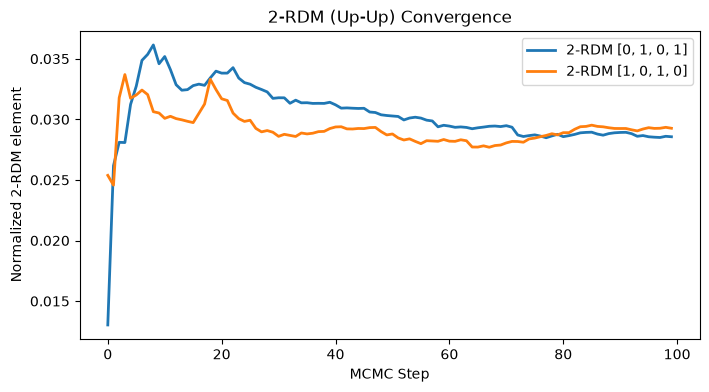

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


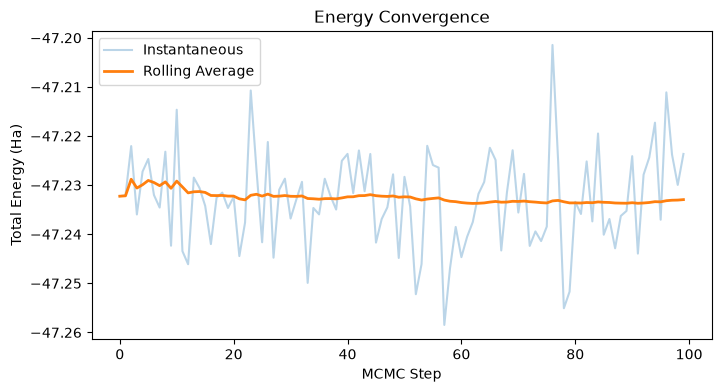

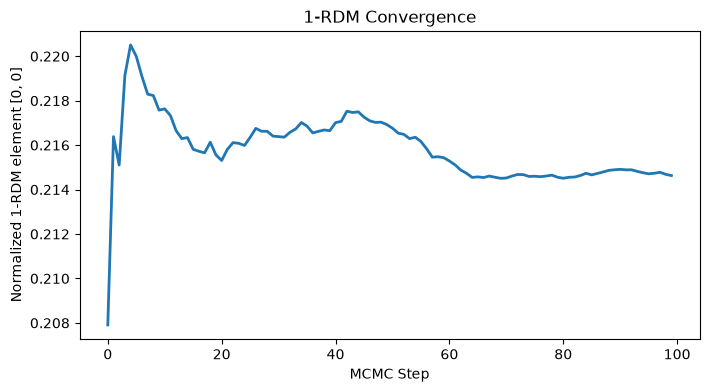

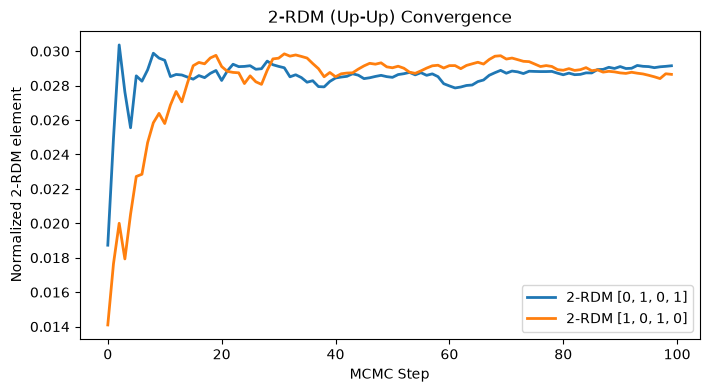

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


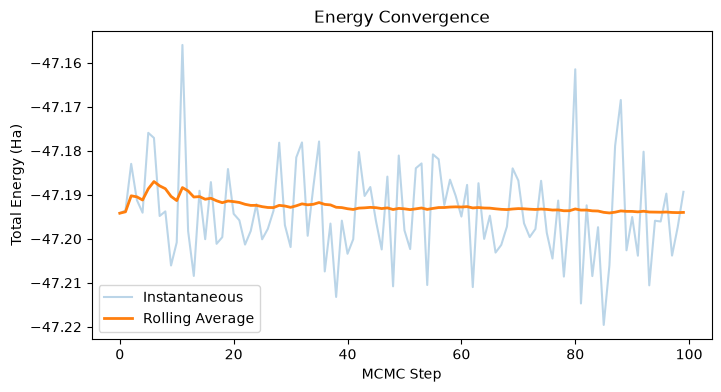

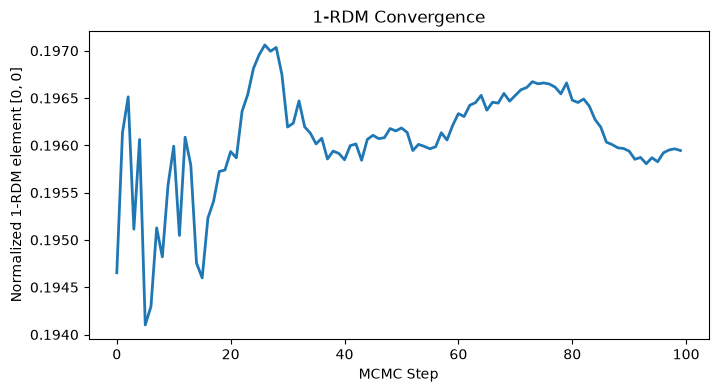

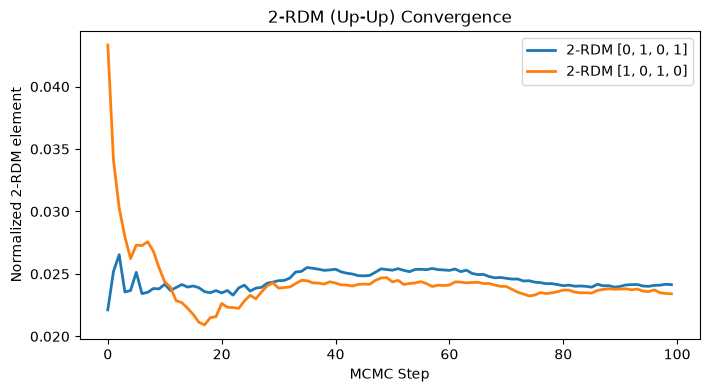

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


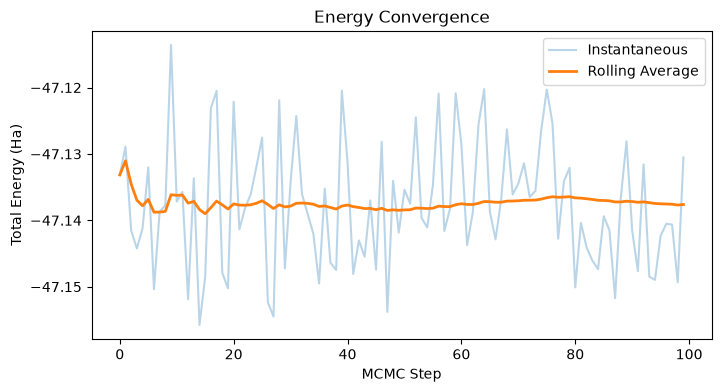

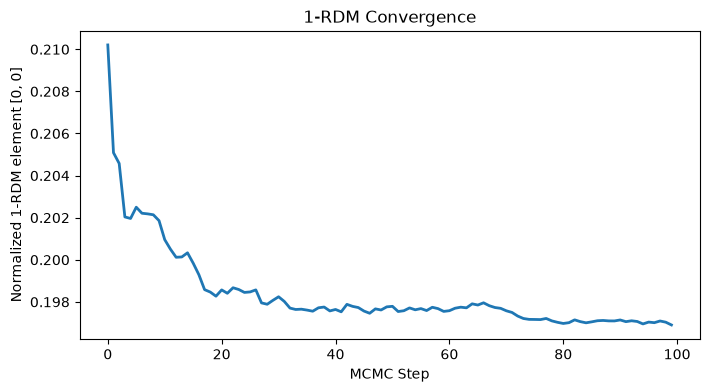

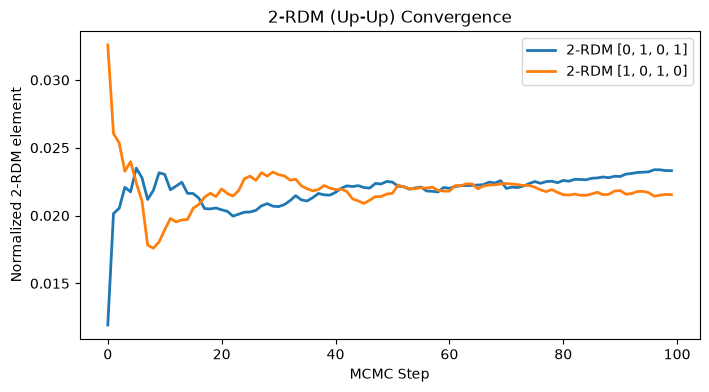

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


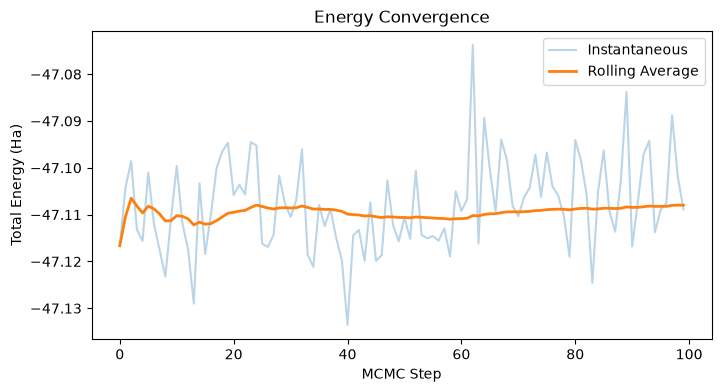

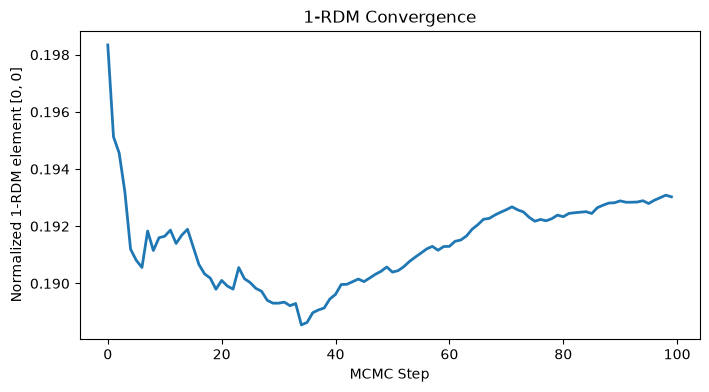

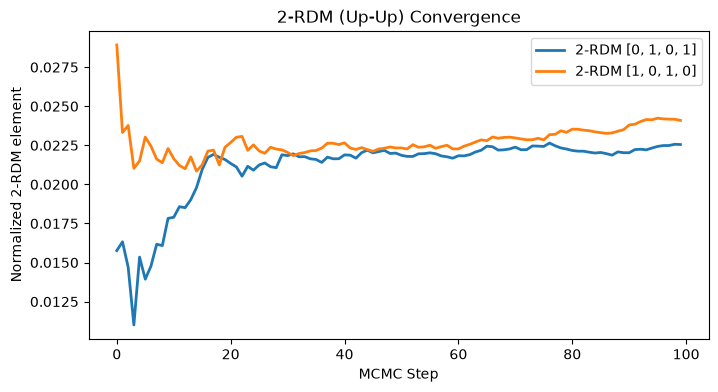

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


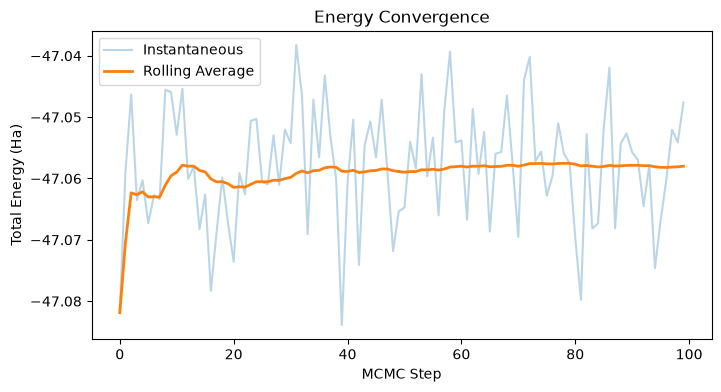

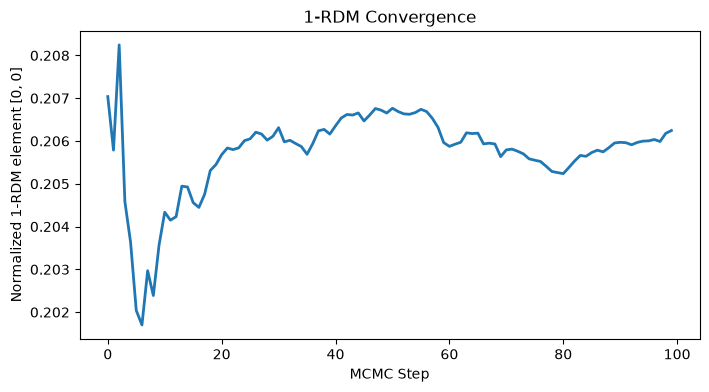

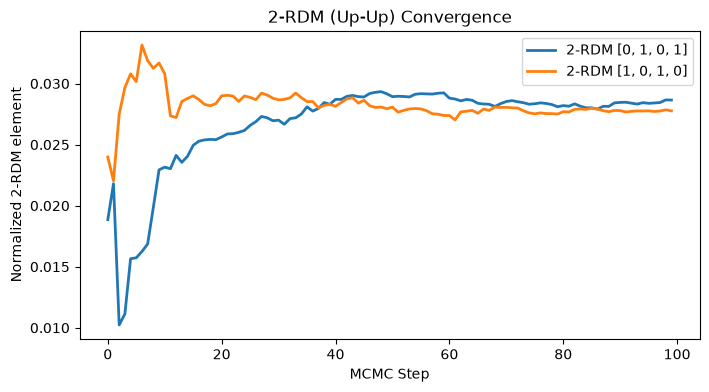

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


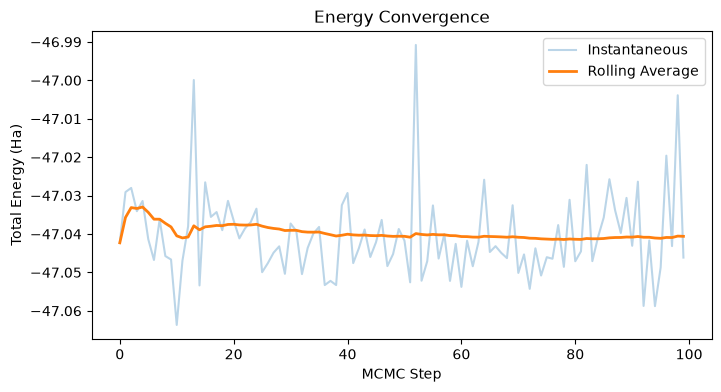

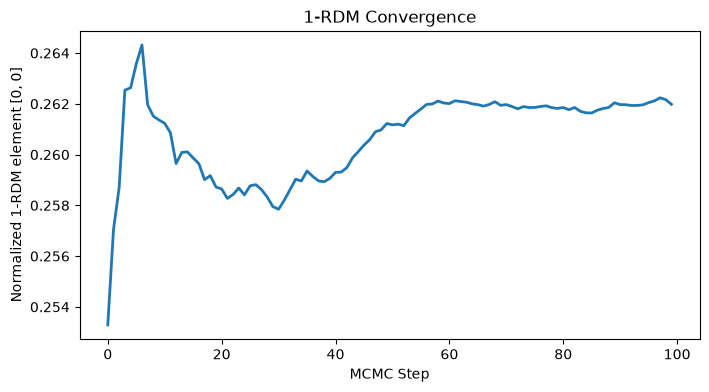

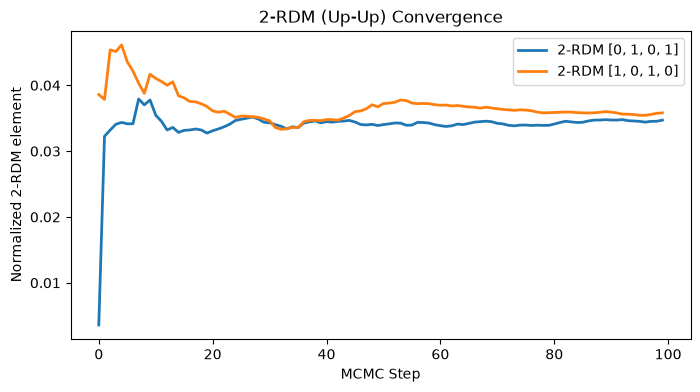

In [6]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# Path to your evaluation stats file
# h5_path = "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval/evaluation_stats.h5"

for h5_path in [
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval/evaluation_stats.h5",
]:
    print(h5_path)

    with h5py.File(h5_path, "r") as f:
        print("Available datasets:", list(f.keys()))
        
        # 1. Look at total energy convergence
        if 'total_energy_real' in f:
            energy = f['total_energy_real'][:]
            rolling_energy = np.cumsum(energy) / np.arange(1, len(energy) + 1)
            
            plt.figure(figsize=(8, 4))
            plt.plot(energy, alpha=0.3, label="Instantaneous")
            plt.plot(rolling_energy, linewidth=2, label="Rolling Average")
            plt.xlabel("MCMC Step")
            plt.ylabel("Total Energy (Ha)")
            plt.legend()
            plt.title("Energy Convergence")
            plt.show()
    
        # 2. Look at RDM convergence for a specific element, e.g., index [0, 1]
        if 'unnorm_gamma1_up_ii' in f and 'Ni_sq' in f:
            unnorm_gamma1 = f['unnorm_gamma1_up_ii'][:]
            ni_sq_i = f['Ni_sq'][:]
            
            # Calculate the normalized value at each step
            # Note: If your normalization Ni_sq is also accumulated over steps, 
            # you might want to use the rolling average of BOTH before dividing
            roll_unnorm = np.cumsum(unnorm_gamma1, axis=0) / np.arange(1, len(unnorm_gamma1) + 1)[:, None]
            roll_ni = np.cumsum(ni_sq_i, axis=0) / np.arange(1, len(ni_sq_i) + 1)[:, None]
            
            # Gamma normalized step-by-step
            roll_gamma1 = roll_unnorm / roll_ni
            
            # Let's say we want to plot the convergence of the 1-RDM element [0]
            plt.figure(figsize=(8, 4))
            plt.plot(roll_gamma1[:, 0], linewidth=2)
            plt.xlabel("MCMC Step")
            plt.ylabel("Normalized 1-RDM element [0, 0]")
            plt.title("1-RDM Convergence")
            plt.show()
    
        if 'unnorm_two_rdm_up_up' in f and 'Ni_sq' in f:
            unnorm_gamma2 = f['unnorm_two_rdm_up_up'][:]  # Shape: (steps, N_orbs, N_orbs, N_orbs, N_orbs)
            ni_sq = f['Ni_sq'][:]                         # Shape: (steps, N_orbs)
            
            # Calculate rolling averages over MCMC steps for the numerator
            roll_unnorm_gamma2 = np.cumsum(unnorm_gamma2, axis=0) / np.arange(1, len(unnorm_gamma2) + 1)[:, None, None, None, None]
            
            # Calculate rolling averages over MCMC steps for the normalizer
            roll_ni = np.cumsum(ni_sq, axis=0) / np.arange(1, len(ni_sq) + 1)[:, None]
            
            # For the full 2-RDM tensor (i, j, k, l), the normalizer is sqrt(N_i^2 * N_j^2 * N_k^2 * N_l^2)
            # Using broadcasting to construct the 4D normalization tensor
            norm_2rdm = np.sqrt(
                roll_ni[:, :, None, None, None] * 
                roll_ni[:, None, :, None, None] * 
                roll_ni[:, None, None, :, None] * 
                roll_ni[:, None, None, None, :]
            )
            
            # Gamma2 normalized step-by-step
            roll_gamma2 = roll_unnorm_gamma2 / norm_2rdm
            
            # Plot convergence of specific 2-RDM elements, e.g. [0, 1, 0, 1] and [1, 0, 1, 0]
            plt.figure(figsize=(8, 4))
            plt.plot(roll_gamma2[:, 0, 1, 0, 1], linewidth=2, label="2-RDM [0, 1, 0, 1]")
            plt.plot(roll_gamma2[:, 1, 0, 1, 0], linewidth=2, label="2-RDM [1, 0, 1, 0]")
            
            plt.xlabel("MCMC Step")
            plt.ylabel("Normalized 2-RDM element")
            plt.title("2-RDM (Up-Up) Convergence")
            plt.legend()
            plt.show()


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_stats.h5


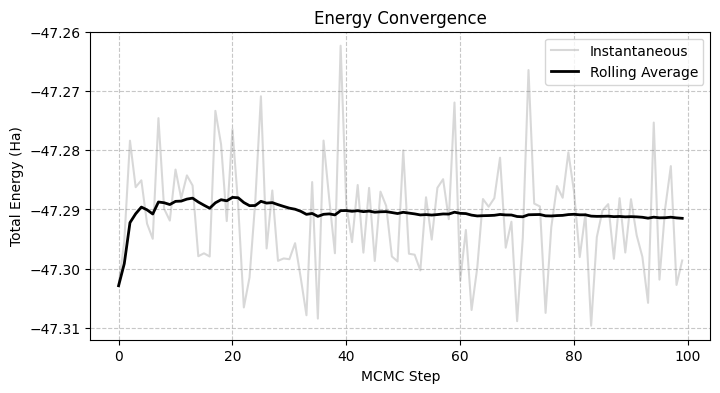

/home/jc2405/.local/lib/python3.11/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/jc2405/.local/lib/python3.11/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


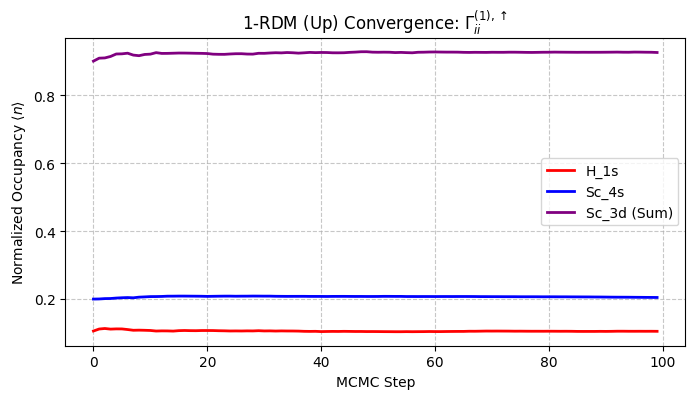

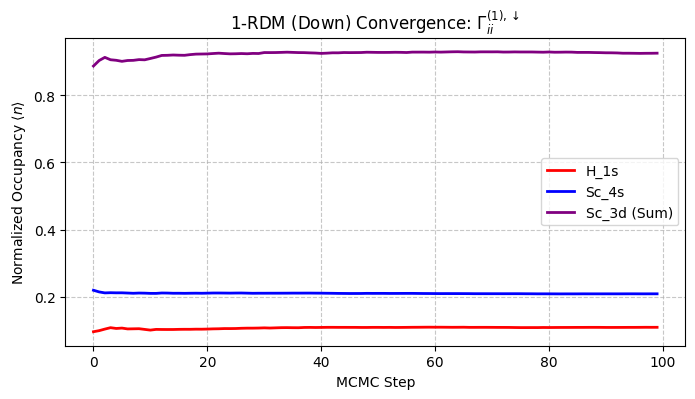

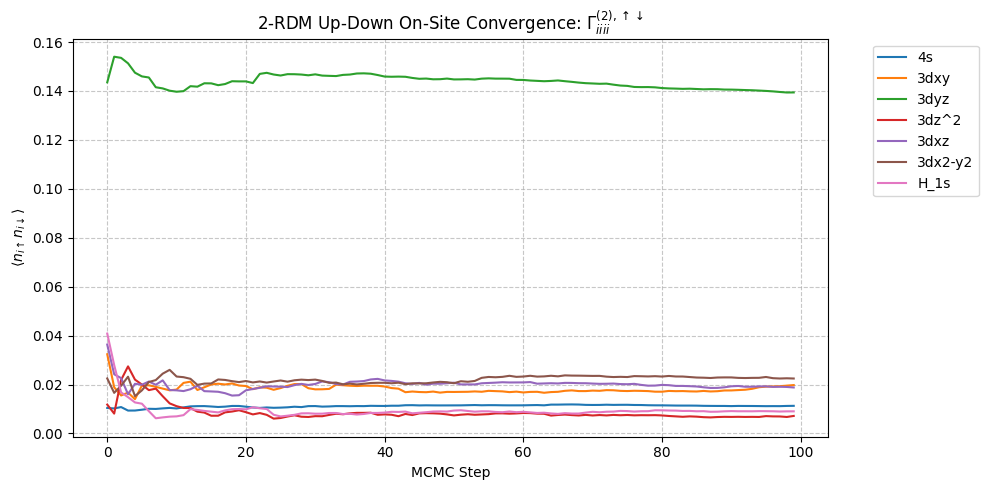

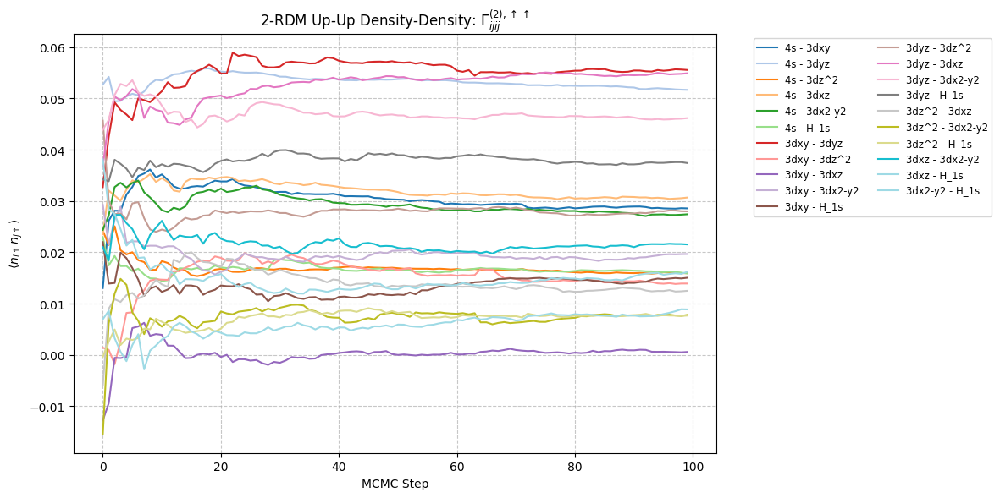

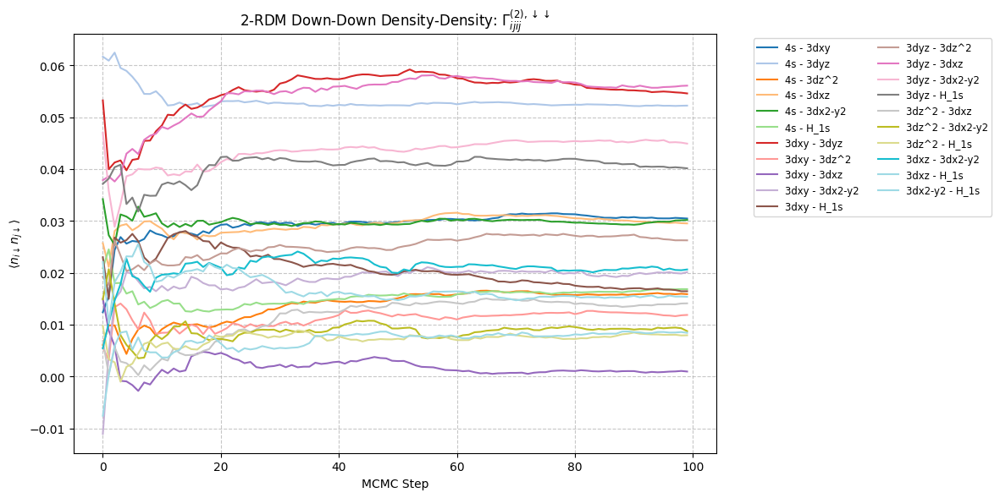

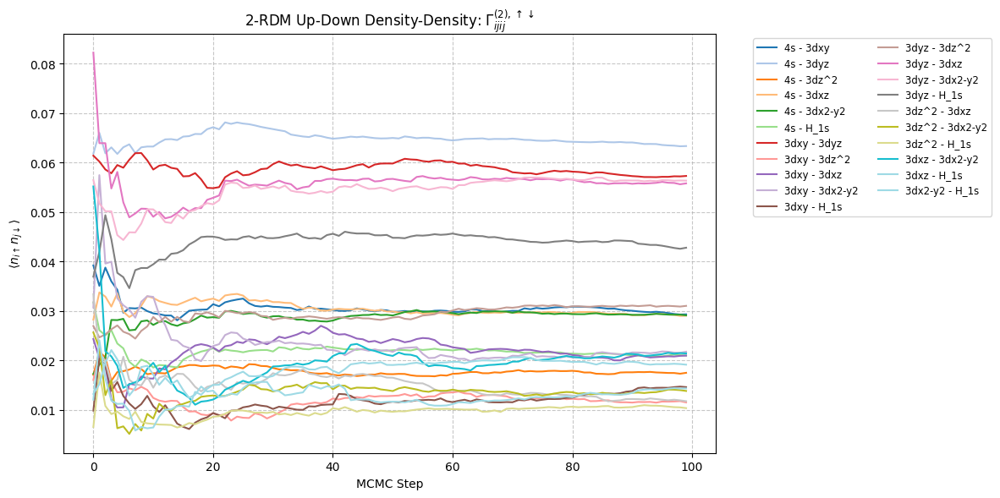

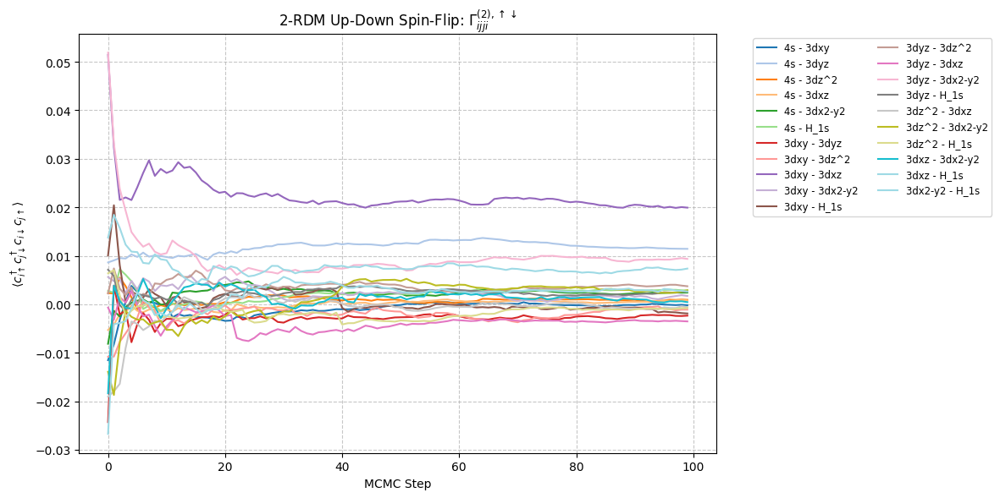


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval/evaluation_stats.h5


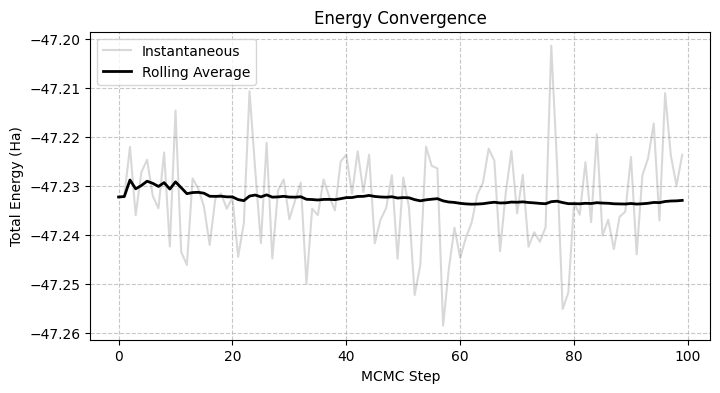

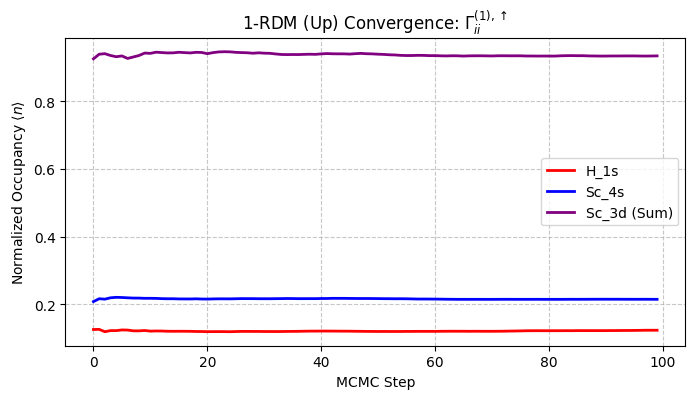

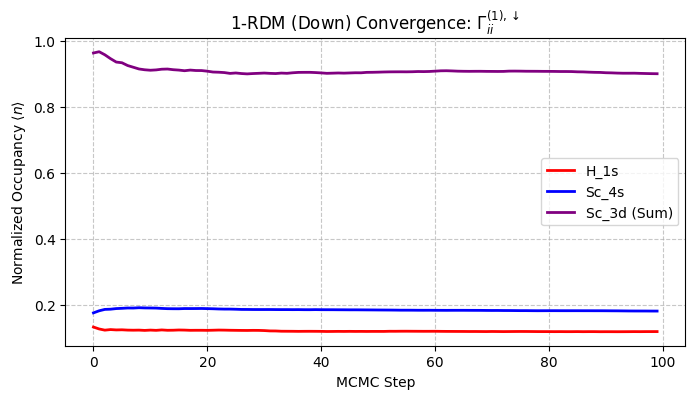

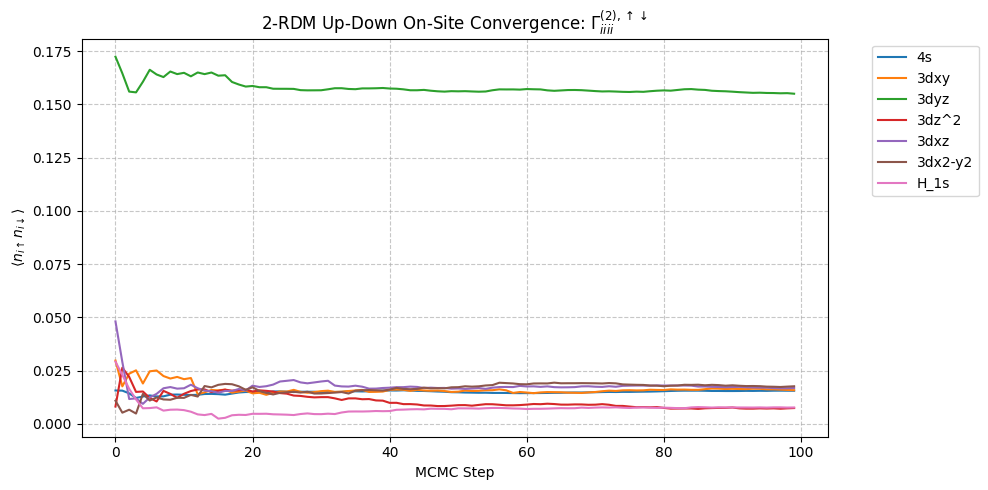

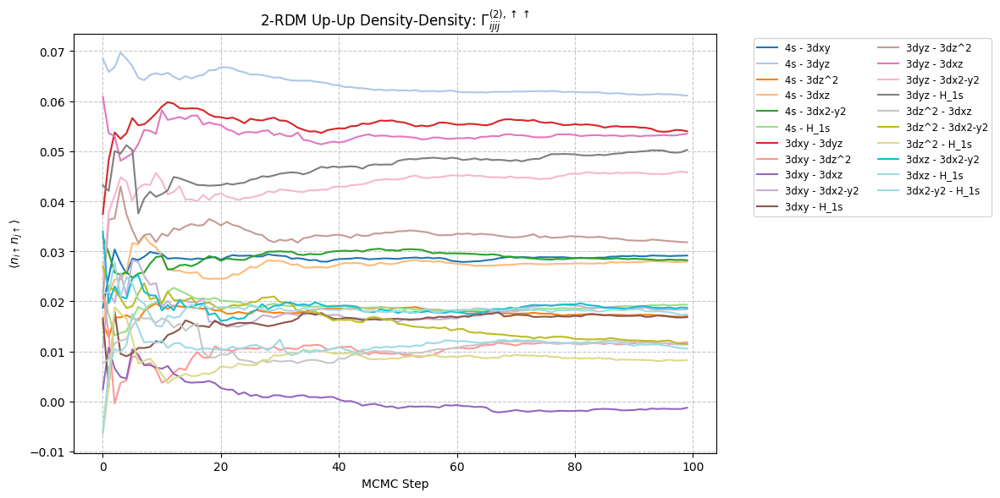

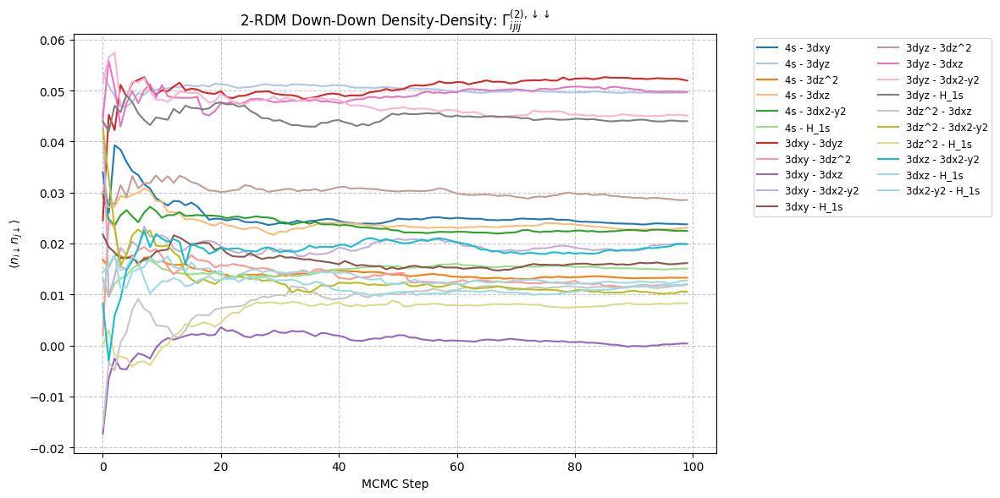

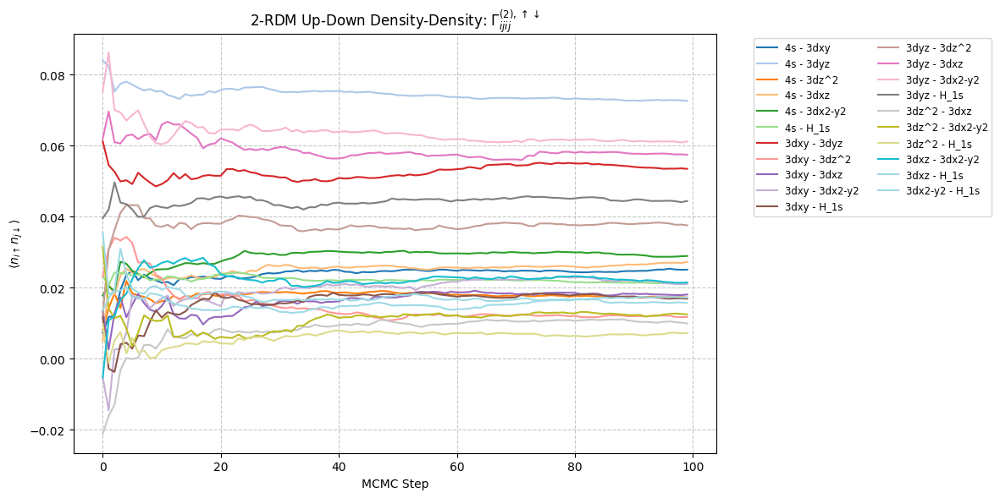

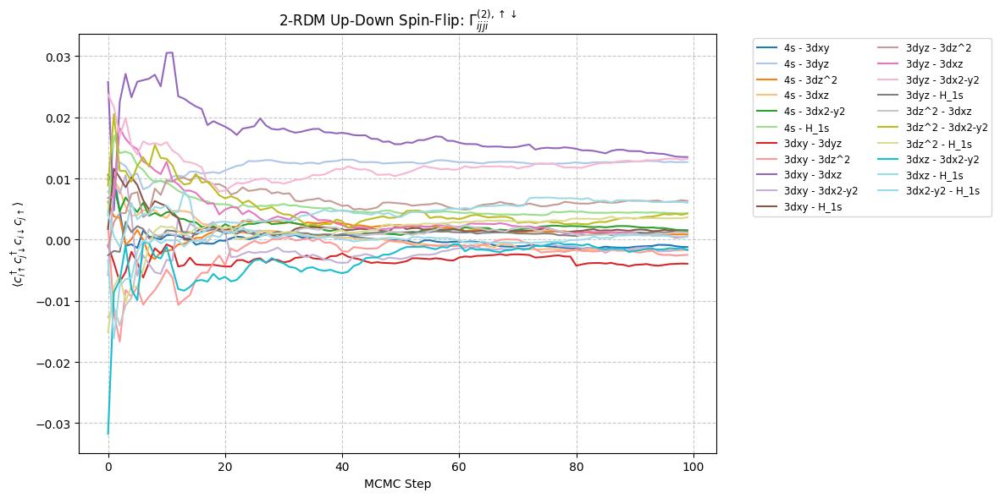


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval/evaluation_stats.h5


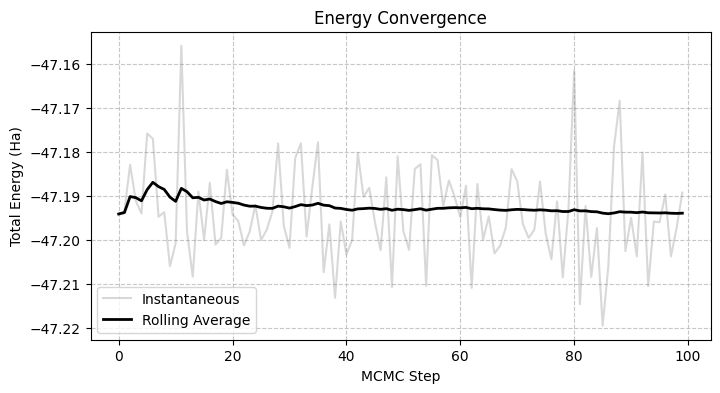

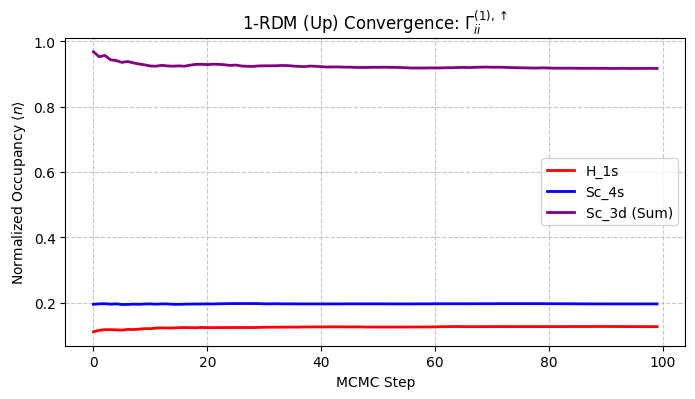

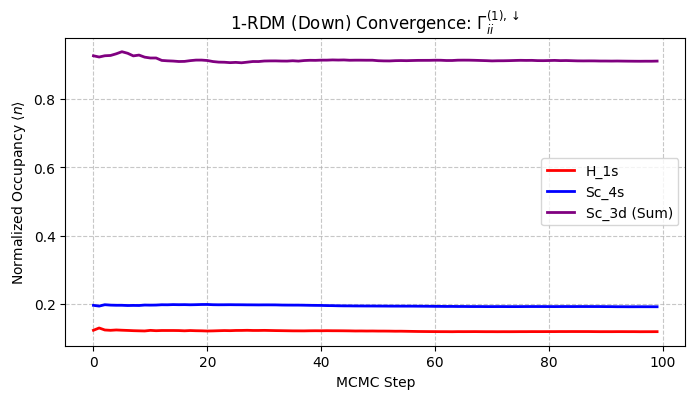

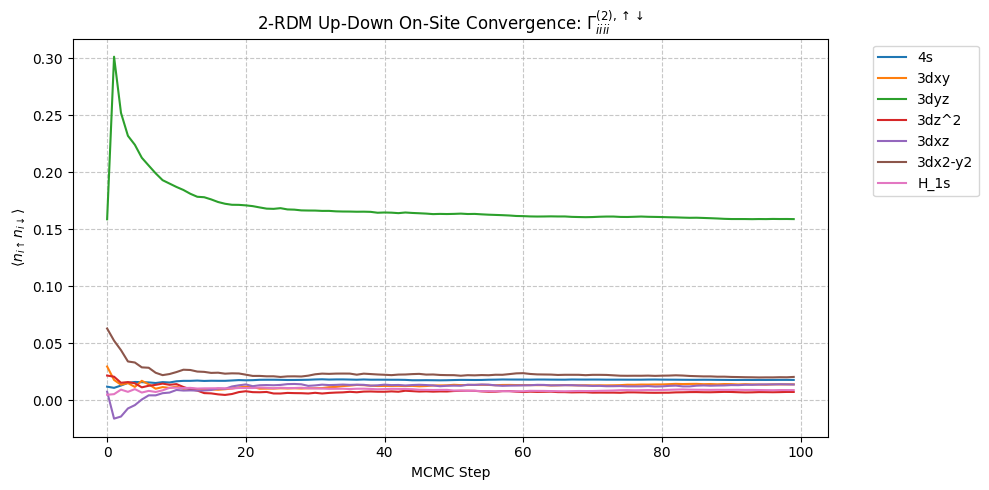

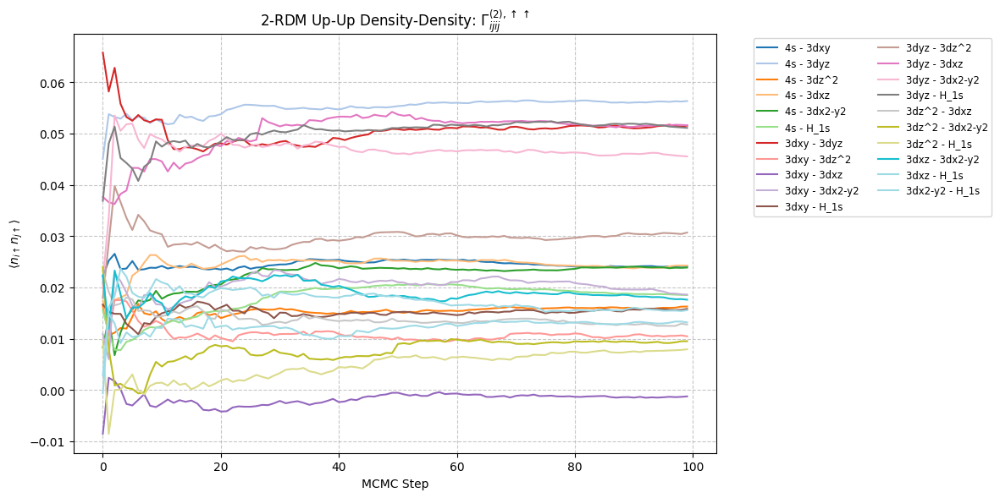

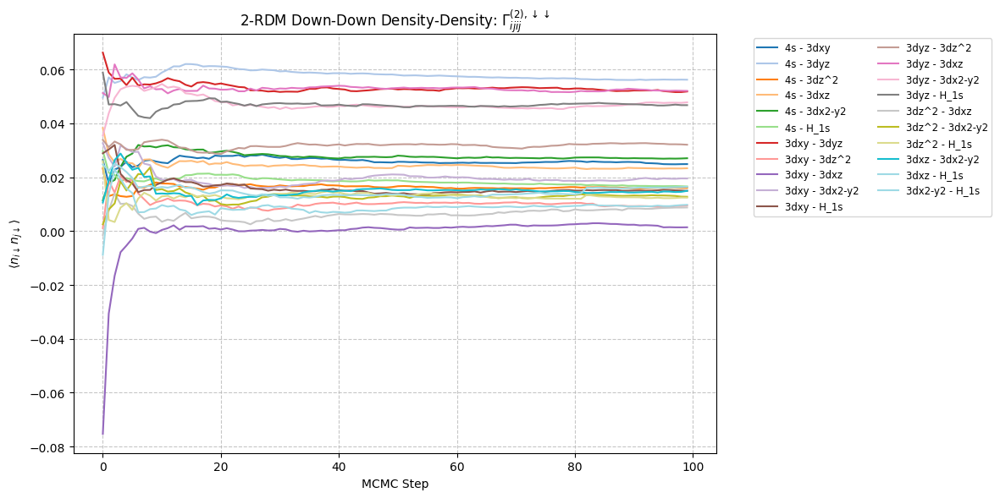

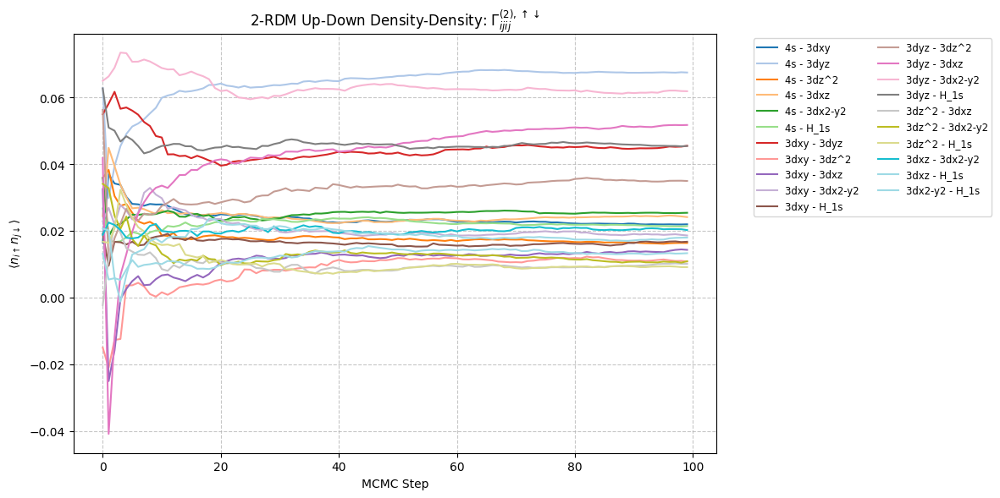

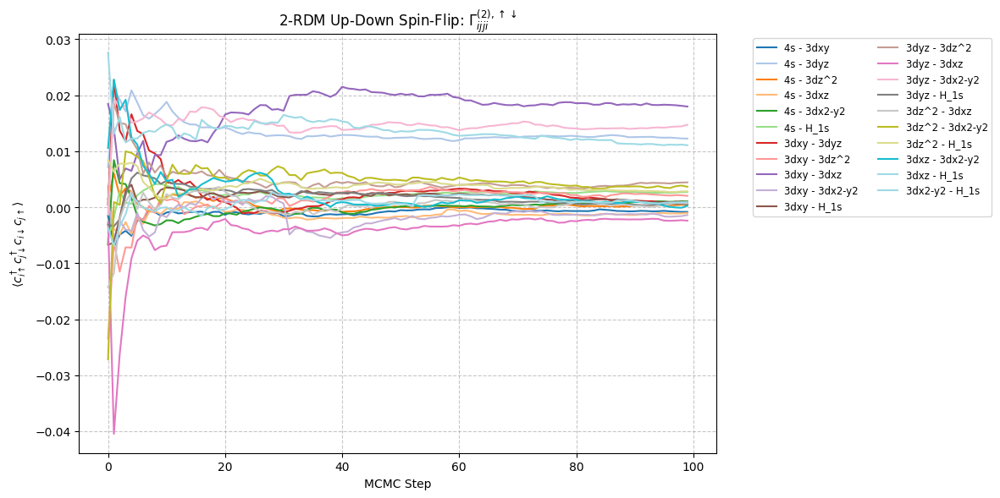


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval/evaluation_stats.h5


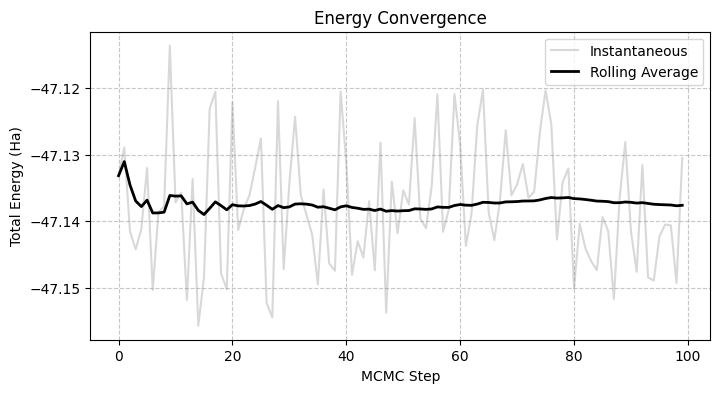

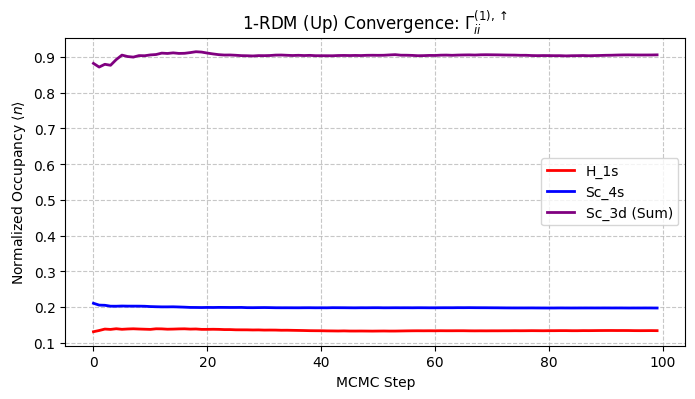

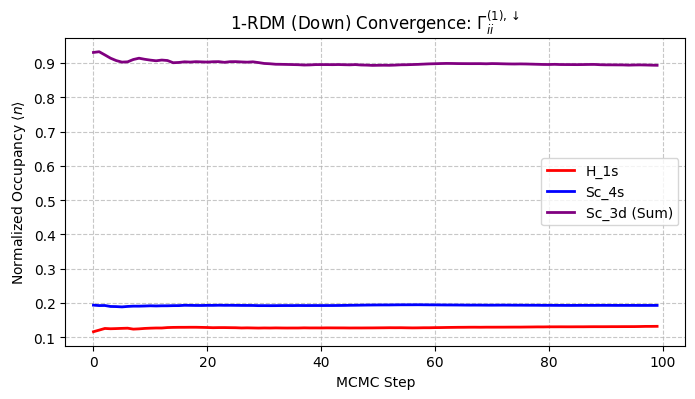

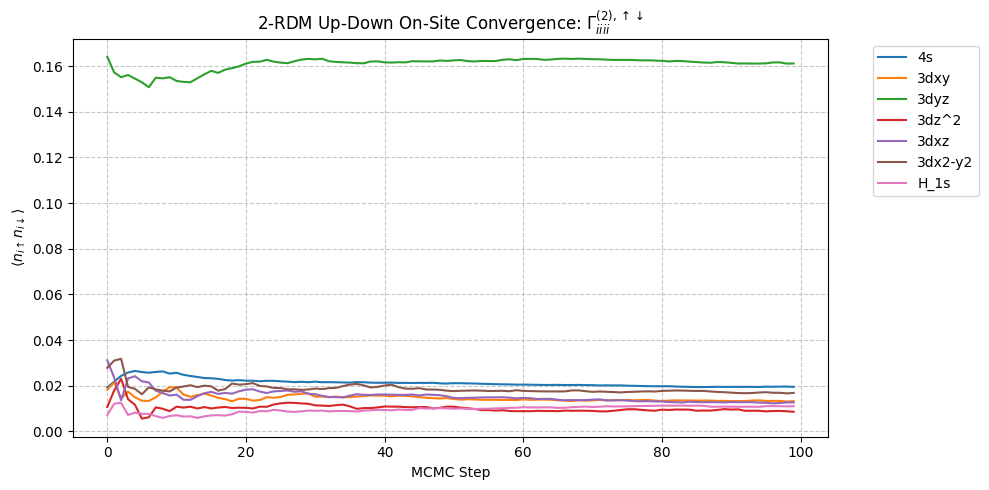

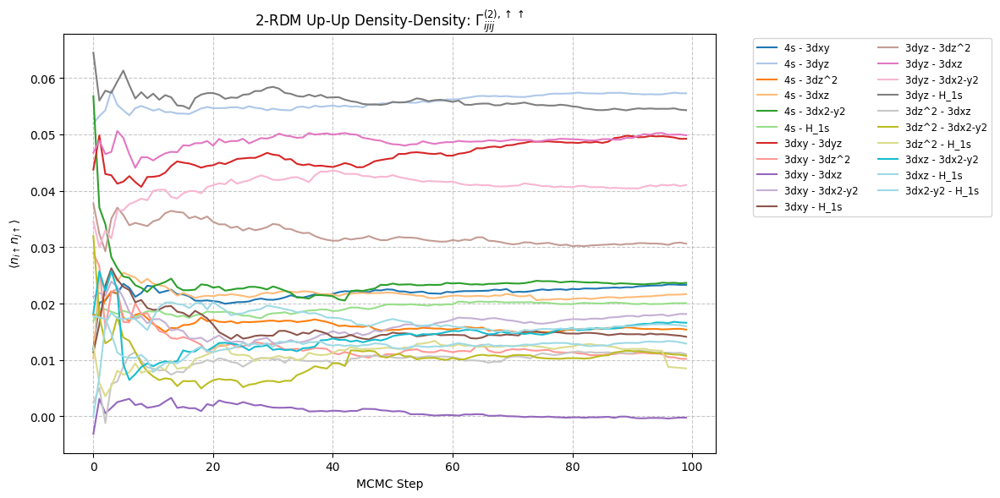

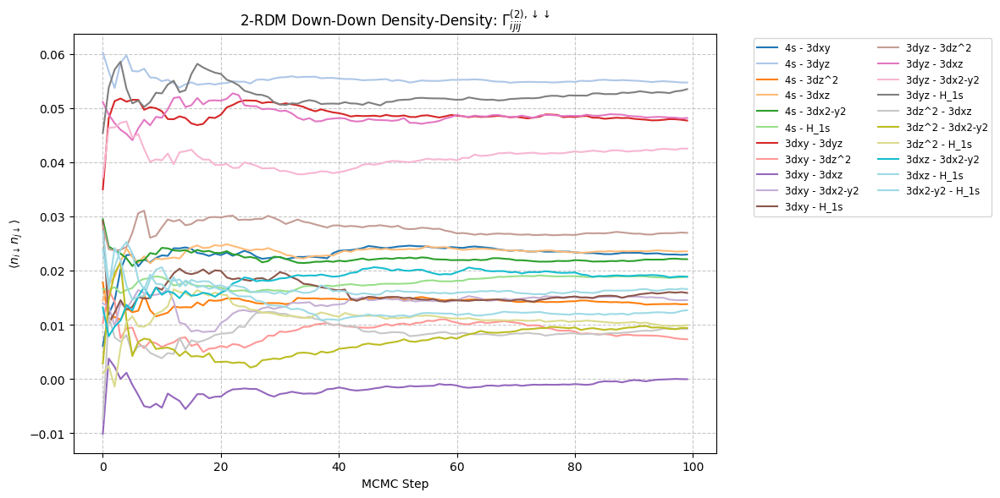

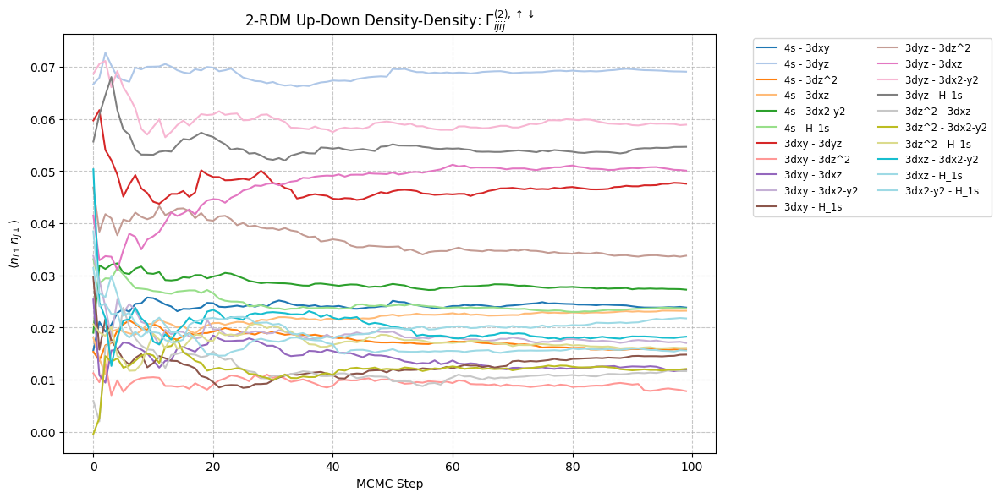

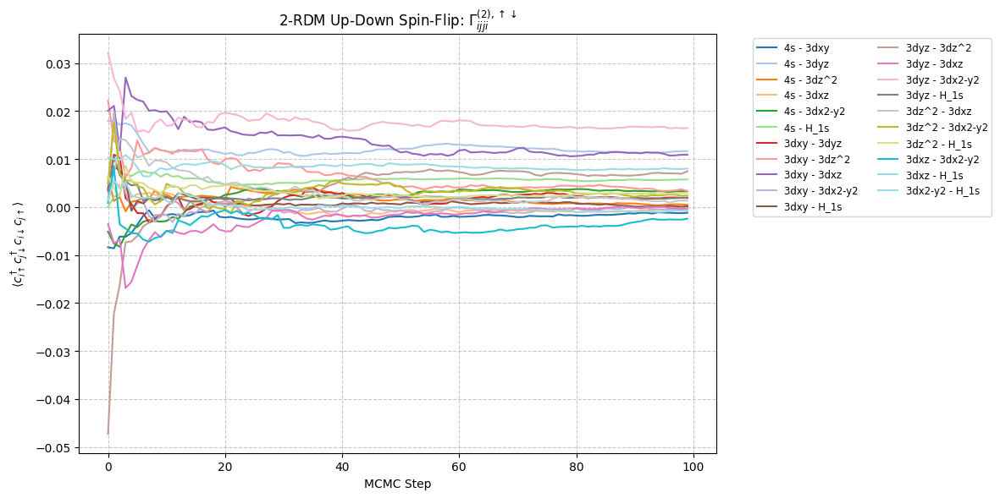


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval/evaluation_stats.h5


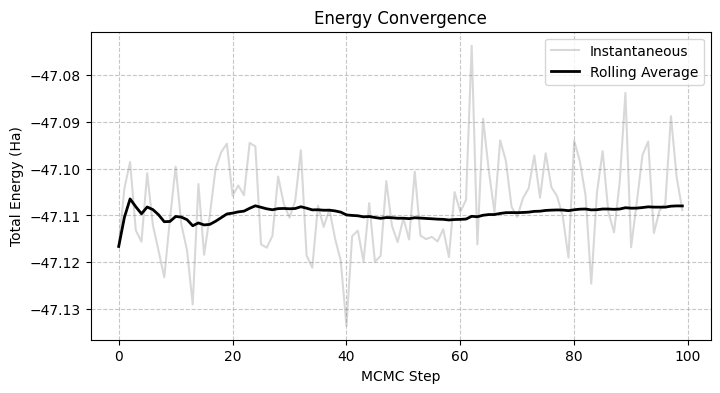

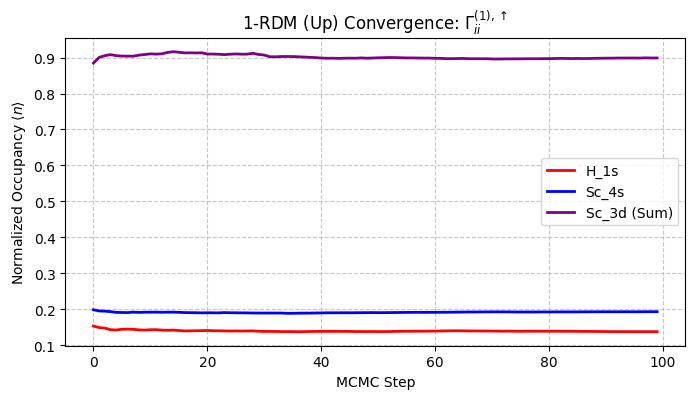

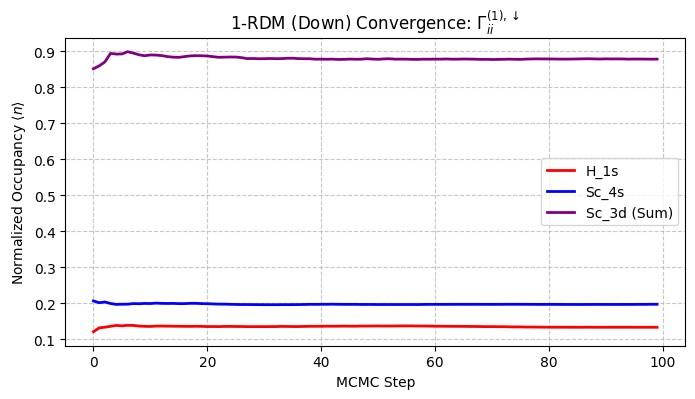

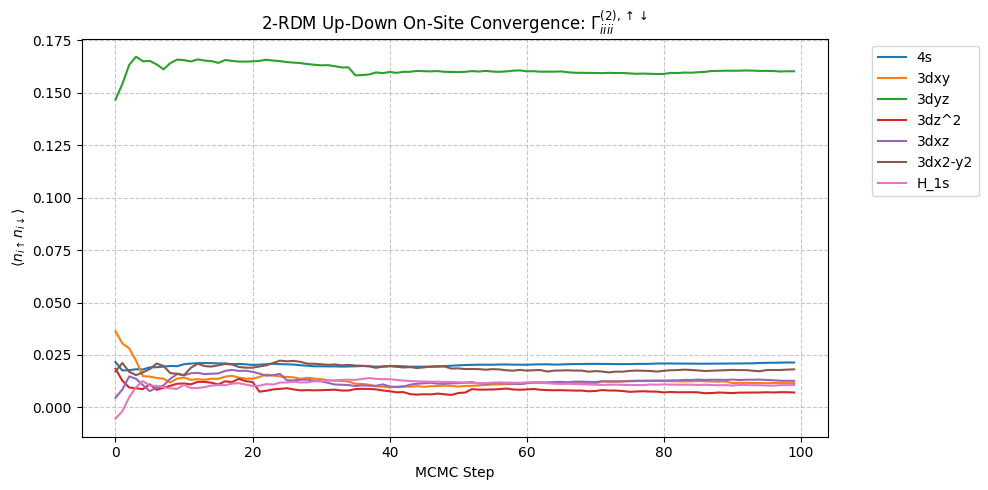

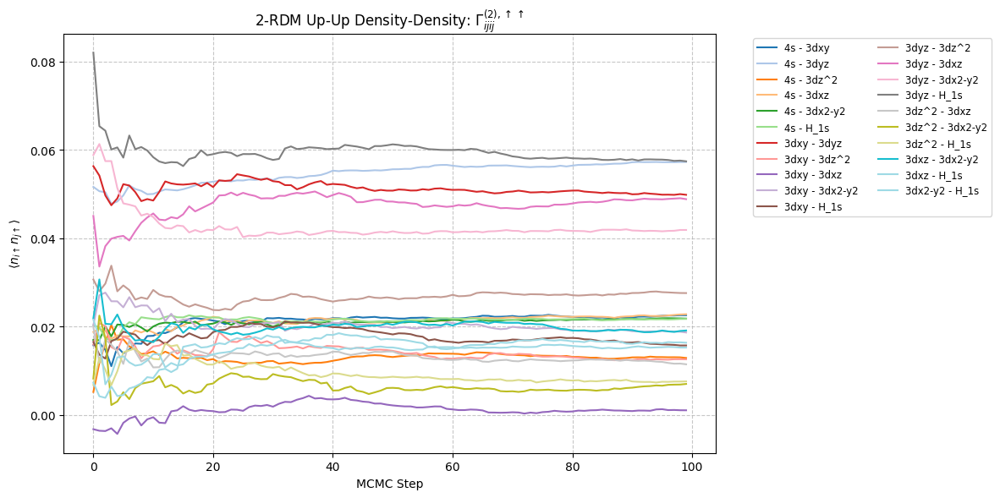

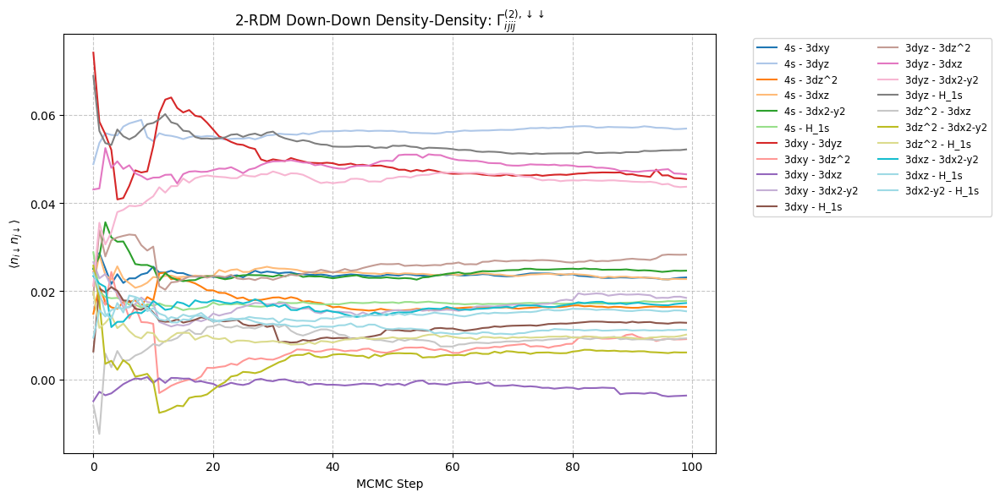

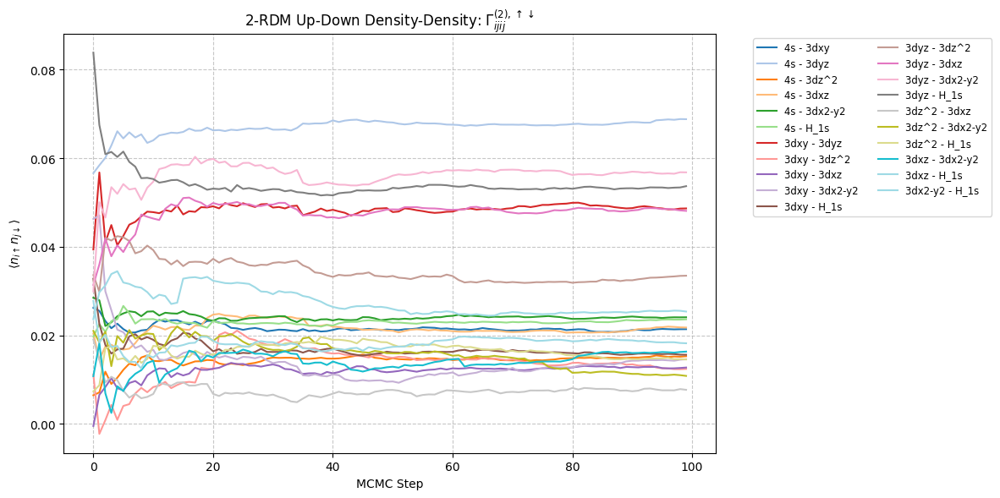

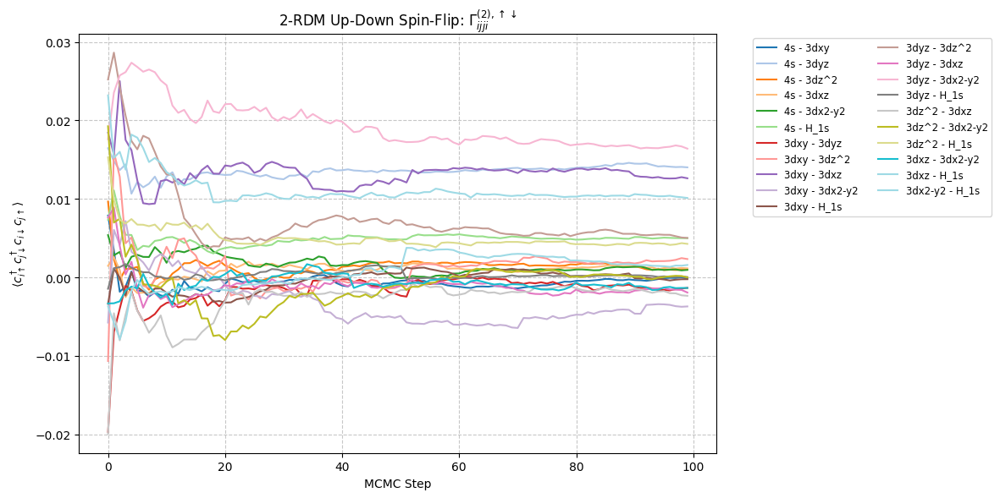


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval/evaluation_stats.h5


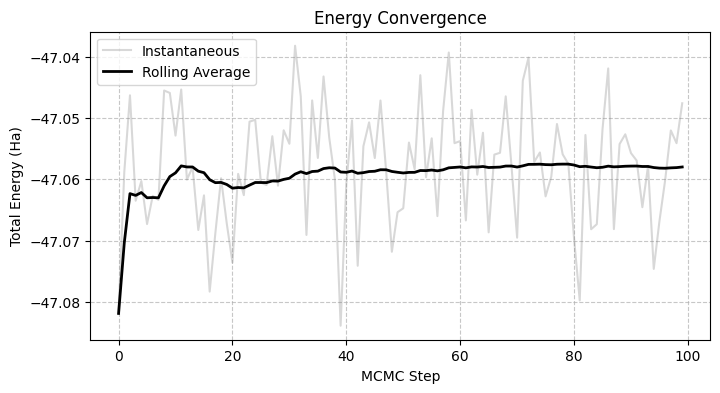

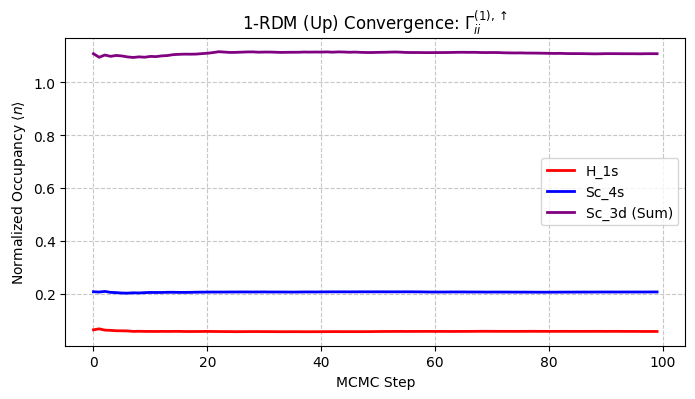

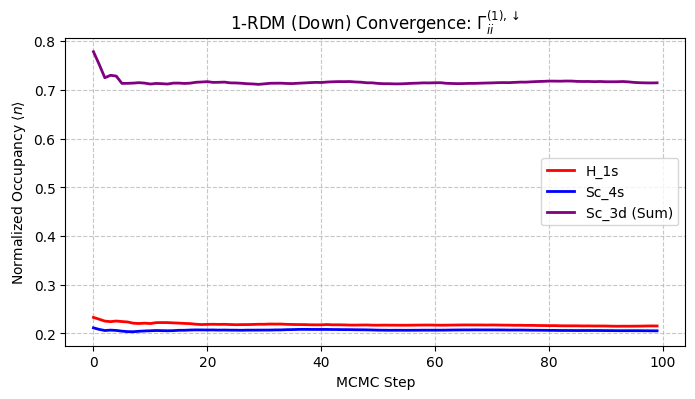

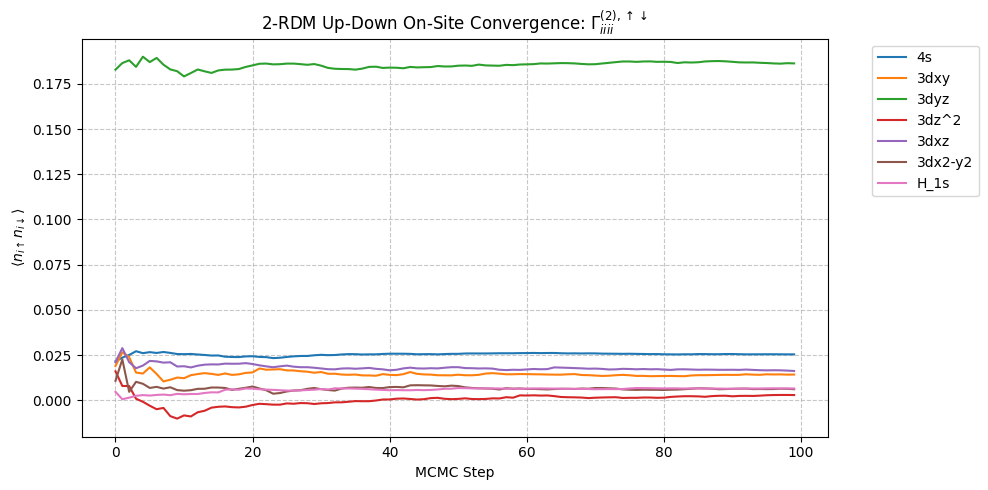

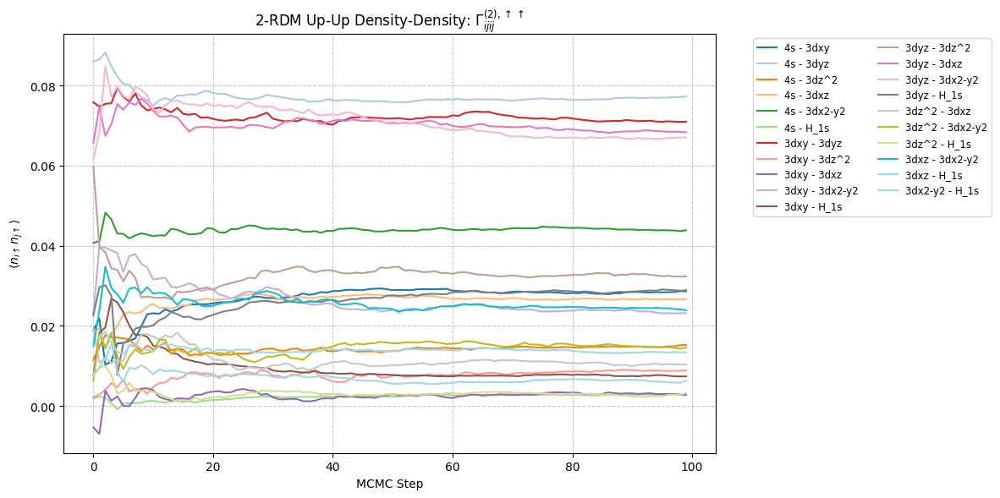

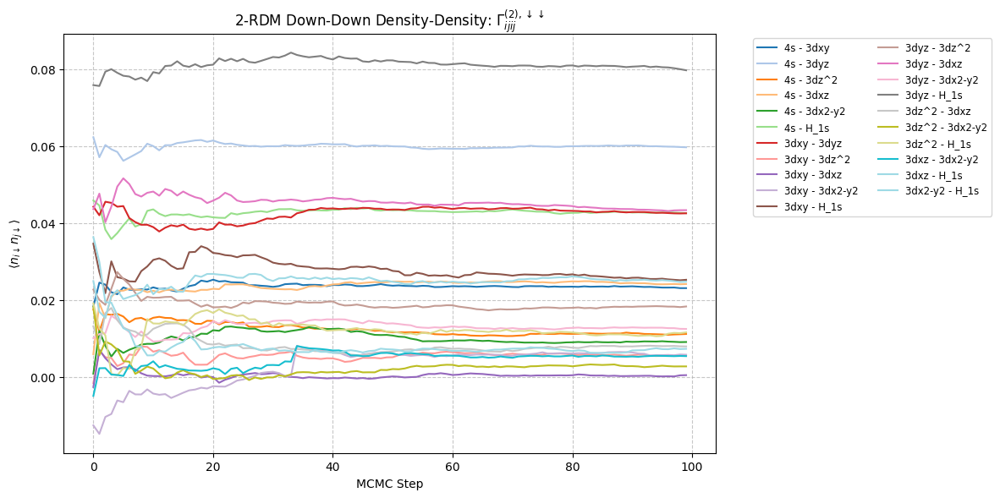

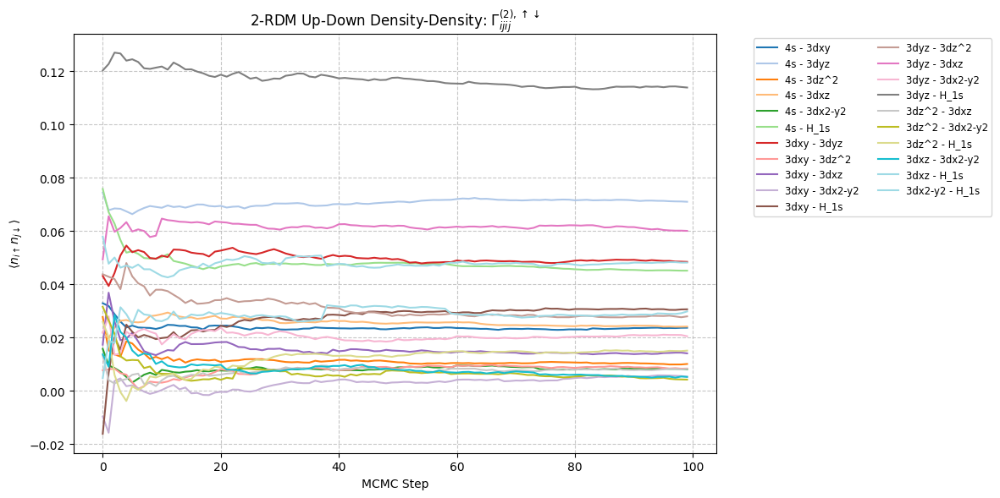

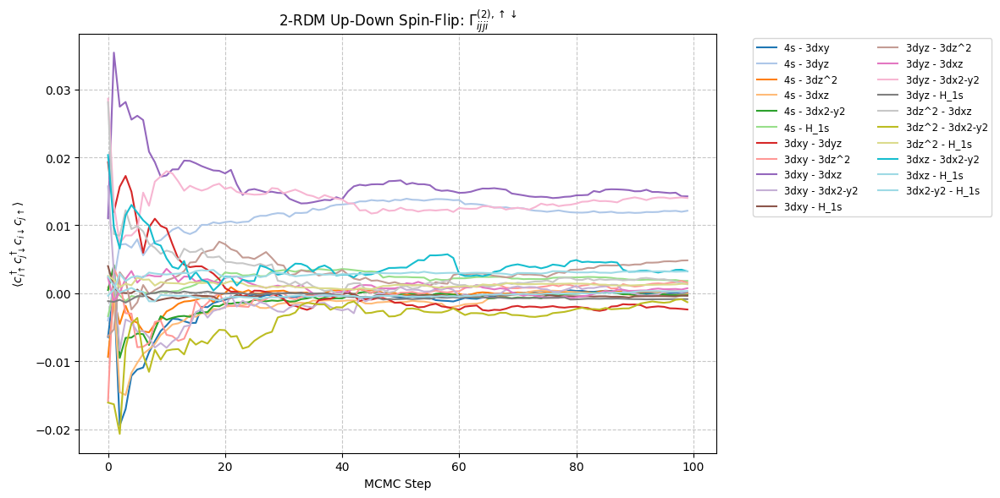


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval/evaluation_stats.h5


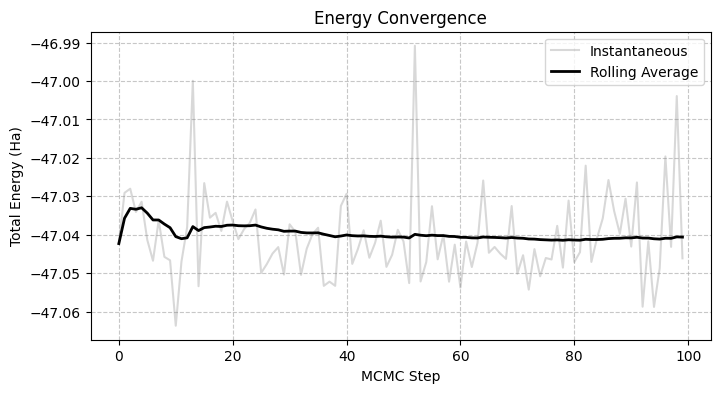

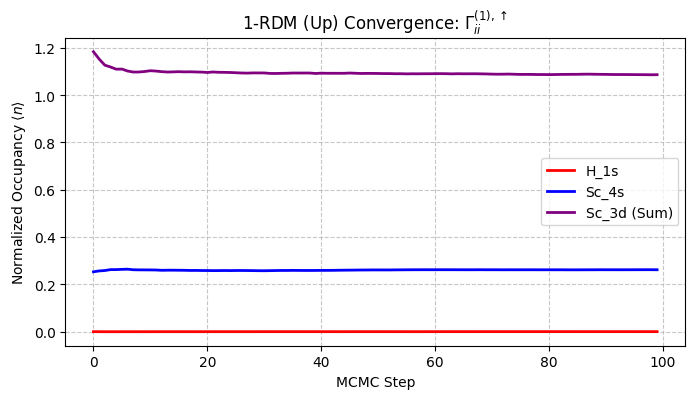

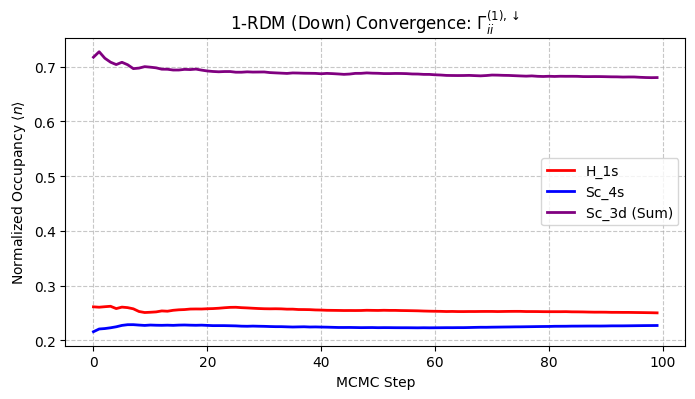

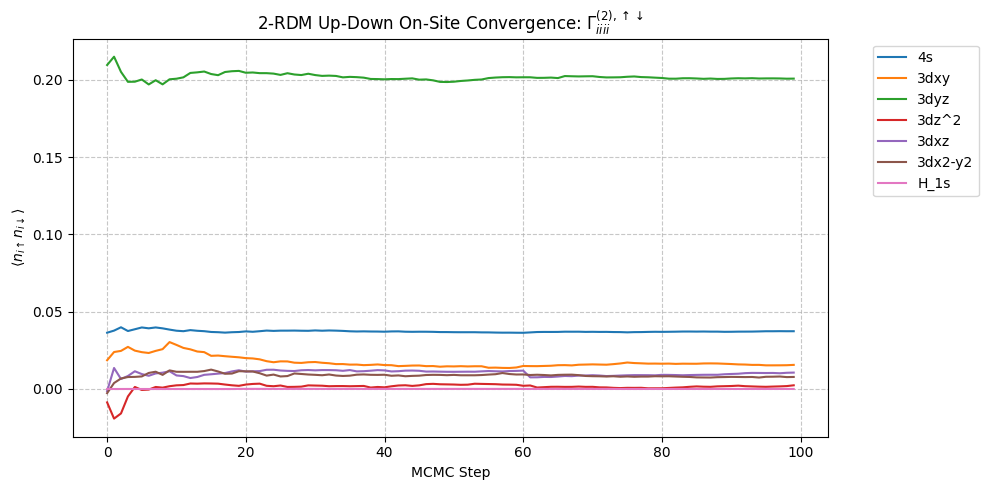

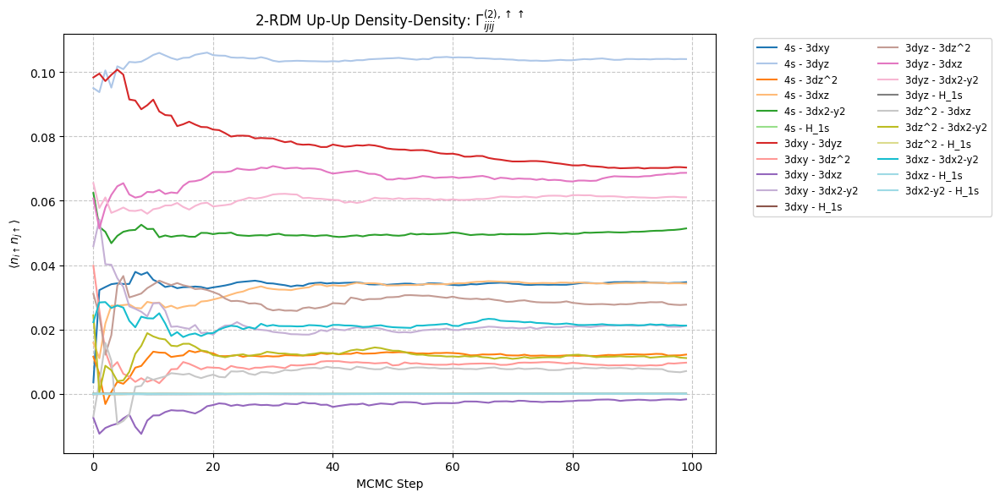

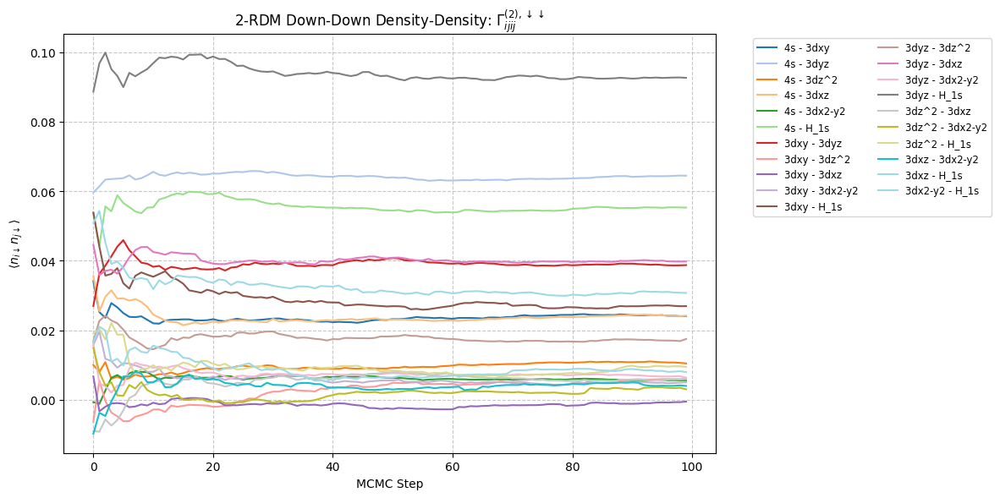

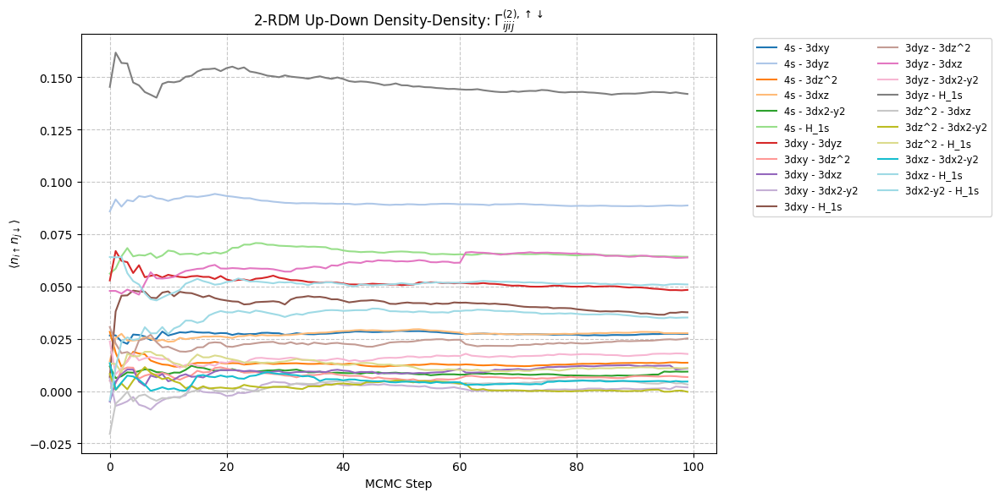

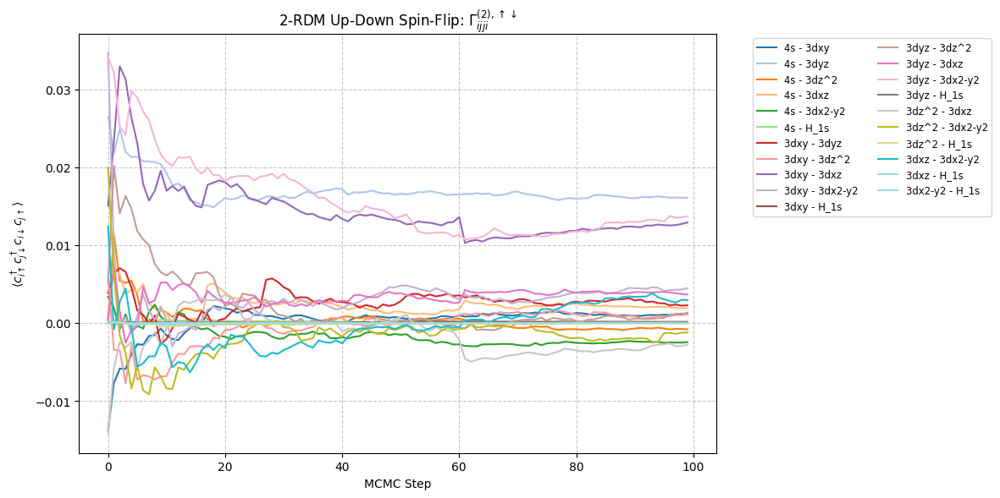

In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import matplotlib.cm as cm

run_paths = [
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval/evaluation_stats.h5",
]

orbitals = ['4s', '3dxy', '3dyz', '3dz^2', '3dxz', '3dx2-y2', 'H_1s']

# Get 21 distinct colors for the 7C2 combination plots
colors_21 = cm.tab20(np.linspace(0, 1, 21))

for h5_path in run_paths:
    print(f"\nProcessing: {h5_path}")

    with h5py.File(h5_path, "r") as f:
        
        # 1. Total Energy Convergence
        if 'total_energy_real' in f:
            energy = f['total_energy_real'][:]
            rolling_energy = np.cumsum(energy) / np.arange(1, len(energy) + 1)
            
            plt.figure(figsize=(8, 4))
            plt.plot(energy, alpha=0.3, label="Instantaneous", color='gray')
            plt.plot(rolling_energy, linewidth=2, label="Rolling Average", color='black')
            plt.xlabel("MCMC Step")
            plt.ylabel("Total Energy (Ha)")
            plt.legend()
            plt.title("Energy Convergence")
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.show()

        # Extract normalizer once for RDMs
        if 'Ni_sq' not in f:
            print("Ni_sq not found, skipping RDM plots.")
            continue
            
        ni_sq = f['Ni_sq'][:]
        roll_ni = np.cumsum(ni_sq, axis=0) / np.arange(1, len(ni_sq) + 1)[:, None]
        
        # 4D Normalizer Tensor for 2-RDM: sqrt(Ni^2 * Nj^2 * Nk^2 * Nl^2)
        norm_2rdm = np.sqrt(
            roll_ni[:, :, None, None, None] * 
            roll_ni[:, None, :, None, None] * 
            roll_ni[:, None, None, :, None] * 
            roll_ni[:, None, None, None, :]
        )

        # ==========================================
        # 1-RDM Convergence Plots
        # ==========================================
        def plot_1rdm(dataset_name, title):
            if dataset_name in f:
                unnorm_g1 = f[dataset_name][:]
                roll_g1 = (np.cumsum(unnorm_g1, axis=0) / 
                           np.arange(1, len(unnorm_g1) + 1)[:, None]) / roll_ni
                
                plt.figure(figsize=(8, 4))
                plt.plot(roll_g1[:, 6], linewidth=2, label='H_1s', color='red')
                plt.plot(roll_g1[:, 0], linewidth=2, label='Sc_4s', color='blue')
                
                # Sum over Sc_3d orbitals (indices 1 to 5)
                sc_3d_sum = np.sum(roll_g1[:, 1:6], axis=1)
                plt.plot(sc_3d_sum, linewidth=2, label='Sc_3d (Sum)', color='purple')
                
                plt.xlabel("MCMC Step")
                plt.ylabel(r"Normalized Occupancy $\langle n \rangle$")  # Fixed with 'r' prefix
                plt.title(title)
                plt.legend()
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.show()

        plot_1rdm('unnorm_gamma1_up_ii', r"1-RDM (Up) Convergence: $\Gamma^{(1),\uparrow}_{ii}$")
        plot_1rdm('unnorm_gamma1_down_ii', r"1-RDM (Down) Convergence: $\Gamma^{(1),\downarrow}_{ii}$")

        # ==========================================
        # 2-RDM Convergence Helper & Plots
        # ==========================================
        def get_norm_g2(dataset_name):
            if dataset_name in f:
                unnorm_g2 = f[dataset_name][:]
                roll_unnorm_g2 = (np.cumsum(unnorm_g2, axis=0) / 
                                  np.arange(1, len(unnorm_g2) + 1)[:, None, None, None, None])
                return roll_unnorm_g2 / norm_2rdm
            return None

        # Load normalized 2-RDMs
        g2_ud = get_norm_g2('unnorm_two_rdm_up_down')
        g2_uu = get_norm_g2('unnorm_two_rdm_up_up')
        g2_dd = get_norm_g2('unnorm_two_rdm_down_down')

        # 3. Gamma2_iiii (up_down) - On-site double occupancy
        if g2_ud is not None:
            plt.figure(figsize=(10, 5))
            for i in range(7):
                plt.plot(g2_ud[:, i, i, i, i], linewidth=1.5, label=orbitals[i])
            plt.xlabel("MCMC Step")
            plt.ylabel(r"$\langle n_{i\uparrow} n_{i\downarrow} \rangle$")
            plt.title(r"2-RDM Up-Down On-Site Convergence: $\Gamma^{(2),\uparrow\downarrow}_{iiii}$")
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()

        # Function to plot 7C2 pairs (ijij or ijji tensor slices)
        def plot_7c2(tensor, title, y_label):
            if tensor is None:
                return
            plt.figure(figsize=(12, 6))
            pairs = list(combinations(range(7), 2))
            
            for idx, (i, j) in enumerate(pairs):
                label_str = f"{orbitals[i]} - {orbitals[j]}"
                plt.plot(tensor[:, idx], linewidth=1.5, color=colors_21[idx], label=label_str)
                
            plt.xlabel("MCMC Step")
            plt.ylabel(y_label)
            plt.title(title)
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2, fontsize='small')
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()

        # 4. Gamma2_ijij (up_up) - Density-density
        if g2_uu is not None:
            g2_uu_pairs = np.array([g2_uu[:, i, j, i, j] for i, j in combinations(range(7), 2)]).T
            plot_7c2(g2_uu_pairs, r"2-RDM Up-Up Density-Density: $\Gamma^{(2),\uparrow\uparrow}_{ijij}$", r"$\langle n_{i\uparrow} n_{j\uparrow} \rangle$")

        # 5. Gamma2_ijij (down_down) - Density-density
        if g2_dd is not None:
            g2_dd_pairs = np.array([g2_dd[:, i, j, i, j] for i, j in combinations(range(7), 2)]).T
            plot_7c2(g2_dd_pairs, r"2-RDM Down-Down Density-Density: $\Gamma^{(2),\downarrow\downarrow}_{ijij}$", r"$\langle n_{i\downarrow} n_{j\downarrow} \rangle$")

        # 6. Gamma2_ijij (up_down) - Density-density
        if g2_ud is not None:
            g2_ud_pairs = np.array([g2_ud[:, i, j, i, j] for i, j in combinations(range(7), 2)]).T
            plot_7c2(g2_ud_pairs, r"2-RDM Up-Down Density-Density: $\Gamma^{(2),\uparrow\downarrow}_{ijij}$", r"$\langle n_{i\uparrow} n_{j\downarrow} \rangle$")

        # 7. Gamma2_ijji (up_down) - Spin-flip / Exchange
        if g2_ud is not None:
            g2_ud_flip_pairs = np.array([g2_ud[:, i, j, j, i] for i, j in combinations(range(7), 2)]).T
            plot_7c2(g2_ud_flip_pairs, r"2-RDM Up-Down Spin-Flip: $\Gamma^{(2),\uparrow\downarrow}_{ijji}$", r"$\langle c^\dagger_{i\uparrow} c^\dagger_{j\downarrow} c_{i\downarrow} c_{j\uparrow} \rangle$")


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_stats.h5


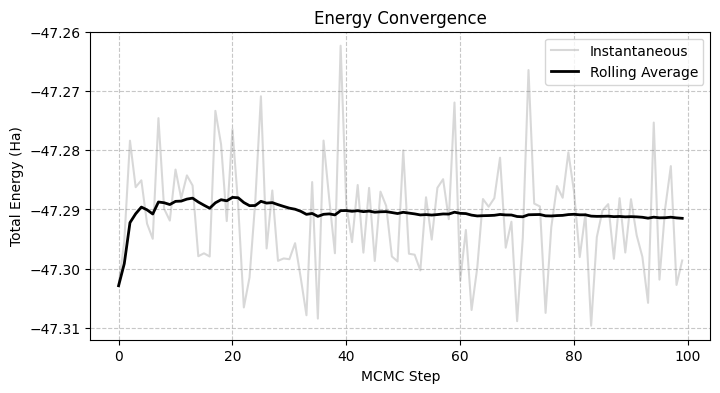

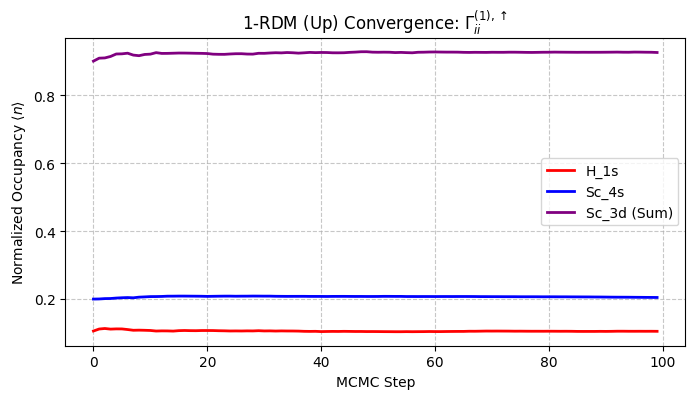

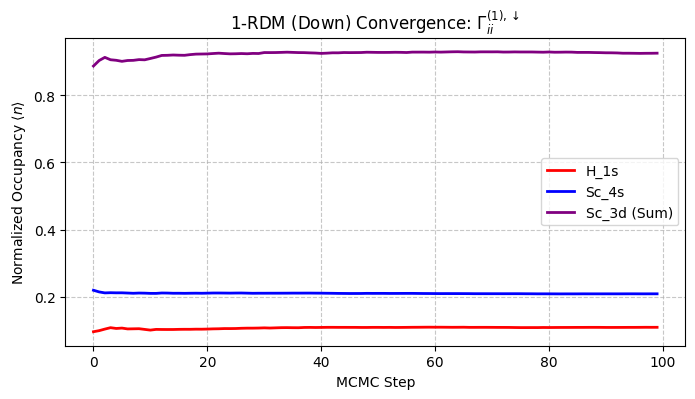

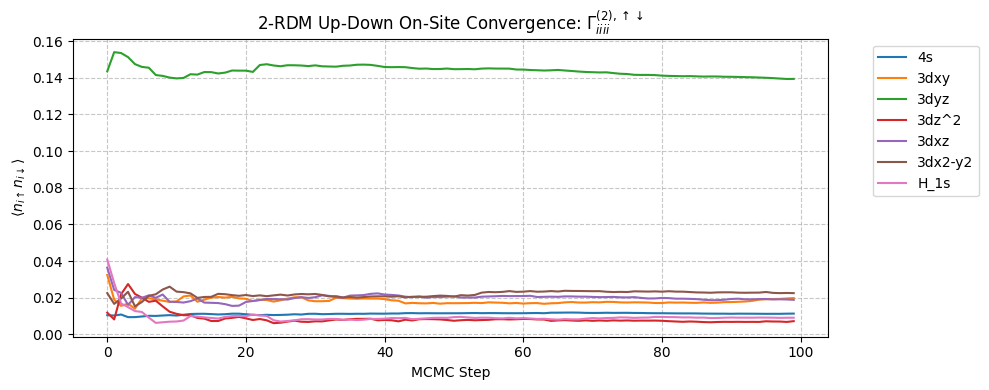

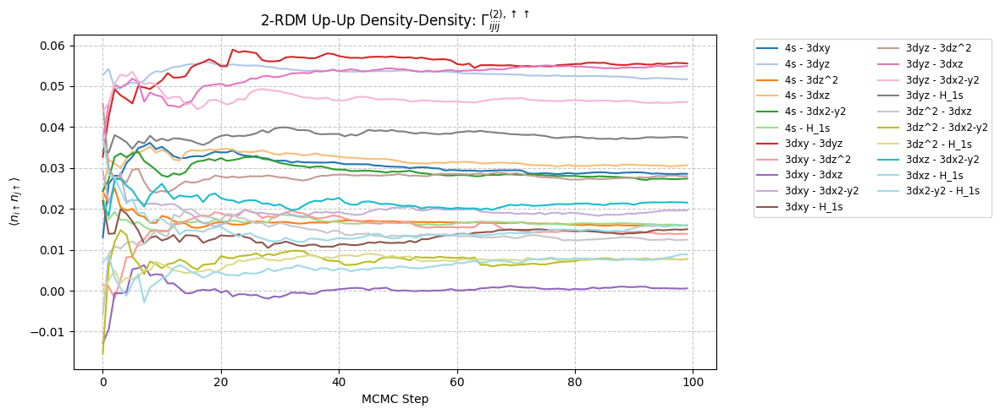

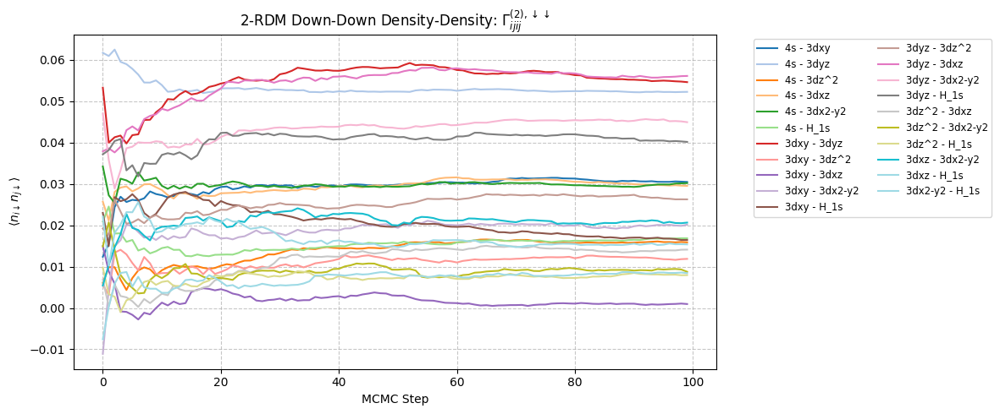

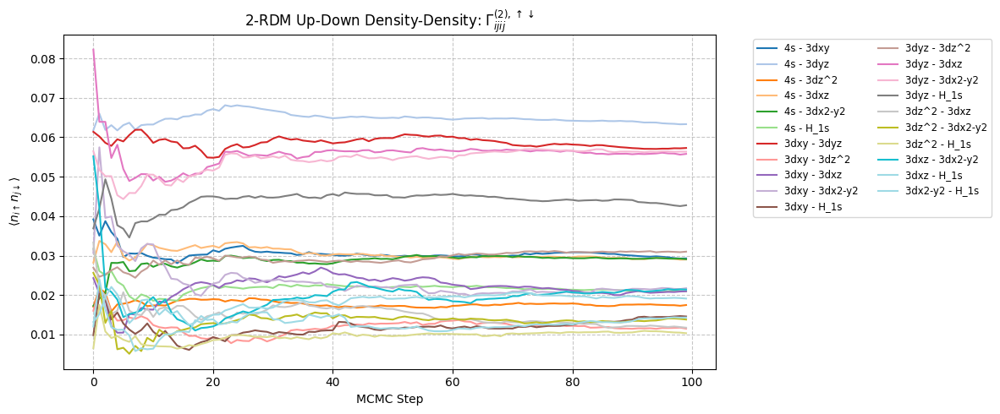

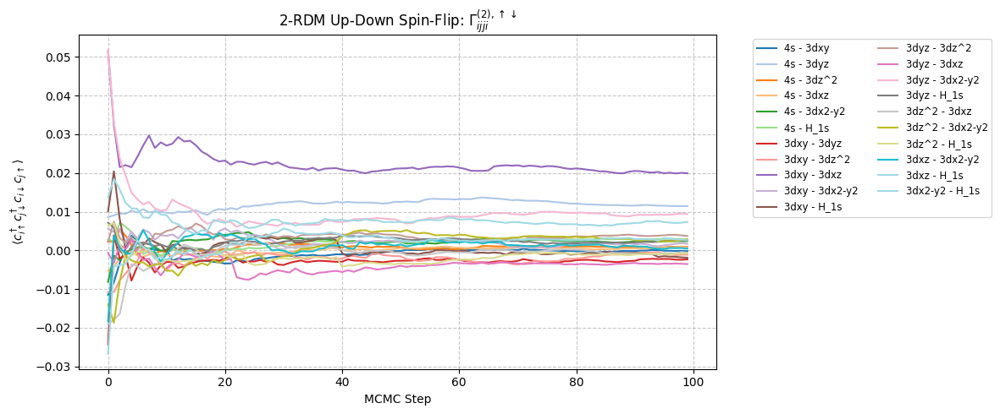

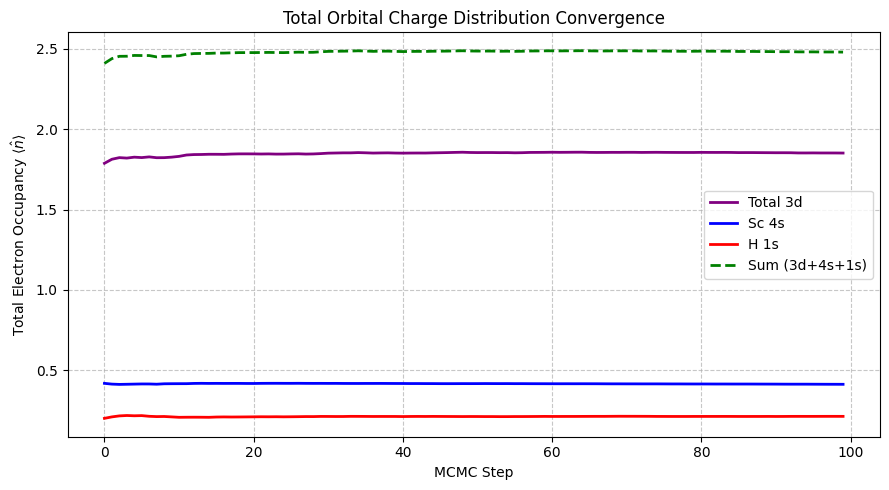

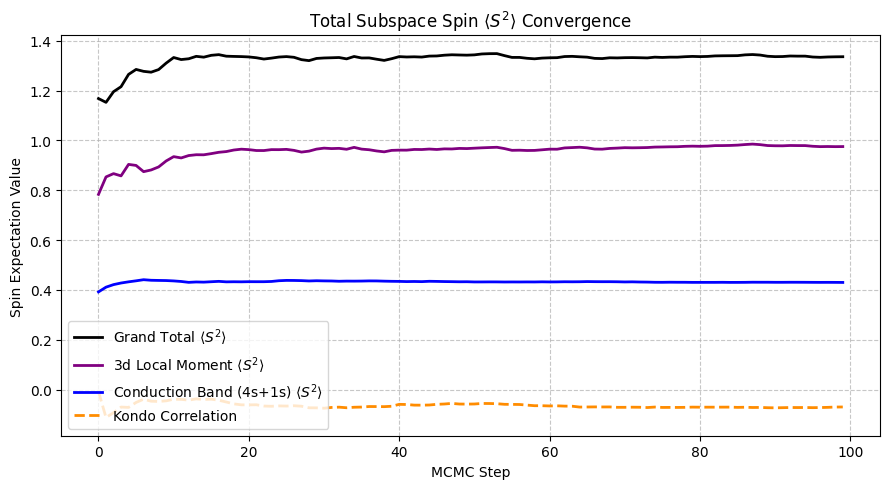


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval/evaluation_stats.h5


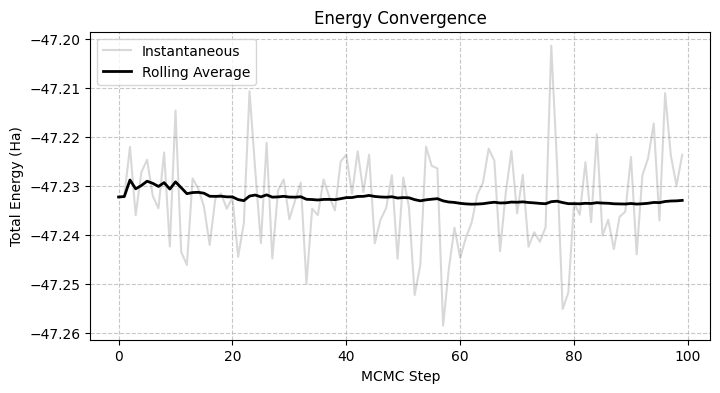

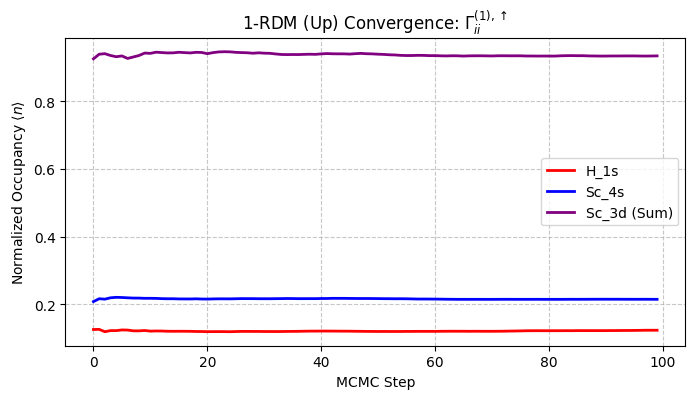

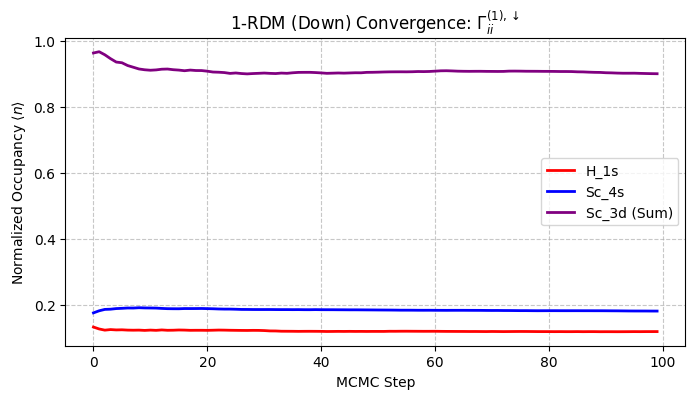

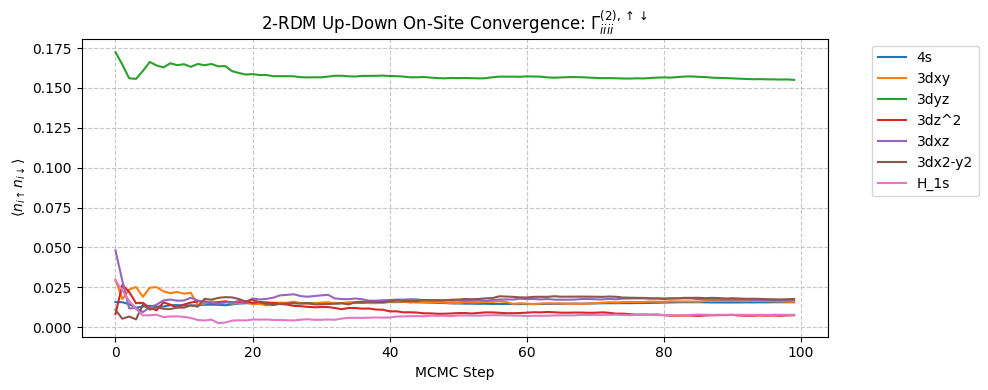

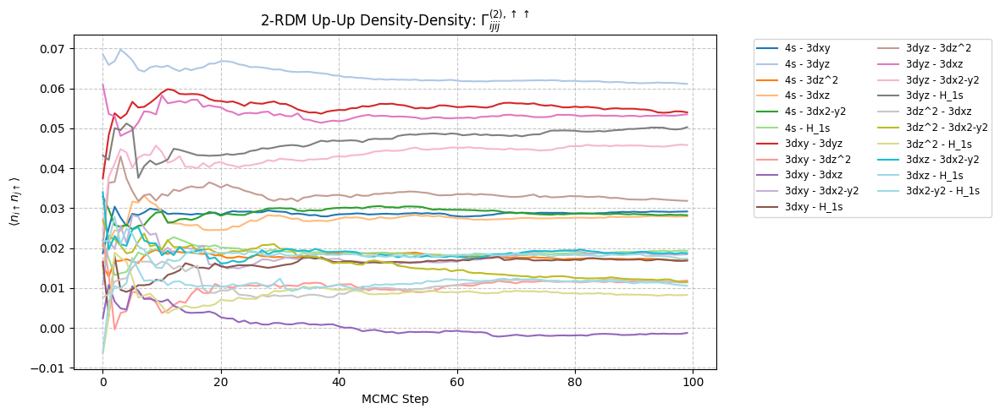

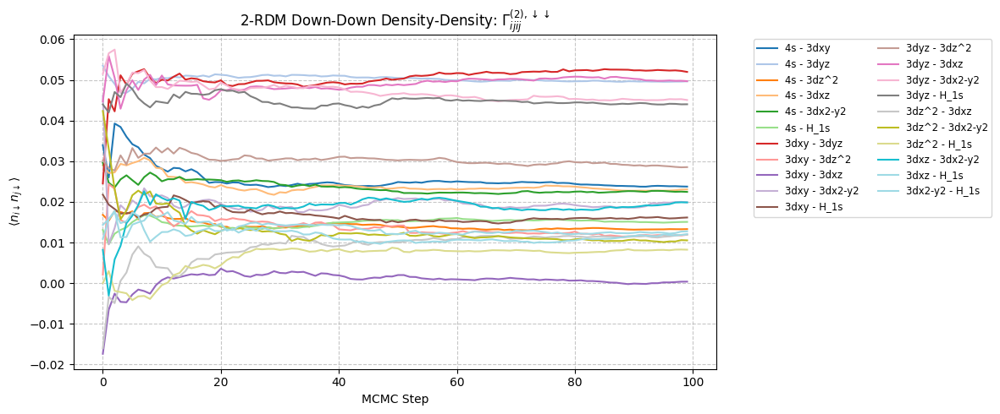

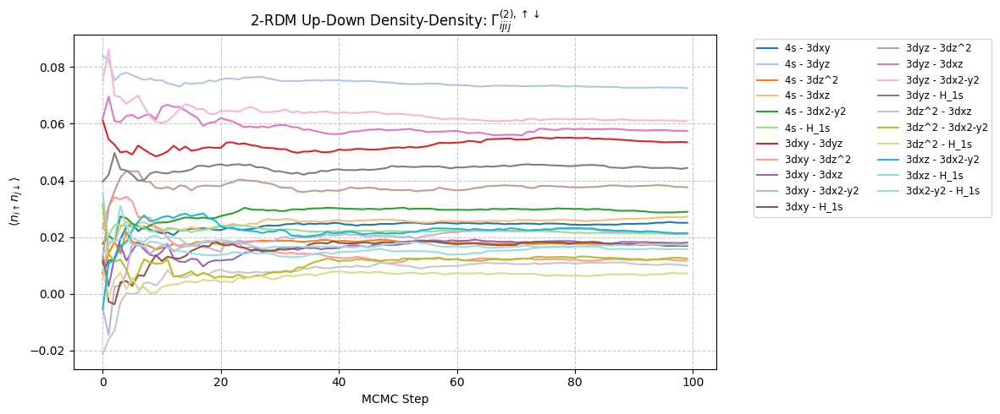

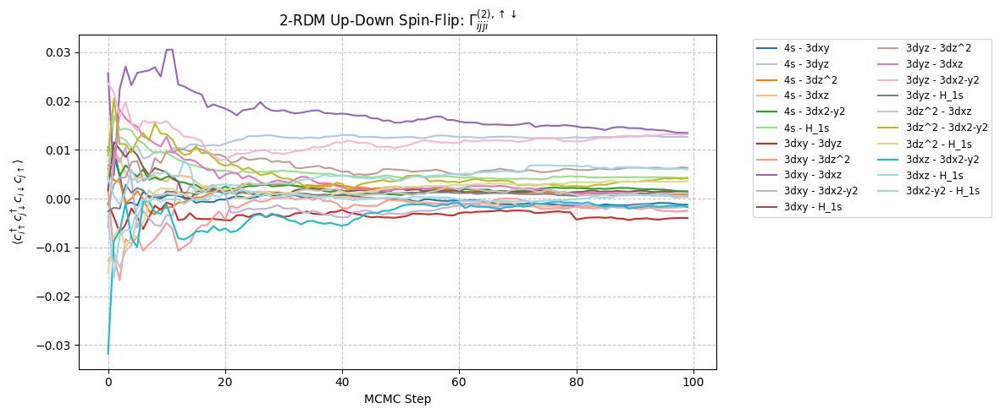

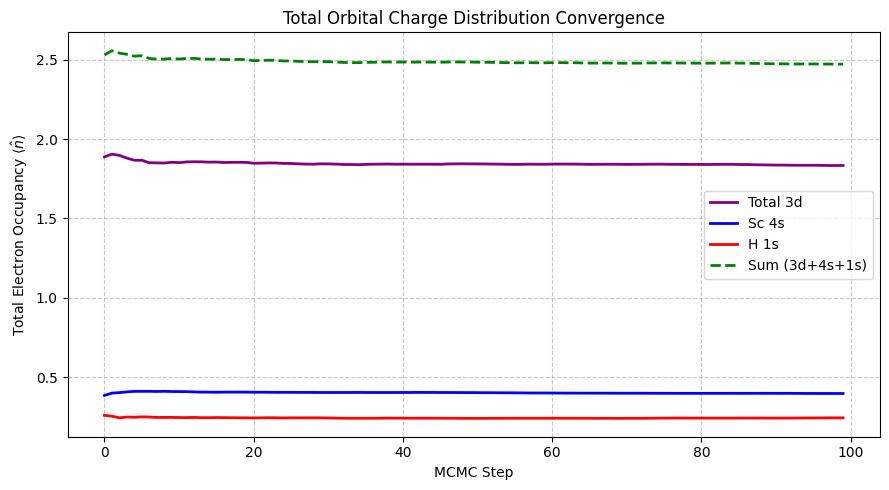

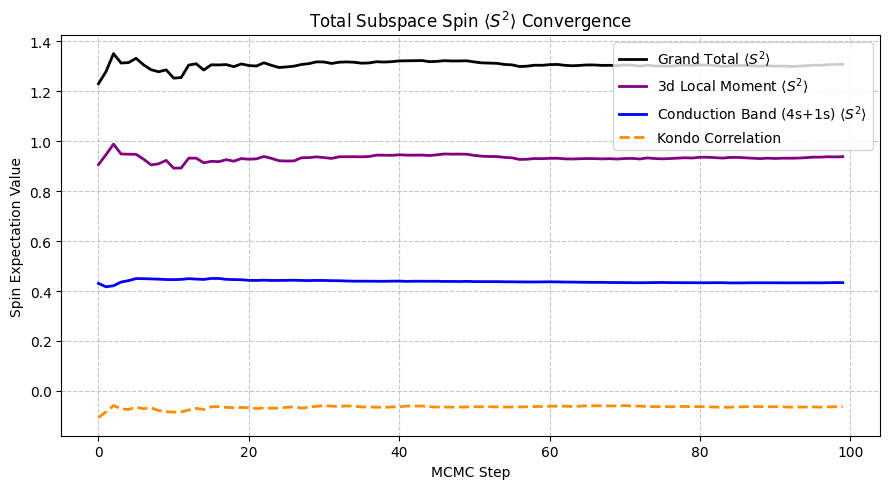


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval/evaluation_stats.h5


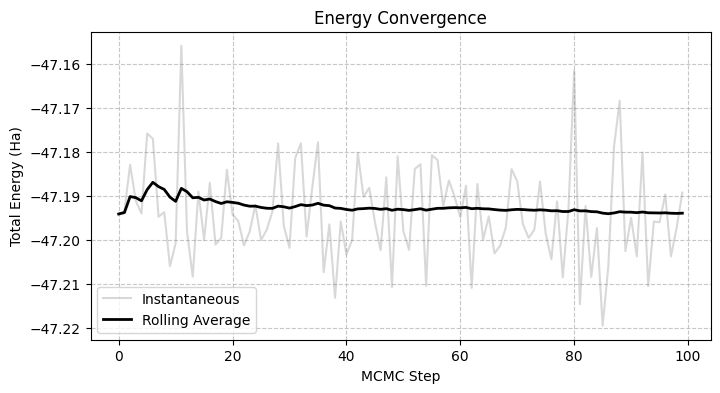

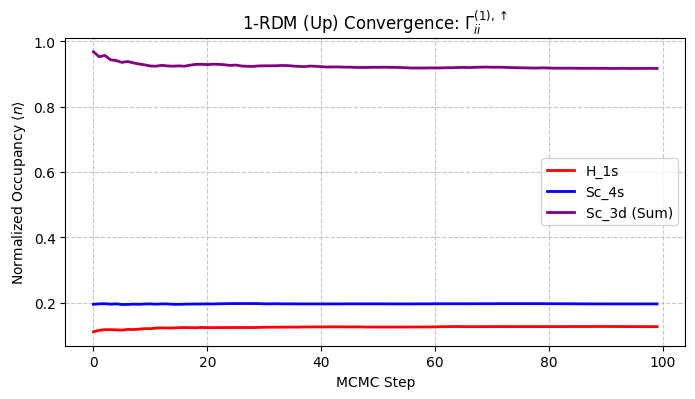

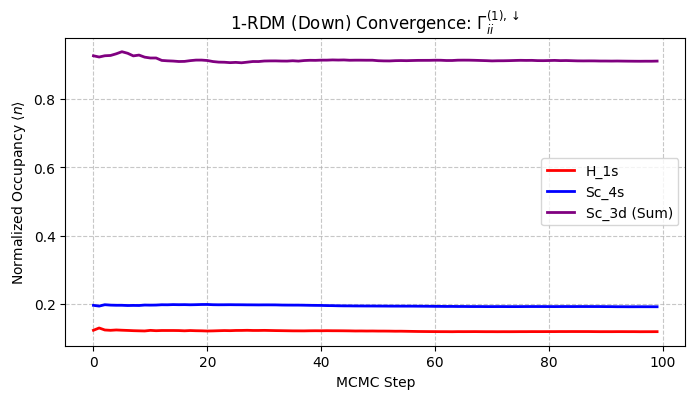

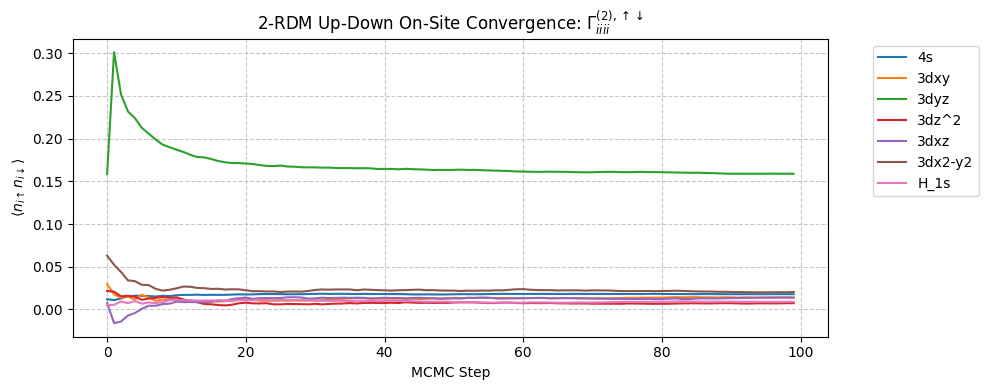

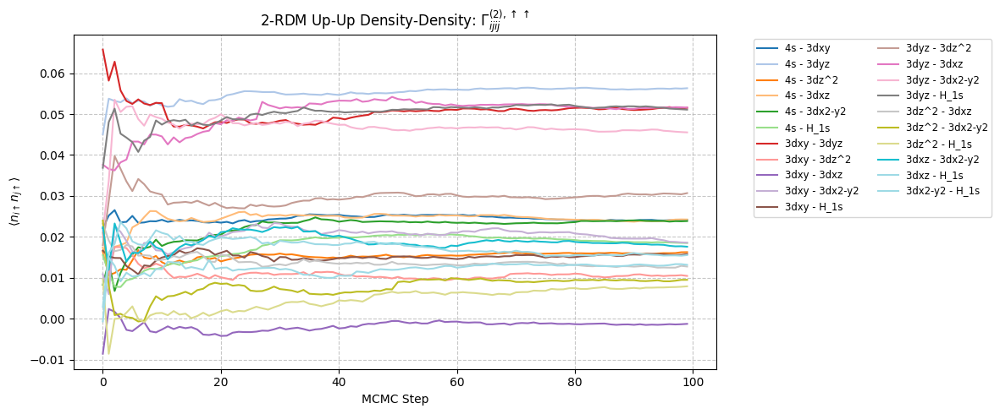

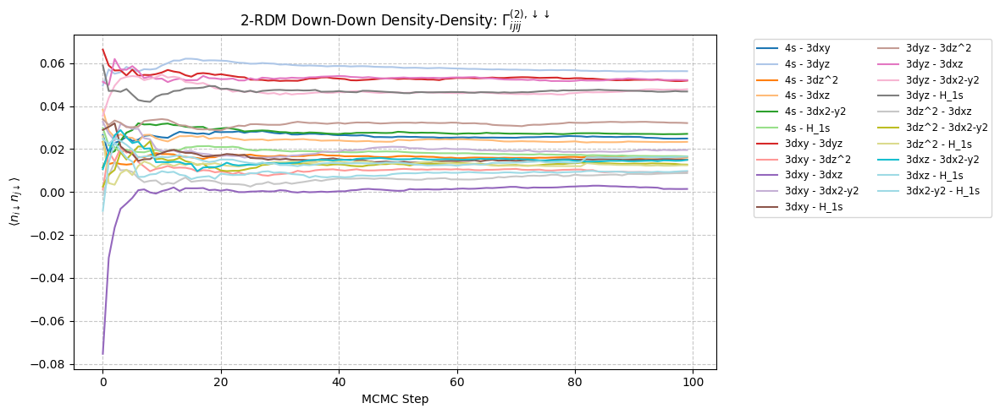

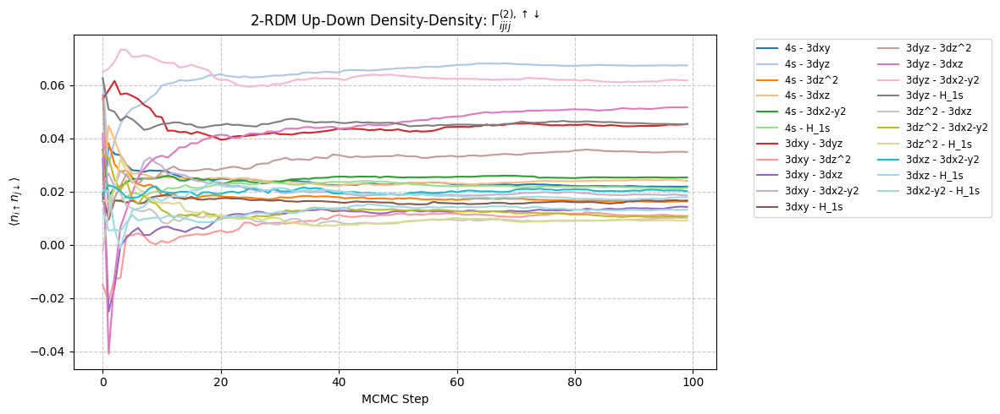

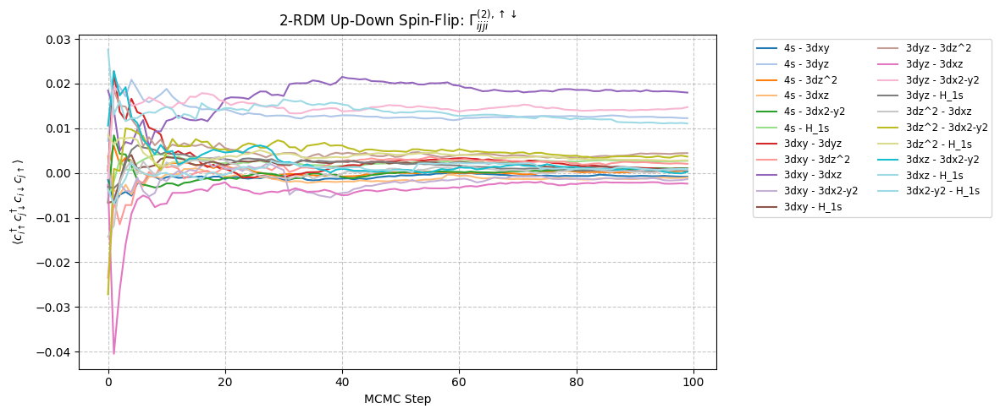

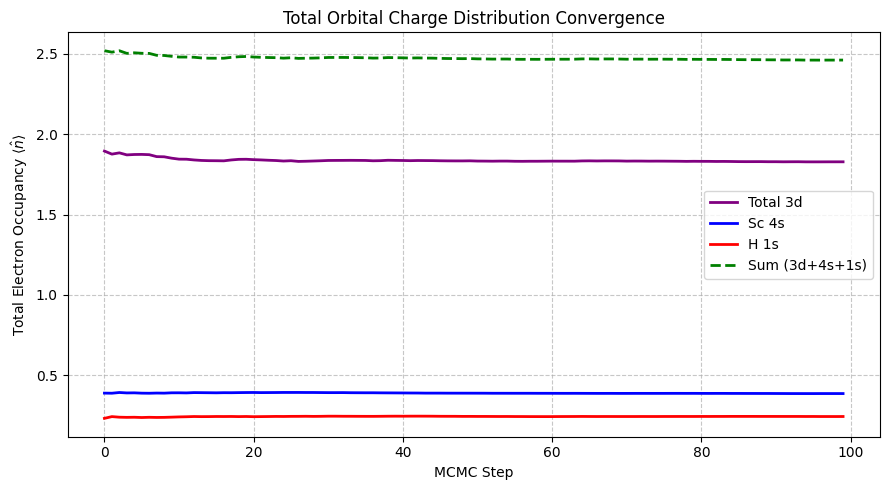

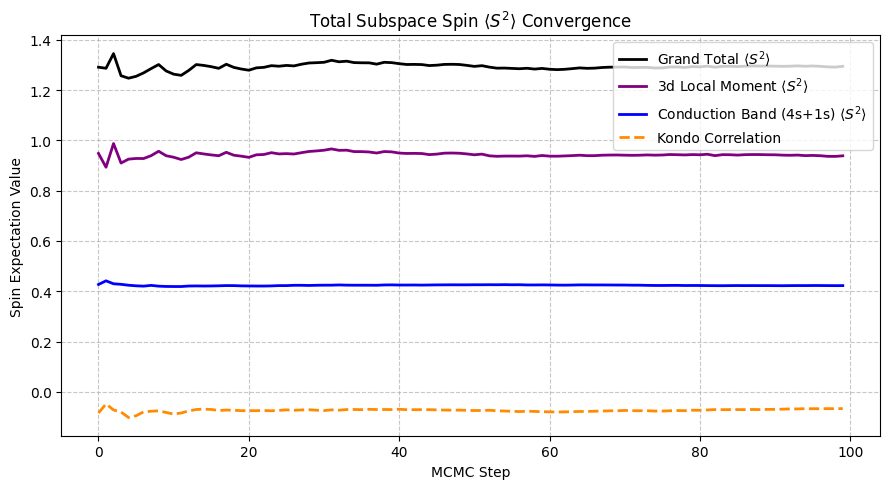


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval/evaluation_stats.h5


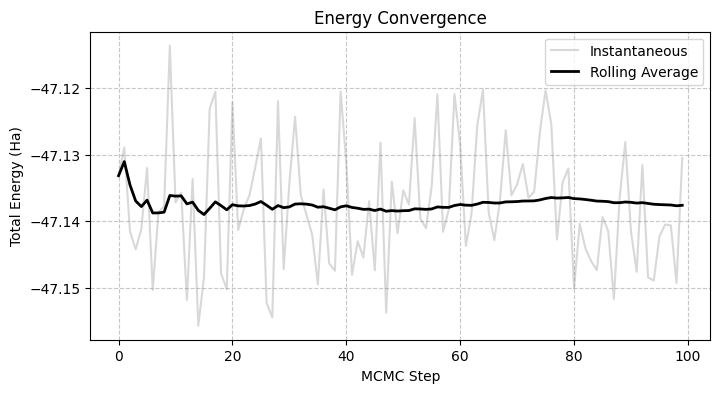

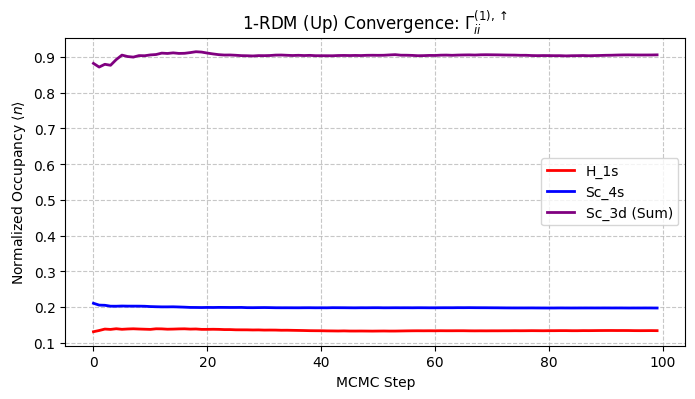

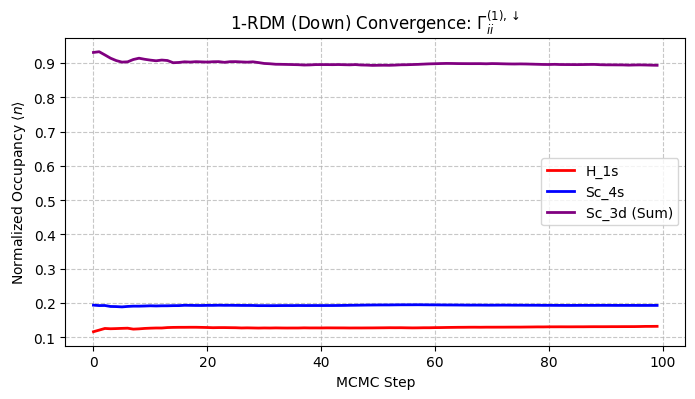

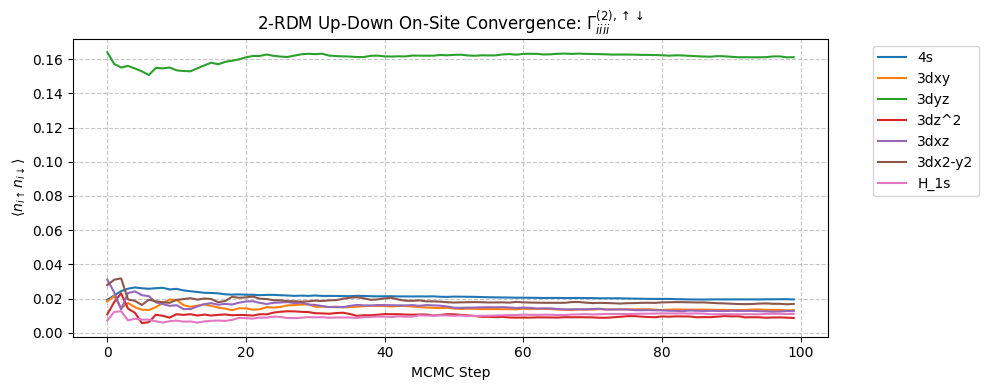

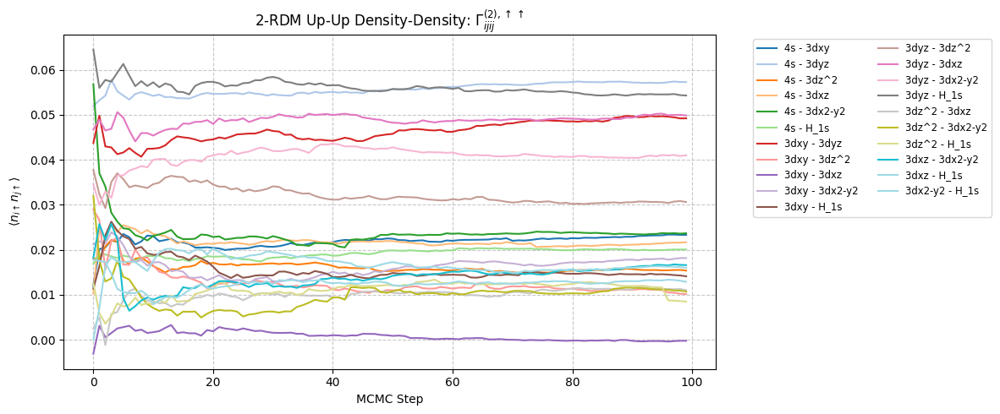

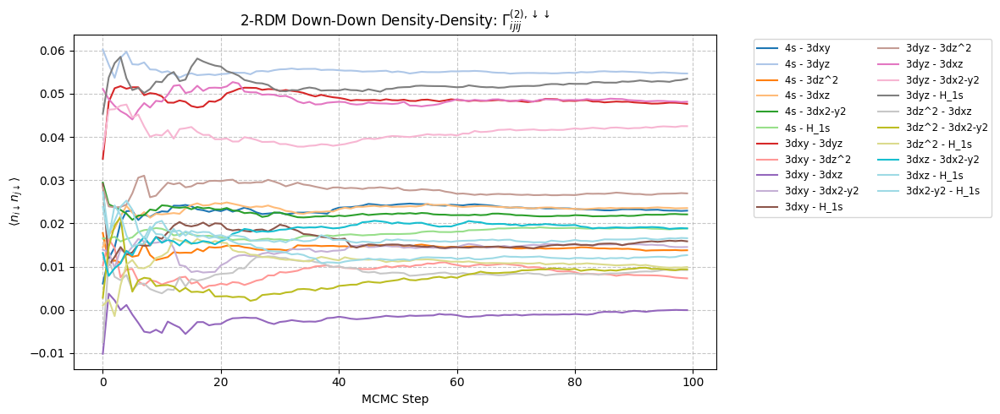

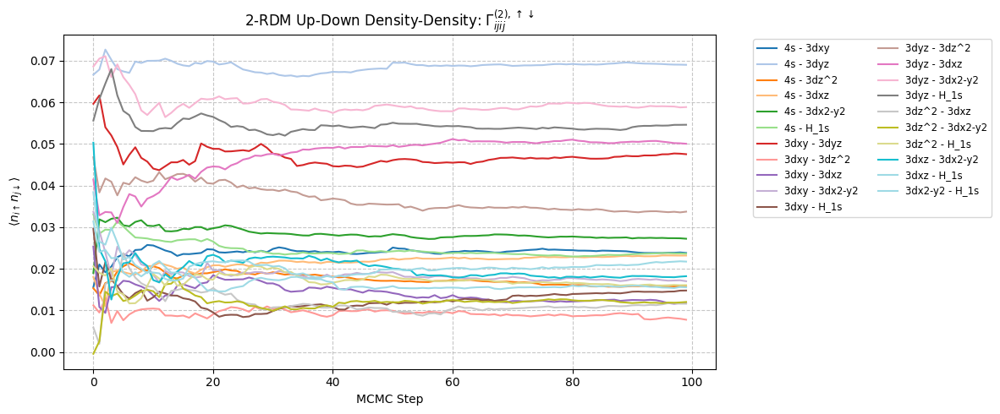

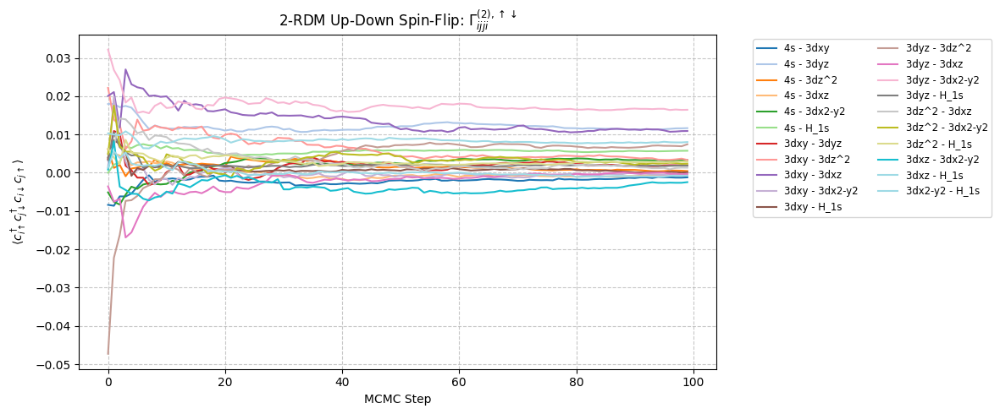

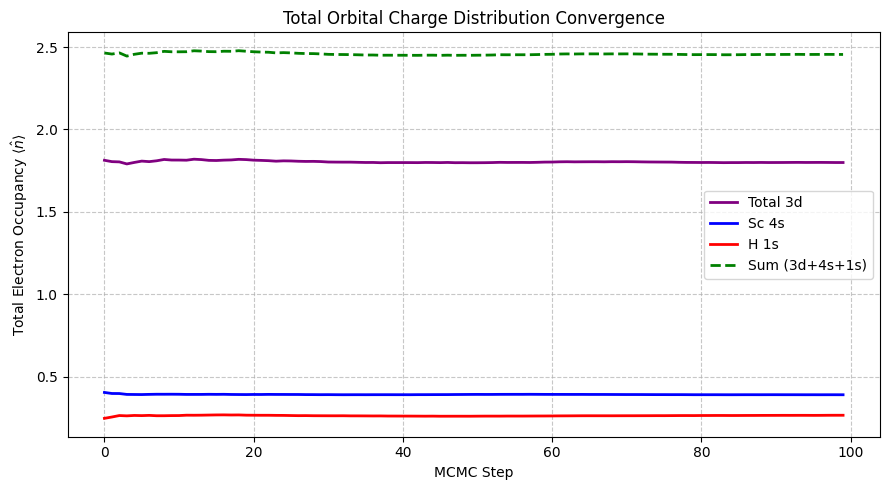

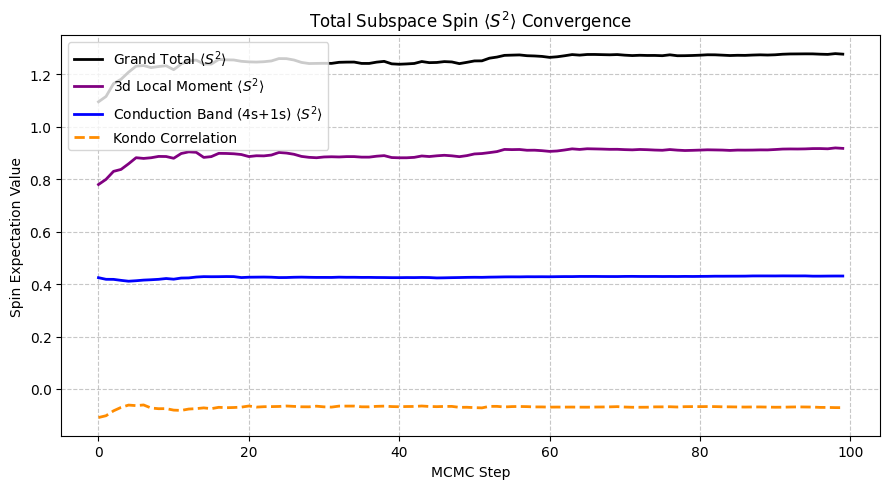


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval/evaluation_stats.h5


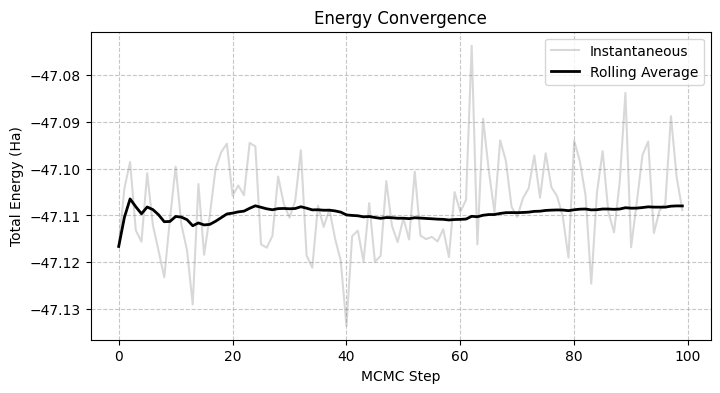

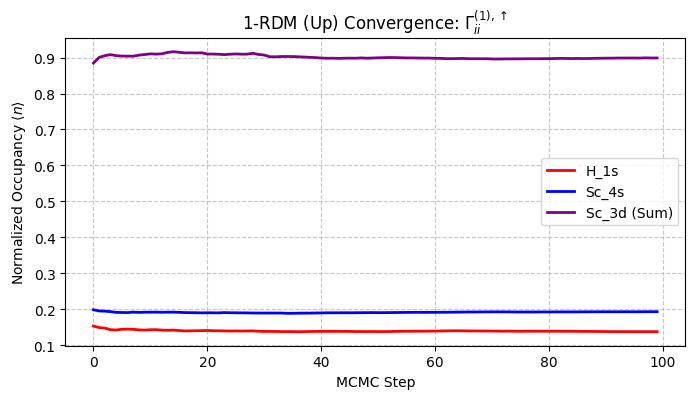

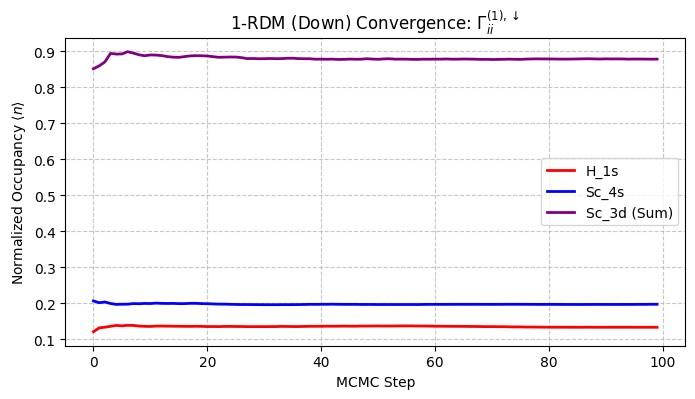

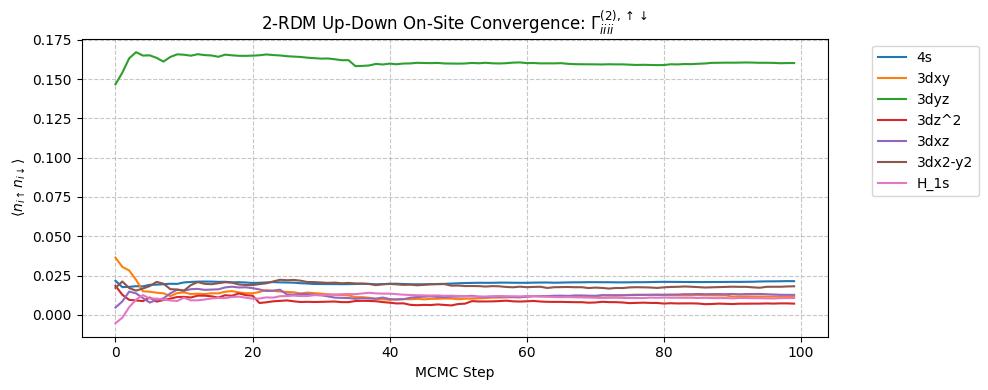

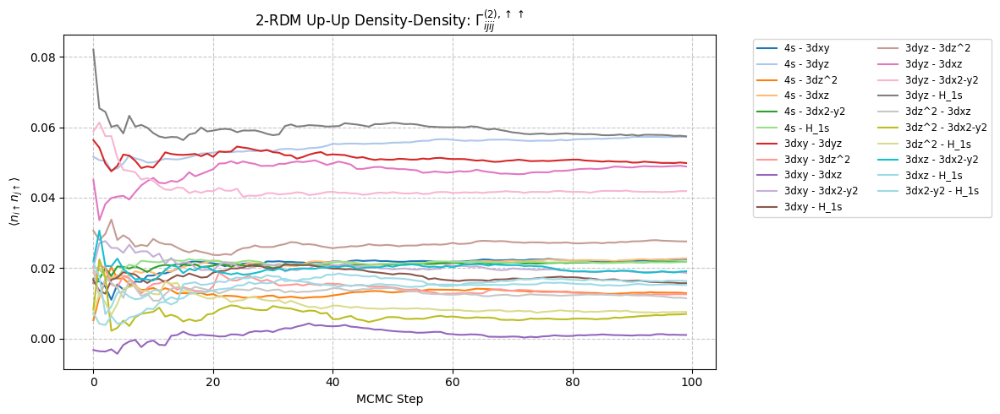

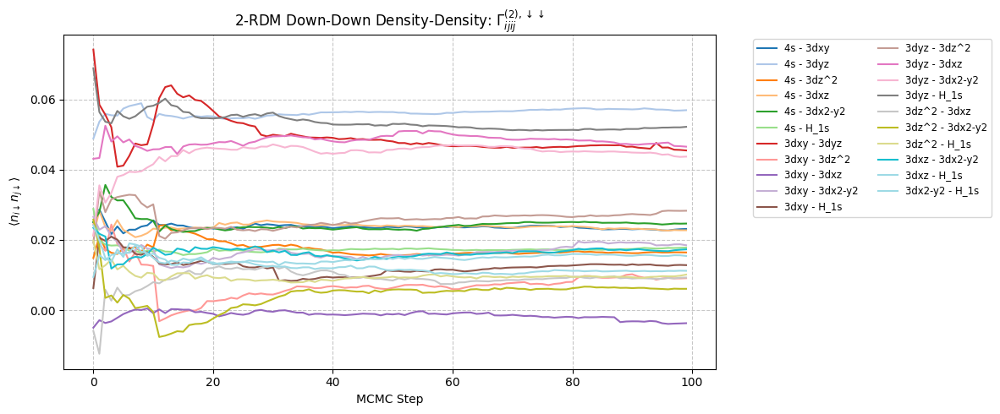

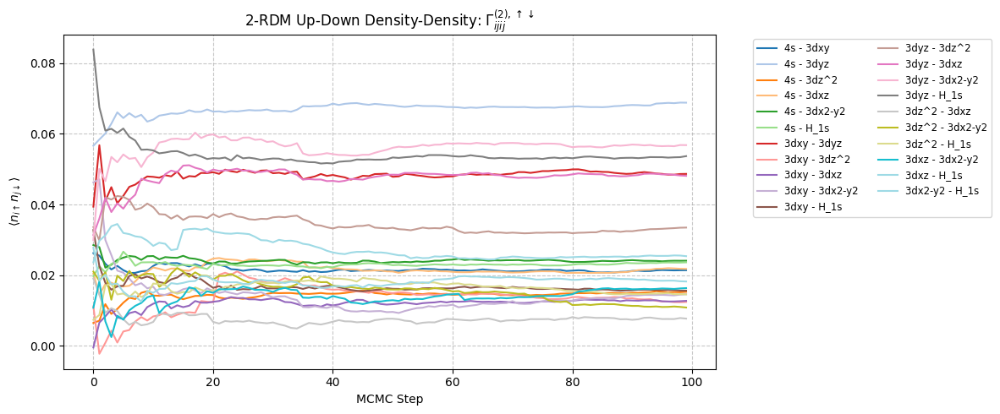

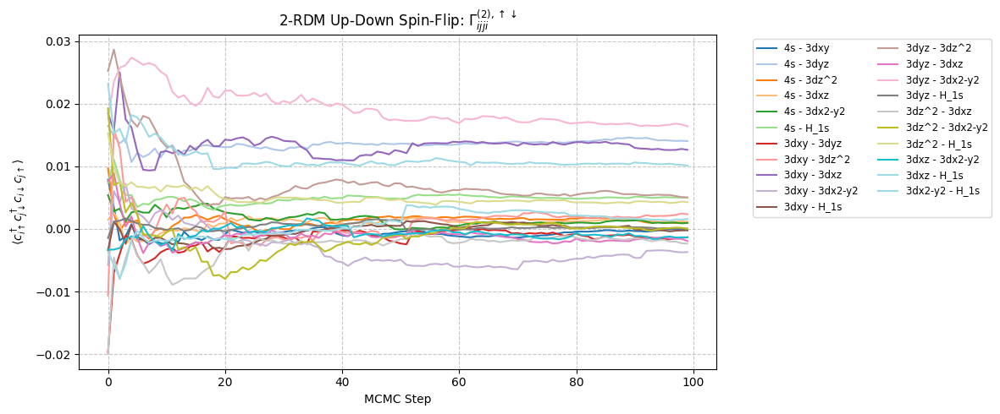

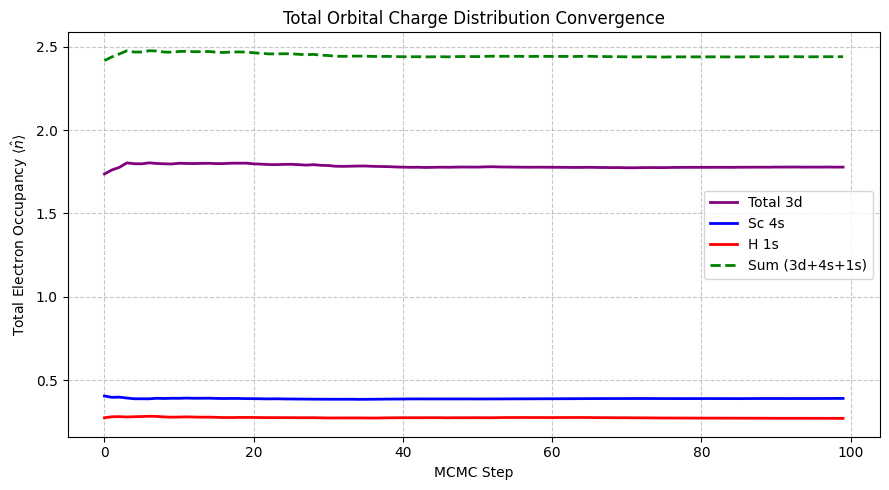

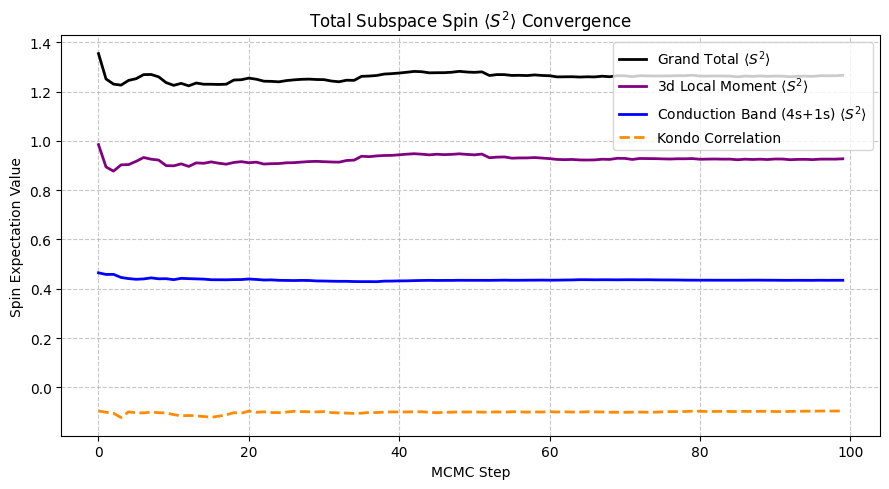


Processing: /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval/evaluation_stats.h5


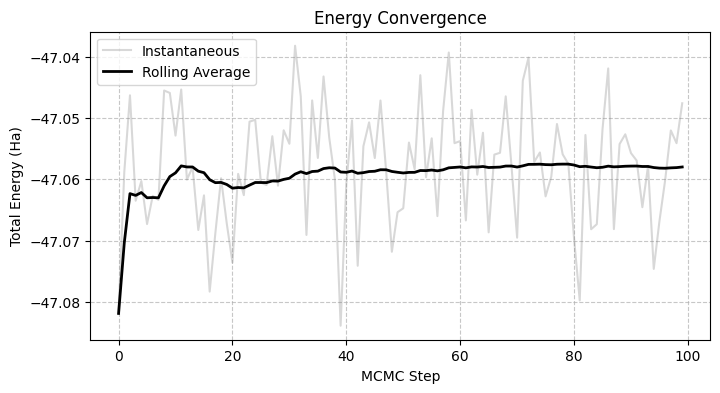

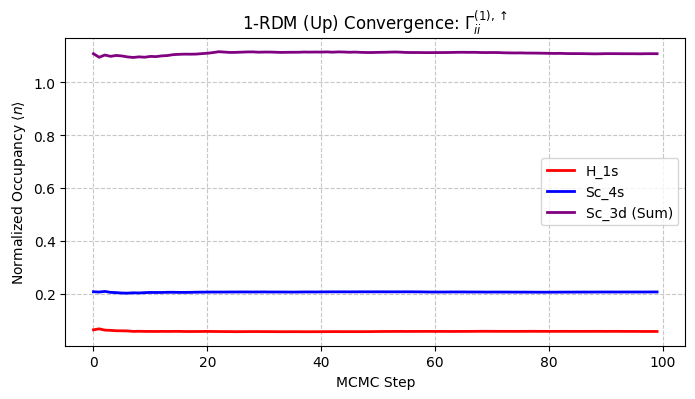

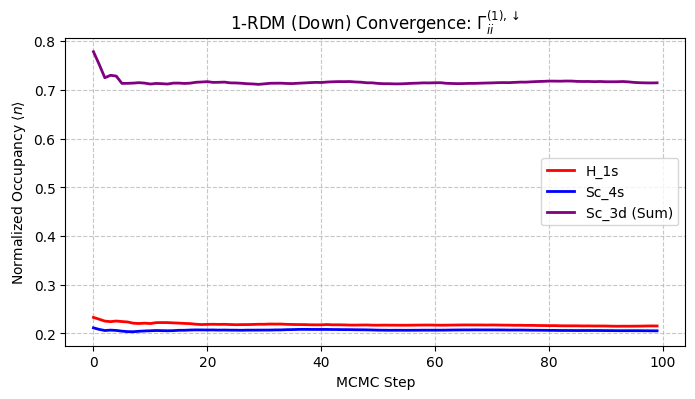

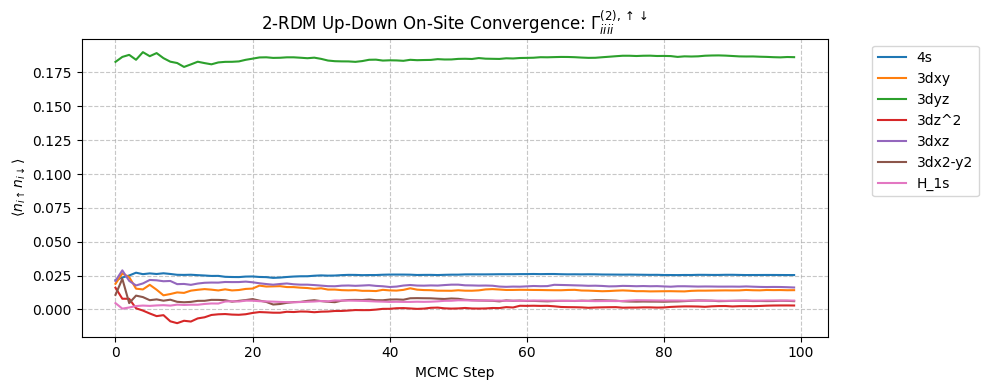

In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
import matplotlib.cm as cm

run_paths = [
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval/evaluation_stats.h5",
    "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval/evaluation_stats.h5",
]

orbitals = ['4s', '3dxy', '3dyz', '3dz^2', '3dxz', '3dx2-y2', 'H_1s']

# Get 21 distinct colors for the 7C2 combination plots
colors_21 = cm.tab20(np.linspace(0, 1, 21))

for h5_path in run_paths:
    print(f"\n{'='*60}")
    print(f"Processing: {h5_path}")
    print(f"{'='*60}")

    with h5py.File(h5_path, "r") as f:
        
        # 1. Total Energy Convergence
        if 'total_energy_real' in f:
            energy = f['total_energy_real'][:]
            rolling_energy = np.cumsum(energy) / np.arange(1, len(energy) + 1)
            
            plt.figure(figsize=(8, 4))
            plt.plot(energy, alpha=0.3, label="Instantaneous", color='gray')
            plt.plot(rolling_energy, linewidth=2, label="Rolling Average", color='black')
            plt.xlabel("MCMC Step")
            plt.ylabel("Total Energy (Ha)")
            plt.legend()
            plt.title("Energy Convergence")
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.show()

        # Extract normalizer once for RDMs
        if 'Ni_sq' not in f:
            print("Ni_sq not found, skipping RDM plots.")
            continue
            
        ni_sq = f['Ni_sq'][:]
        roll_ni = np.cumsum(ni_sq, axis=0) / np.arange(1, len(ni_sq) + 1)[:, None]
        
        # 4D Normalizer Tensor for 2-RDM: sqrt(Ni^2 * Nj^2 * Nk^2 * Nl^2)
        norm_2rdm = np.sqrt(
            roll_ni[:, :, None, None, None] * 
            roll_ni[:, None, :, None, None] * 
            roll_ni[:, None, None, :, None] * 
            roll_ni[:, None, None, None, :]
        )

        # Helper to fetch and normalize 1-RDMs (Discarding imaginary noise)
        def get_norm_g1(dataset_name):
            if dataset_name in f:
                unnorm_g1 = f[dataset_name][:]
                normed = (np.cumsum(unnorm_g1, axis=0) / np.arange(1, len(unnorm_g1) + 1)[:, None]) / roll_ni
                return normed.real
            return None

        # Helper to fetch and normalize 2-RDMs (Discarding imaginary noise)
        def get_norm_g2(dataset_name):
            if dataset_name in f:
                unnorm_g2 = f[dataset_name][:]
                roll_unnorm_g2 = (np.cumsum(unnorm_g2, axis=0) / 
                                  np.arange(1, len(unnorm_g2) + 1)[:, None, None, None, None])
                normed = roll_unnorm_g2 / norm_2rdm
                return normed.real
            return None

        g1_up = get_norm_g1('unnorm_gamma1_up_ii')
        g1_dn = get_norm_g1('unnorm_gamma1_down_ii')
        g2_ud = get_norm_g2('unnorm_two_rdm_up_down')
        g2_uu = get_norm_g2('unnorm_two_rdm_up_up')
        g2_dd = get_norm_g2('unnorm_two_rdm_down_down')

        # ==========================================
        # 1-RDM Convergence Plots
        # ==========================================
        def plot_1rdm(g1, title):
            if g1 is not None:
                plt.figure(figsize=(8, 4))
                plt.plot(g1[:, 6], linewidth=2, label='H_1s', color='red')
                plt.plot(g1[:, 0], linewidth=2, label='Sc_4s', color='blue')
                sc_3d_sum = np.sum(g1[:, 1:6], axis=1)
                plt.plot(sc_3d_sum, linewidth=2, label='Sc_3d (Sum)', color='purple')
                
                plt.xlabel("MCMC Step")
                plt.ylabel(r"Normalized Occupancy $\langle n \rangle$")
                plt.title(title)
                plt.legend()
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.show()

        plot_1rdm(g1_up, r"1-RDM (Up) Convergence: $\Gamma^{(1),\uparrow}_{ii}$")
        plot_1rdm(g1_dn, r"1-RDM (Down) Convergence: $\Gamma^{(1),\downarrow}_{ii}$")

        # ==========================================
        # 2-RDM Tensor Plots
        # ==========================================
        if g2_ud is not None:
            plt.figure(figsize=(10, 4))
            for i in range(7):
                plt.plot(g2_ud[:, i, i, i, i], linewidth=1.5, label=orbitals[i])
            plt.xlabel("MCMC Step")
            plt.ylabel(r"$\langle n_{i\uparrow} n_{i\downarrow} \rangle$")
            plt.title(r"2-RDM Up-Down On-Site Convergence: $\Gamma^{(2),\uparrow\downarrow}_{iiii}$")
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()

        def plot_7c2(tensor, title, y_label):
            if tensor is None:
                return
            plt.figure(figsize=(12, 5))
            pairs = list(combinations(range(7), 2))
            for idx, (i, j) in enumerate(pairs):
                label_str = f"{orbitals[i]} - {orbitals[j]}"
                plt.plot(tensor[:, idx], linewidth=1.5, color=colors_21[idx], label=label_str)
            plt.xlabel("MCMC Step")
            plt.ylabel(y_label)
            plt.title(title)
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2, fontsize='small')
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()

        if g2_uu is not None:
            plot_7c2(np.array([g2_uu[:, i, j, i, j] for i, j in combinations(range(7), 2)]).T, 
                     r"2-RDM Up-Up Density-Density: $\Gamma^{(2),\uparrow\uparrow}_{ijij}$", r"$\langle n_{i\uparrow} n_{j\uparrow} \rangle$")
        if g2_dd is not None:
            plot_7c2(np.array([g2_dd[:, i, j, i, j] for i, j in combinations(range(7), 2)]).T, 
                     r"2-RDM Down-Down Density-Density: $\Gamma^{(2),\downarrow\downarrow}_{ijij}$", r"$\langle n_{i\downarrow} n_{j\downarrow} \rangle$")
        if g2_ud is not None:
            plot_7c2(np.array([g2_ud[:, i, j, i, j] for i, j in combinations(range(7), 2)]).T, 
                     r"2-RDM Up-Down Density-Density: $\Gamma^{(2),\uparrow\downarrow}_{ijij}$", r"$\langle n_{i\uparrow} n_{j\downarrow} \rangle$")
            plot_7c2(np.array([g2_ud[:, i, j, j, i] for i, j in combinations(range(7), 2)]).T, 
                     r"2-RDM Up-Down Spin-Flip: $\Gamma^{(2),\uparrow\downarrow}_{ijji}$", r"$\langle c^\dagger_{i\uparrow} c^\dagger_{j\downarrow} c_{i\downarrow} c_{j\uparrow} \rangle$")

        # ==========================================
        # NEW PLOT 1: Total Occupancies Convergence
        # ==========================================
        if g1_up is not None and g1_dn is not None:
            occupancies = g1_up + g1_dn
            occ_4s = occupancies[:, 0]
            occ_3d = np.sum(occupancies[:, 1:6], axis=1)
            occ_1s = occupancies[:, 6]
            occ_total = occ_4s + occ_3d + occ_1s

            plt.figure(figsize=(9, 5))
            plt.plot(occ_3d, linewidth=2, color='purple', label='Total 3d')
            plt.plot(occ_4s, linewidth=2, color='blue', label='Sc 4s')
            plt.plot(occ_1s, linewidth=2, color='red', label='H 1s')
            plt.plot(occ_total, linewidth=2, linestyle='--', color='green', label='Sum (3d+4s+1s)')
            
            plt.xlabel("MCMC Step")
            plt.ylabel(r"Total Electron Occupancy $\langle \hat{n} \rangle$")
            plt.title("Total Orbital Charge Distribution Convergence")
            plt.legend()
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()

        # ==========================================
        # NEW PLOT 2: Total S^2 Spin Convergence
        # ==========================================
        if all(t is not None for t in [g1_up, g1_dn, g2_uu, g2_dd, g2_ud]):
            N_steps = g2_ud.shape[0]
            
            # 1. On-Site Term: <S_i^2>
            n_up_dn_ii = np.zeros((N_steps, 7))
            for i in range(7):
                n_up_dn_ii[:, i] = g2_ud[:, i, i, i, i]
            
            s2_onsite = 0.75 * (occupancies - 2 * n_up_dn_ii)

            # 2. Inter-Orbital Term: <S_i . S_j>
            s_i_dot_s_j = np.zeros((N_steps, 7, 7))
            for i in range(7):
                for j in range(7):
                    if i != j:
                        nn_uu = g2_uu[:, i, j, i, j]
                        nn_dd = g2_dd[:, i, j, i, j]
                        nn_ud = g2_ud[:, i, j, i, j]
                        nn_du = g2_ud[:, j, i, j, i]
                        sz_sz = 0.25 * (nn_uu + nn_dd - nn_ud - nn_du)
                        
                        flip_ud = g2_ud[:, i, j, j, i]
                        flip_du = g2_ud[:, j, i, i, j]
                        spin_flip = -0.5 * (flip_ud + flip_du)
                        
                        s_i_dot_s_j[:, i, j] = sz_sz + spin_flip

            # 3. Physics Breakdown (Summing across the steps)
            grand_total = np.sum(s2_onsite, axis=1) + np.sum(s_i_dot_s_j, axis=(1, 2))
            
            s2_3d_total = np.sum(s2_onsite[:, 1:6], axis=1) + np.sum(s_i_dot_s_j[:, 1:6, 1:6], axis=(1, 2))
            
            s2_cond_total = np.zeros(N_steps)
            for i in [0, 6]:
                s2_cond_total += s2_onsite[:, i]
                for j in [0, 6]:
                    s2_cond_total += s_i_dot_s_j[:, i, j]

            kondo = np.zeros(N_steps)
            for i in range(1, 6):
                for j in [0, 6]:
                    kondo += s_i_dot_s_j[:, i, j]
                    kondo += s_i_dot_s_j[:, j, i]

            # Plot S^2 Convergence
            plt.figure(figsize=(9, 5))
            plt.plot(grand_total, linewidth=2, color='black', label=r'Grand Total $\langle S^2 \rangle$')
            plt.plot(s2_3d_total, linewidth=2, color='purple', label=r'3d Local Moment $\langle S^2 \rangle$')
            plt.plot(s2_cond_total, linewidth=2, color='blue', label=r'Conduction Band (4s+1s) $\langle S^2 \rangle$')
            plt.plot(kondo, linewidth=2, linestyle='--', color='darkorange', label='Kondo Correlation')
            
            plt.xlabel("MCMC Step")
            plt.ylabel(r"Spin Expectation Value")
            plt.title(r"Total Subspace Spin $\langle S^2 \rangle$ Convergence")
            plt.legend()
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()

# 40000 burn-in and 2.0 initial_width for sampling


RESULTS FOR Sc-H DISTANCE: 2.8 Bohr

--- Subspace Spin Breakdown ---
3d Local Moment S^2:        0.954092
Conduction Band S^2:        0.442501
Kondo Correlation:          -0.072940

--- Orbital Occupancies ---
   Orbital |  <n> (Total) | <n_up * n_dn> (Double)
--------------------------------------------------
        4s |     0.432863 |               0.013008
      3dxy |     0.299960 |               0.018793
      3dyz |     0.792420 |               0.146536
     3dz^2 |     0.172551 |               0.006044
      3dxz |     0.297259 |               0.020383
   3dx2-y2 |     0.307254 |               0.023092
      H_1s |     0.213197 |               0.009025
--------------------------------------------------
  Total 3d |     1.869444 |
Sum (7 orbs) |     2.515504 |
Total outer valence electrons accounted for: 2.515504 out of 4.0
Electrons spilled into higher orbitals (e.g., Sc 4p, H 2s/2p): 1.484496
Skipping /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval_40000_b

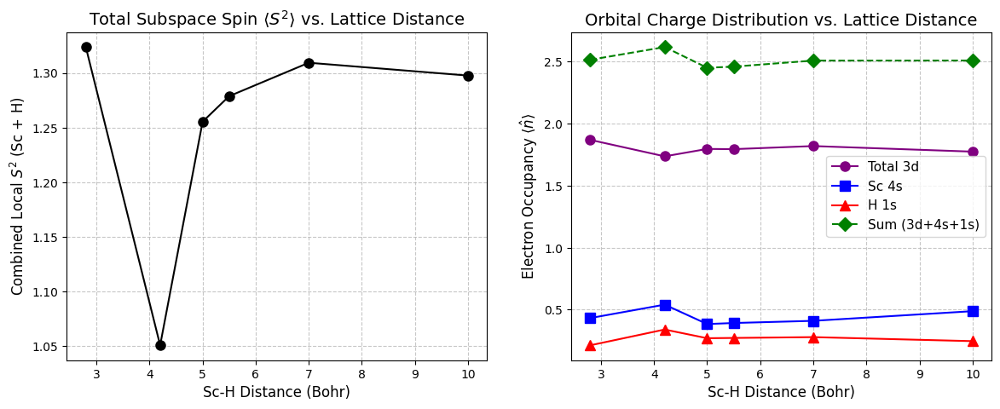

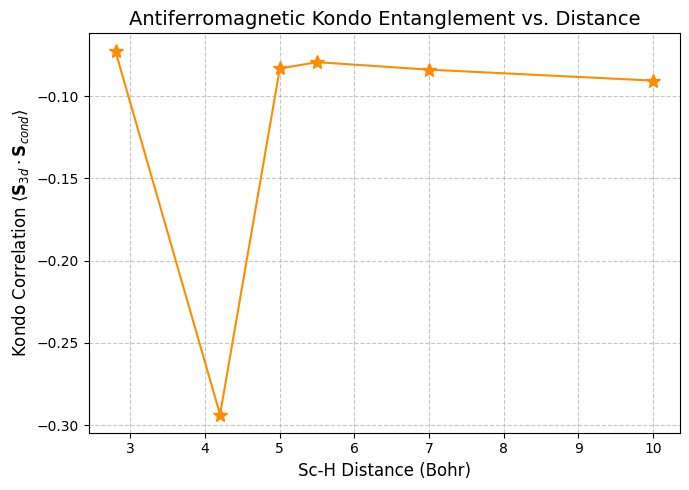

In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt


# Your four run directories
run_paths = [
    f"/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/old_runs/sc_h_chain_{i}_rdm_eval_40000_burn_in_2.0_init_width"
    for i in [2.8, 3.78, 4.2, 5.0, 5.5, 7.0, 10.0]
]

orbitals = ['4s', '3dxy', '3dyz', '3dz^2', '3dxz', '3dx2-y2', 'H_1s']

# Lists to store data for plotting
plot_distances = []
plot_grand_totals = []
plot_occ_4s = []
plot_occ_3d = []
plot_occ_1s = []
plot_occ_total = []
plot_kondo = []

for path in run_paths:
    digest_file = os.path.join(path, "evaluation_digest.npz")
    if not os.path.exists(digest_file):
        print(f"Skipping {path} - file not found.")
        continue
        
    digest = dict(np.load(digest_file))
    
    g1_up = digest['gamma1_up_ii']
    g1_dn = digest['gamma1_down_ii']
    g2_uu = digest['two_rdm_up_up']
    g2_dd = digest['two_rdm_down_down']
    g2_ud = digest['two_rdm_up_down']

    # 1. On-Site Term: <S_i^2> 
    n_up_dn_ii = np.einsum('iiii->i', g2_ud)
    s2_onsite_per_orbital = 0.75 * (g1_up + g1_dn - 2 * n_up_dn_ii)

    # 2. Inter-Orbital Term: <S_i . S_j> matrix
    mask = 1.0 - np.eye(7)
    nn_uu = np.einsum('ijij->ij', g2_uu)
    nn_dd = np.einsum('ijij->ij', g2_dd)
    nn_ud = np.einsum('ijij->ij', g2_ud)
    nn_du = np.einsum('jiji->ij', g2_ud) 
    sz_sz_matrix = 0.25 * (nn_uu + nn_dd - nn_ud - nn_du) * mask

    flip_ud = np.einsum('ijji->ij', g2_ud)
    flip_du = np.einsum('jiij->ij', g2_ud)
    spin_flip_matrix = -0.5 * (flip_ud + flip_du) * mask

    s_i_dot_s_j = sz_sz_matrix + spin_flip_matrix

    # 3. Physics Breakdown: 3d Local Moment vs Conduction Band
    occupancies = g1_up + g1_dn
    double_occupancies = n_up_dn_ii

    idx_4s = [0]
    idx_3d = [1, 2, 3, 4, 5]
    idx_1s = [6]
    idx_cond = idx_4s + idx_1s 

    # Spin Subspaces
    s2_3d_total = np.sum(s2_onsite_per_orbital[idx_3d]) + np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_3d)])
    s2_cond_total = np.sum(s2_onsite_per_orbital[idx_cond]) + np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_cond)])
    kondo_correlation = np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_cond)]) + np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_3d)])
    grand_total = s2_3d_total + s2_cond_total + kondo_correlation

    # Extract Exact Occupancies for plotting
    occ_4s = occupancies[0].real
    occ_3d_total = np.sum(occupancies[1:6]).real
    occ_1s = occupancies[6].real
    
    # 4. Printing & Data Storage
    dist = path.split('_chain_')[-1].split('_rdm')[0] 
    dist_val = float(dist)
    
    plot_distances.append(dist_val)
    plot_grand_totals.append(grand_total.real)
    plot_occ_4s.append(occ_4s)
    plot_occ_3d.append(occ_3d_total)
    plot_occ_1s.append(occ_1s)
    plot_kondo.append(kondo_correlation.real)

    occ_total_monitored = occ_4s + occ_3d_total + occ_1s
    plot_occ_total.append(occ_total_monitored)
    
    print(f"\n{'='*55}")
    print(f"RESULTS FOR Sc-H DISTANCE: {dist_val} Bohr")
    print(f"{'='*55}")
    
    print("\n--- Subspace Spin Breakdown ---")
    print(f"3d Local Moment S^2:        {s2_3d_total.real:.6f}")
    print(f"Conduction Band S^2:        {s2_cond_total.real:.6f}")
    print(f"Kondo Correlation:          {kondo_correlation.real:.6f}")
    
    print("\n--- Orbital Occupancies ---")
    print(f"{'Orbital':>10} | {'<n> (Total)':>12} | {'<n_up * n_dn> (Double)':>22}")
    print("-" * 50)
    for orb, n_tot, n_dbl in zip(orbitals, occupancies, double_occupancies):
        print(f"{orb:>10} | {n_tot.real:>12.6f} | {n_dbl.real:>22.6f}")
    
    print("-" * 50)
    print(f"{'Total 3d':>10} | {occ_3d_total:>12.6f} |")

    occ_total_monitored = occ_4s + occ_3d_total + occ_1s
    spilled_electrons = 4.0 - occ_total_monitored
    
    print(f"{'Sum (7 orbs)':>10} | {occ_total_monitored:>12.6f} |")
    print("=" * 50)
    print(f"Total outer valence electrons accounted for: {occ_total_monitored:.6f} out of 4.0")
    print(f"Electrons spilled into higher orbitals (e.g., Sc 4p, H 2s/2p): {spilled_electrons:.6f}")


# =====================================================================
# 5. Plotting
# =====================================================================
# Sort arrays by distance
sorted_indices = np.argsort(plot_distances)
plot_distances = np.array(plot_distances)[sorted_indices]
plot_grand_totals = np.array(plot_grand_totals)[sorted_indices]
plot_occ_total = np.array(plot_occ_total)[sorted_indices]
plot_occ_3d = np.array(plot_occ_3d)[sorted_indices]
plot_occ_4s = np.array(plot_occ_4s)[sorted_indices]
plot_occ_1s = np.array(plot_occ_1s)[sorted_indices]
plot_kondo = np.array(plot_kondo)[sorted_indices]

# Create a figure with two subplots side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Grand Total Spin
ax1.plot(plot_distances, plot_grand_totals, marker='o', linestyle='-', color='black', markersize=8)
ax1.set_xlabel("Sc-H Distance (Bohr)", fontsize=12)
ax1.set_ylabel(r"Combined Local $S^2$ (Sc + H)", fontsize=12)
ax1.set_title(r"Total Subspace Spin $\langle S^2 \rangle$ vs. Lattice Distance", fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.7)

# Plot 2: Orbital Occupancies
ax2.plot(plot_distances, plot_occ_3d, marker='o', linestyle='-', color='purple', label='Total 3d', markersize=8)
ax2.plot(plot_distances, plot_occ_4s, marker='s', linestyle='-', color='blue', label='Sc 4s', markersize=8)
ax2.plot(plot_distances, plot_occ_1s, marker='^', linestyle='-', color='red', label='H 1s', markersize=8)
ax2.plot(plot_distances, plot_occ_total, marker='D', linestyle='--', color='green', label='Sum (3d+4s+1s)', markersize=8)
ax2.set_xlabel("Sc-H Distance (Bohr)", fontsize=12)
ax2.set_ylabel(r"Electron Occupancy $\langle \hat{n} \rangle$", fontsize=12)
ax2.set_title("Orbital Charge Distribution vs. Lattice Distance", fontsize=14)
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend(fontsize=11)

# Plot 3: Separate graph for Kondo Correlation
plt.figure(figsize=(7, 5))
plt.plot(plot_distances, plot_kondo, marker='*', linestyle='-', color='darkorange', markersize=10)

plt.xlabel("Sc-H Distance (Bohr)", fontsize=12)
plt.ylabel(r"Kondo Correlation $\langle \mathbf{S}_{3d} \cdot \mathbf{S}_{cond} \rangle$", fontsize=12)
plt.title("Antiferromagnetic Kondo Entanglement vs. Distance", fontsize=14)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## Gaussian initialization of r' walkers


RESULTS FOR Sc-H DISTANCE: 2.8 Bohr

--- Subspace Spin Breakdown ---
3d Local Moment S^2:        0.962352
Conduction Band S^2:        0.442143
Kondo Correlation:          -0.067169

--- Orbital Occupancies ---
   Orbital |  <n> (Total) | <n_up * n_dn> (Double)
--------------------------------------------------
        4s |     0.432113 |               0.014211
      3dxy |     0.302173 |               0.021196
      3dyz |     0.793872 |               0.146668
     3dz^2 |     0.173157 |               0.005665
      3dxz |     0.302093 |               0.019945
   3dx2-y2 |     0.306663 |               0.021583
      H_1s |     0.215560 |               0.008167
--------------------------------------------------
  Total 3d |     1.877958 |
Sum (7 orbs) |     2.525631 |
Total outer valence electrons accounted for: 2.525631 out of 4.0
Electrons spilled into higher orbitals (e.g., Sc 4p, H 2s/2p): 1.474369
Skipping /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_3.78_rdm_eval_gaussia

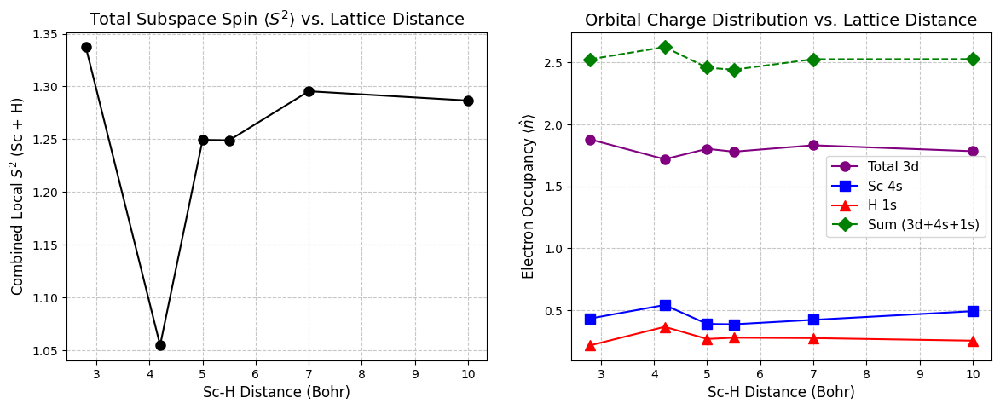

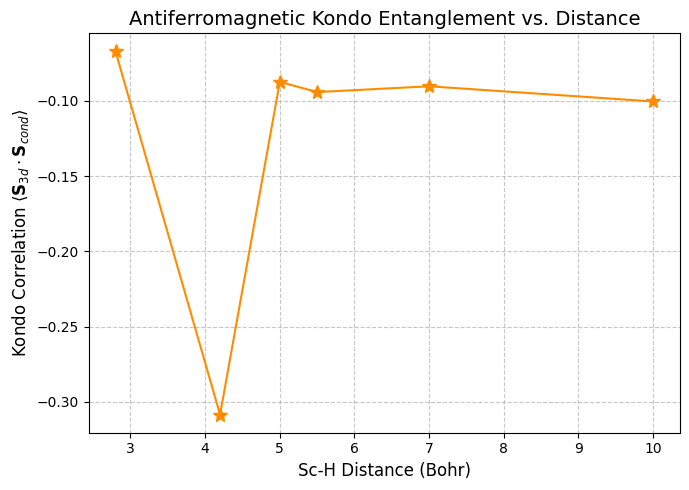

In [3]:
import numpy as np
import os
import matplotlib.pyplot as plt


# Your four run directories
run_paths = [
    f"/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_{i}_rdm_eval_gaussian_init_init_by_electron_count"
    for i in [2.8, 3.78, 4.2, 5.0, 5.5, 7.0, 10.0]
]

orbitals = ['4s', '3dxy', '3dyz', '3dz^2', '3dxz', '3dx2-y2', 'H_1s']

# Lists to store data for plotting
plot_distances = []
plot_grand_totals = []
plot_occ_4s = []
plot_occ_3d = []
plot_occ_1s = []
plot_occ_total = []
plot_kondo = []

for path in run_paths:
    digest_file = os.path.join(path, "evaluation_digest.npz")
    if not os.path.exists(digest_file):
        print(f"Skipping {path} - file not found.")
        continue
        
    digest = dict(np.load(digest_file))
    
    g1_up = digest['gamma1_up_ii']
    g1_dn = digest['gamma1_down_ii']
    g2_uu = digest['two_rdm_up_up']
    g2_dd = digest['two_rdm_down_down']
    g2_ud = digest['two_rdm_up_down']

    # 1. On-Site Term: <S_i^2> 
    n_up_dn_ii = np.einsum('iiii->i', g2_ud)
    s2_onsite_per_orbital = 0.75 * (g1_up + g1_dn - 2 * n_up_dn_ii)

    # 2. Inter-Orbital Term: <S_i . S_j> matrix
    mask = 1.0 - np.eye(7)
    nn_uu = np.einsum('ijij->ij', g2_uu)
    nn_dd = np.einsum('ijij->ij', g2_dd)
    nn_ud = np.einsum('ijij->ij', g2_ud)
    nn_du = np.einsum('jiji->ij', g2_ud) 
    sz_sz_matrix = 0.25 * (nn_uu + nn_dd - nn_ud - nn_du) * mask

    flip_ud = np.einsum('ijji->ij', g2_ud)
    flip_du = np.einsum('jiij->ij', g2_ud)
    spin_flip_matrix = -0.5 * (flip_ud + flip_du) * mask

    s_i_dot_s_j = sz_sz_matrix + spin_flip_matrix

    # 3. Physics Breakdown: 3d Local Moment vs Conduction Band
    occupancies = g1_up + g1_dn
    double_occupancies = n_up_dn_ii

    idx_4s = [0]
    idx_3d = [1, 2, 3, 4, 5]
    idx_1s = [6]
    idx_cond = idx_4s + idx_1s 

    # Spin Subspaces
    s2_3d_total = np.sum(s2_onsite_per_orbital[idx_3d]) + np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_3d)])
    s2_cond_total = np.sum(s2_onsite_per_orbital[idx_cond]) + np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_cond)])
    kondo_correlation = np.sum(s_i_dot_s_j[np.ix_(idx_3d, idx_cond)]) + np.sum(s_i_dot_s_j[np.ix_(idx_cond, idx_3d)])
    grand_total = s2_3d_total + s2_cond_total + kondo_correlation

    # Extract Exact Occupancies for plotting
    occ_4s = occupancies[0].real
    occ_3d_total = np.sum(occupancies[1:6]).real
    occ_1s = occupancies[6].real
    
    # 4. Printing & Data Storage
    dist = path.split('_chain_')[-1].split('_rdm')[0] 
    dist_val = float(dist)
    
    plot_distances.append(dist_val)
    plot_grand_totals.append(grand_total.real)
    plot_occ_4s.append(occ_4s)
    plot_occ_3d.append(occ_3d_total)
    plot_occ_1s.append(occ_1s)
    plot_kondo.append(kondo_correlation.real)

    occ_total_monitored = occ_4s + occ_3d_total + occ_1s
    plot_occ_total.append(occ_total_monitored)
    
    print(f"\n{'='*55}")
    print(f"RESULTS FOR Sc-H DISTANCE: {dist_val} Bohr")
    print(f"{'='*55}")
    
    print("\n--- Subspace Spin Breakdown ---")
    print(f"3d Local Moment S^2:        {s2_3d_total.real:.6f}")
    print(f"Conduction Band S^2:        {s2_cond_total.real:.6f}")
    print(f"Kondo Correlation:          {kondo_correlation.real:.6f}")
    
    print("\n--- Orbital Occupancies ---")
    print(f"{'Orbital':>10} | {'<n> (Total)':>12} | {'<n_up * n_dn> (Double)':>22}")
    print("-" * 50)
    for orb, n_tot, n_dbl in zip(orbitals, occupancies, double_occupancies):
        print(f"{orb:>10} | {n_tot.real:>12.6f} | {n_dbl.real:>22.6f}")
    
    print("-" * 50)
    print(f"{'Total 3d':>10} | {occ_3d_total:>12.6f} |")

    occ_total_monitored = occ_4s + occ_3d_total + occ_1s
    spilled_electrons = 4.0 - occ_total_monitored
    
    print(f"{'Sum (7 orbs)':>10} | {occ_total_monitored:>12.6f} |")
    print("=" * 50)
    print(f"Total outer valence electrons accounted for: {occ_total_monitored:.6f} out of 4.0")
    print(f"Electrons spilled into higher orbitals (e.g., Sc 4p, H 2s/2p): {spilled_electrons:.6f}")


# =====================================================================
# 5. Plotting
# =====================================================================
# Sort arrays by distance
sorted_indices = np.argsort(plot_distances)
plot_distances = np.array(plot_distances)[sorted_indices]
plot_grand_totals = np.array(plot_grand_totals)[sorted_indices]
plot_occ_total = np.array(plot_occ_total)[sorted_indices]
plot_occ_3d = np.array(plot_occ_3d)[sorted_indices]
plot_occ_4s = np.array(plot_occ_4s)[sorted_indices]
plot_occ_1s = np.array(plot_occ_1s)[sorted_indices]
plot_kondo = np.array(plot_kondo)[sorted_indices]

# Create a figure with two subplots side-by-side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Grand Total Spin
ax1.plot(plot_distances, plot_grand_totals, marker='o', linestyle='-', color='black', markersize=8)
ax1.set_xlabel("Sc-H Distance (Bohr)", fontsize=12)
ax1.set_ylabel(r"Combined Local $S^2$ (Sc + H)", fontsize=12)
ax1.set_title(r"Total Subspace Spin $\langle S^2 \rangle$ vs. Lattice Distance", fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.7)

# Plot 2: Orbital Occupancies
ax2.plot(plot_distances, plot_occ_3d, marker='o', linestyle='-', color='purple', label='Total 3d', markersize=8)
ax2.plot(plot_distances, plot_occ_4s, marker='s', linestyle='-', color='blue', label='Sc 4s', markersize=8)
ax2.plot(plot_distances, plot_occ_1s, marker='^', linestyle='-', color='red', label='H 1s', markersize=8)
ax2.plot(plot_distances, plot_occ_total, marker='D', linestyle='--', color='green', label='Sum (3d+4s+1s)', markersize=8)
ax2.set_xlabel("Sc-H Distance (Bohr)", fontsize=12)
ax2.set_ylabel(r"Electron Occupancy $\langle \hat{n} \rangle$", fontsize=12)
ax2.set_title("Orbital Charge Distribution vs. Lattice Distance", fontsize=14)
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend(fontsize=11)

# Plot 3: Separate graph for Kondo Correlation
plt.figure(figsize=(7, 5))
plt.plot(plot_distances, plot_kondo, marker='*', linestyle='-', color='darkorange', markersize=10)

plt.xlabel("Sc-H Distance (Bohr)", fontsize=12)
plt.ylabel(r"Kondo Correlation $\langle \mathbf{S}_{3d} \cdot \mathbf{S}_{cond} \rangle$", fontsize=12)
plt.title("Antiferromagnetic Kondo Entanglement vs. Distance", fontsize=14)

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_rdm_eval_gaussian_init/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


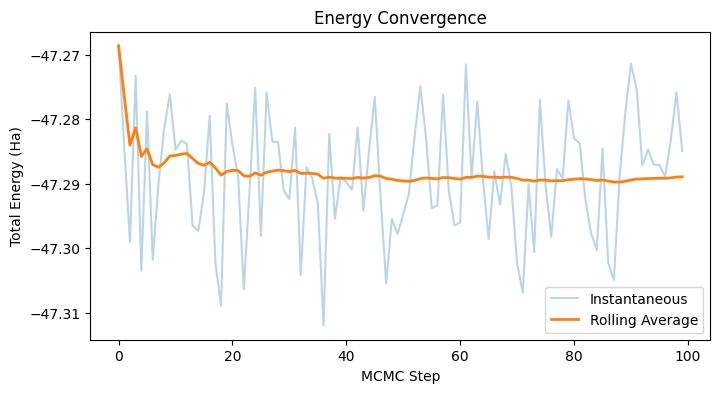

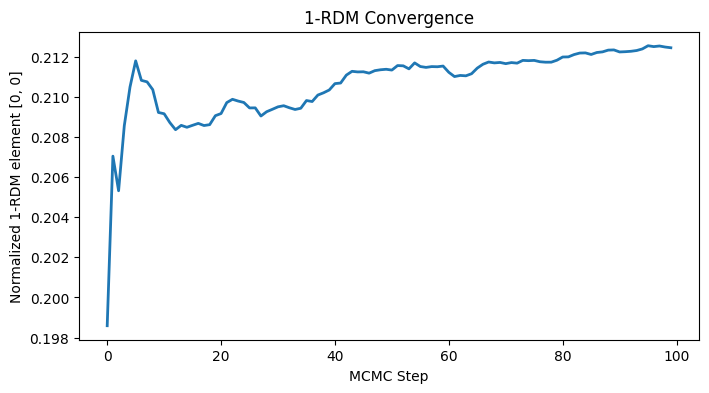

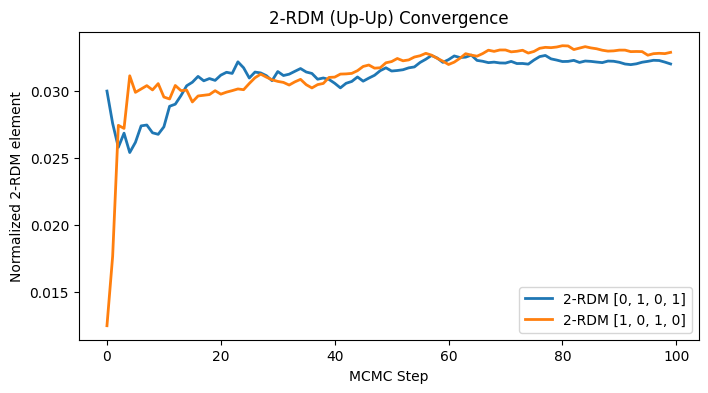

Ni_sq shape: (100, 7)
First Ni_sq values: [0.0231045  0.02354984 0.02317063 0.02299447 0.02336259]


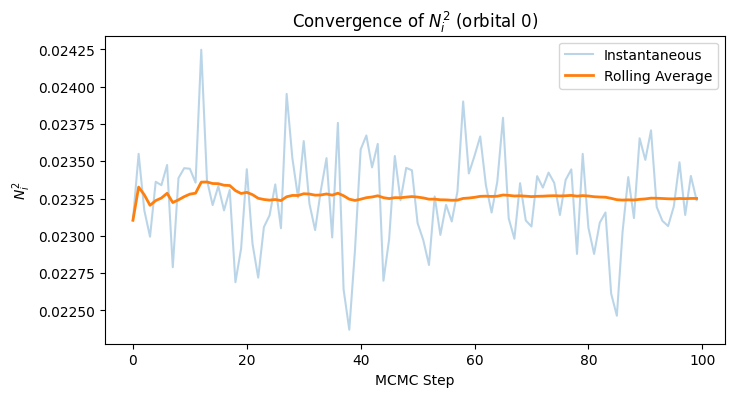

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_rdm_eval_gaussian_init/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


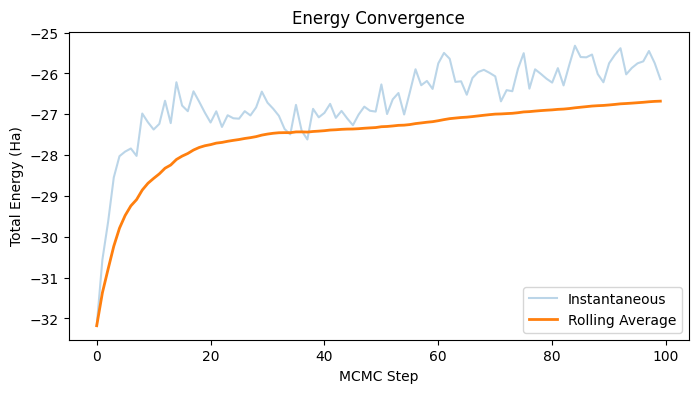

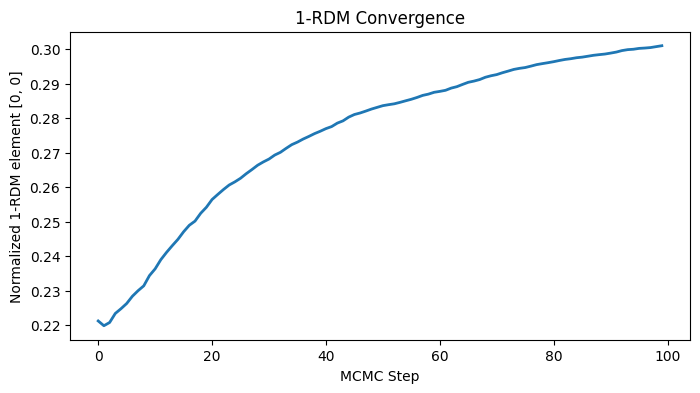

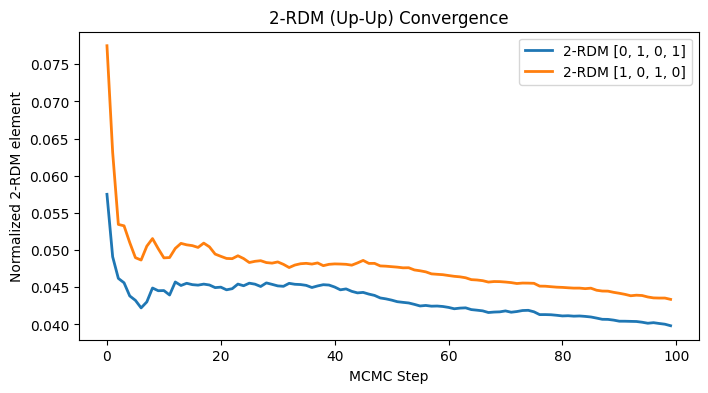

Ni_sq shape: (100, 7)
First Ni_sq values: [0.02267602 0.02292418 0.02342991 0.02295285 0.0233273 ]


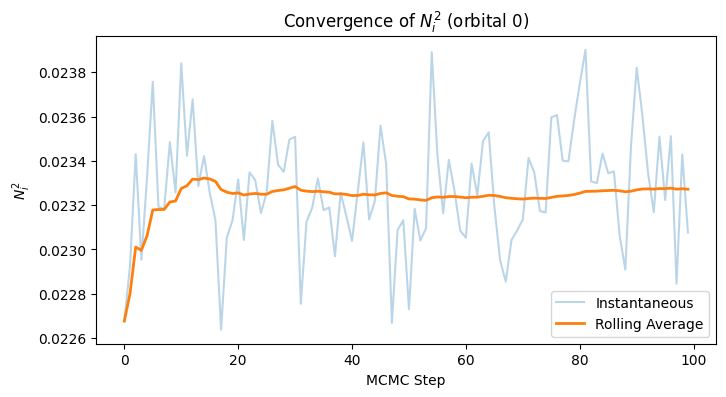

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_rdm_eval_gaussian_init/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


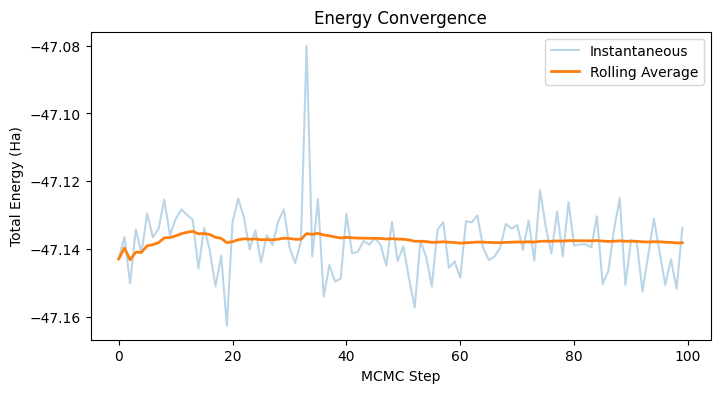

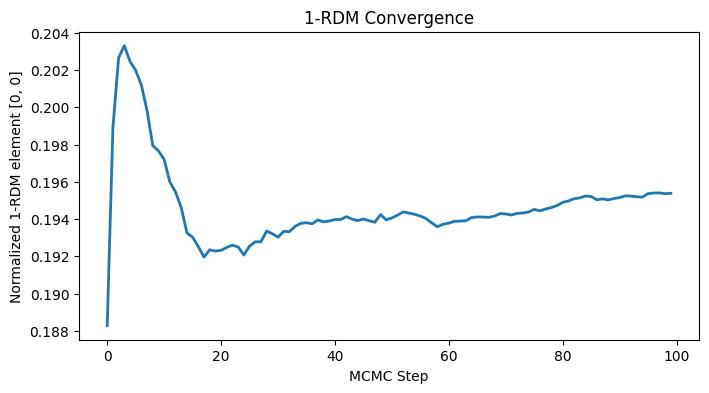

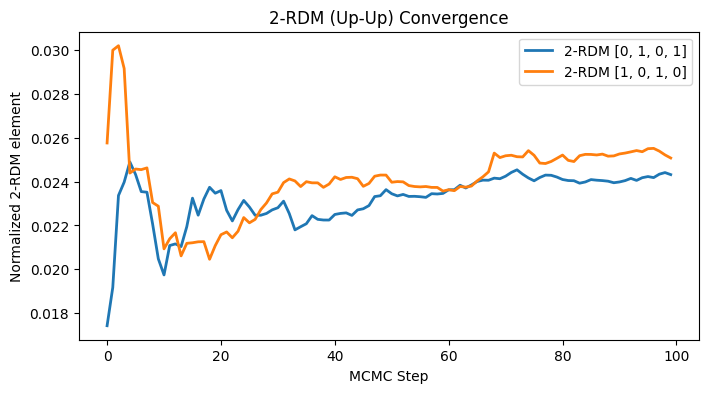

Ni_sq shape: (100, 7)
First Ni_sq values: [0.02341266 0.02329591 0.0234199  0.02342849 0.02341276]


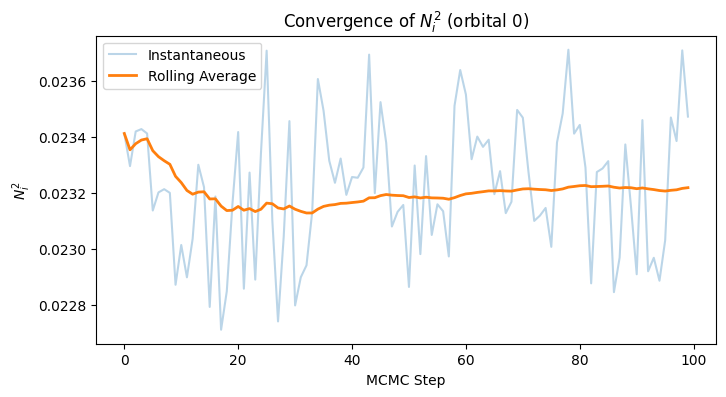

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_rdm_eval_gaussian_init/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


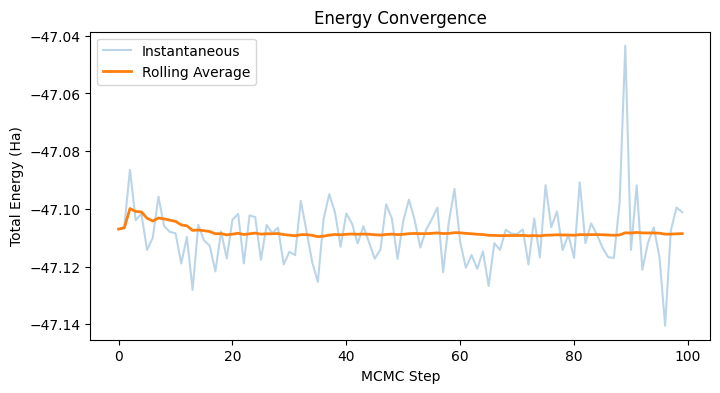

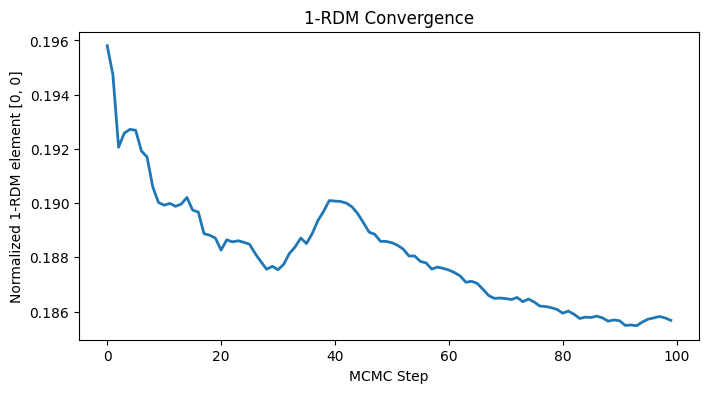

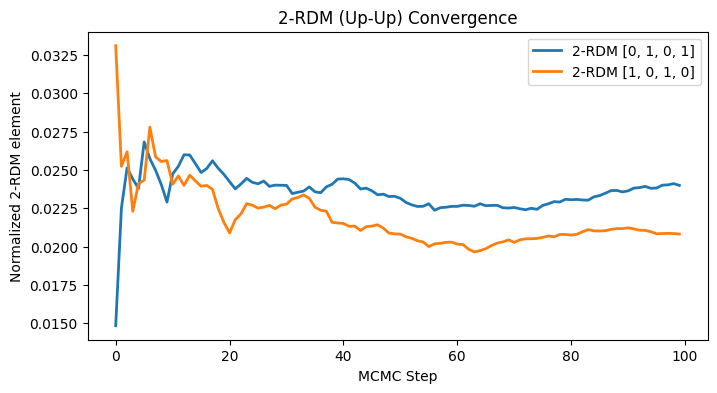

Ni_sq shape: (100, 7)
First Ni_sq values: [0.0234196  0.02338153 0.0234727  0.02343484 0.02318311]


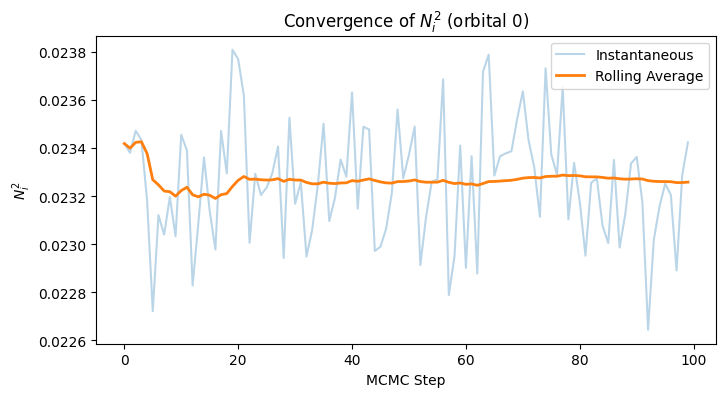

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_rdm_eval_gaussian_init/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


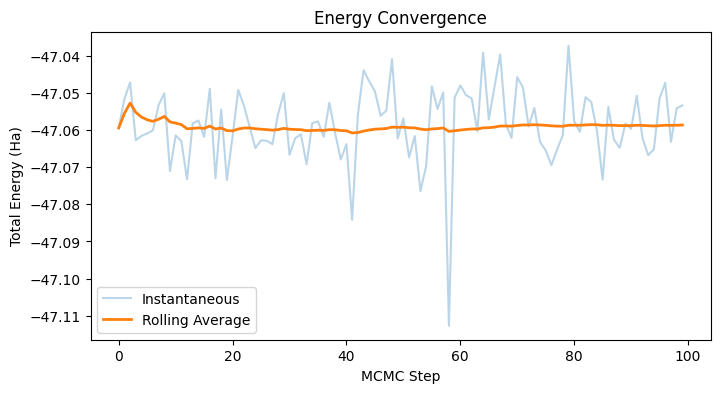

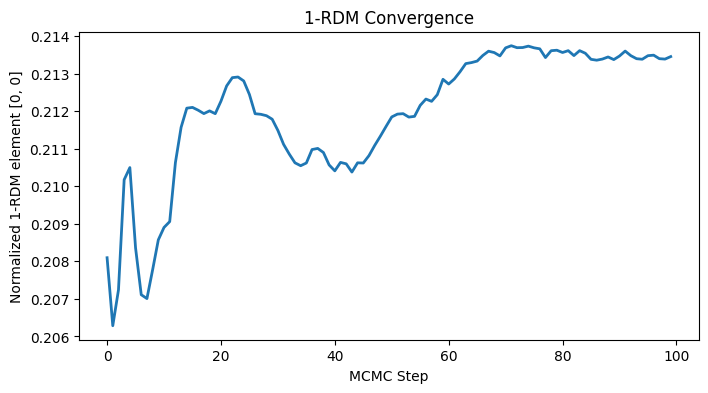

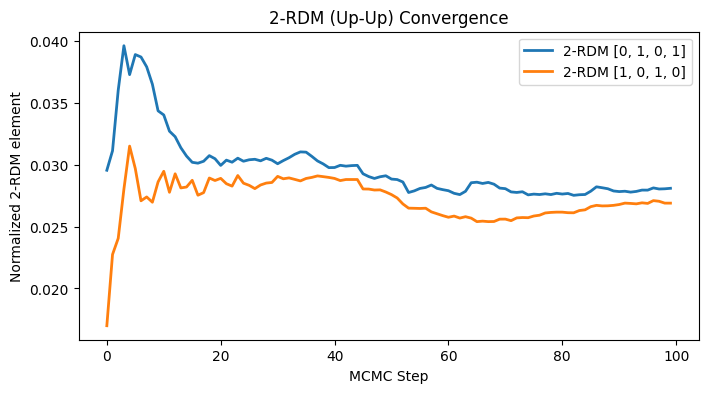

Ni_sq shape: (100, 7)
First Ni_sq values: [0.02286516 0.02265684 0.02320532 0.02322537 0.0230871 ]


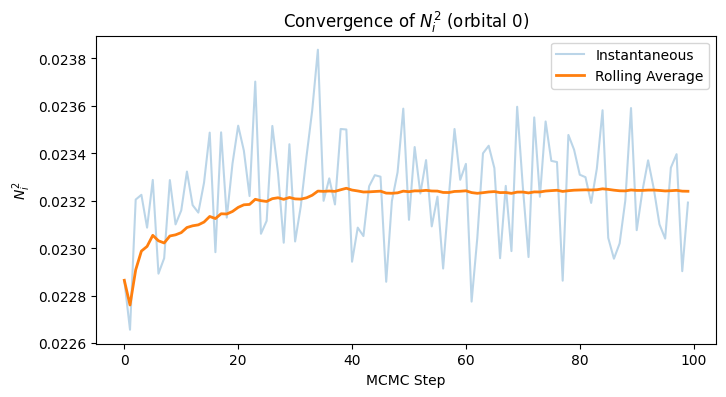

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval_gaussian_init/evaluation_stats.h5
Available datasets: ['Ni_sq', 'energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'total_energy', 'total_energy_real', 'total_energy_real_var', 'unnorm_gamma1_down_ii', 'unnorm_gamma1_up_ii', 'unnorm_two_rdm_down_down', 'unnorm_two_rdm_up_down', 'unnorm_two_rdm_up_up']


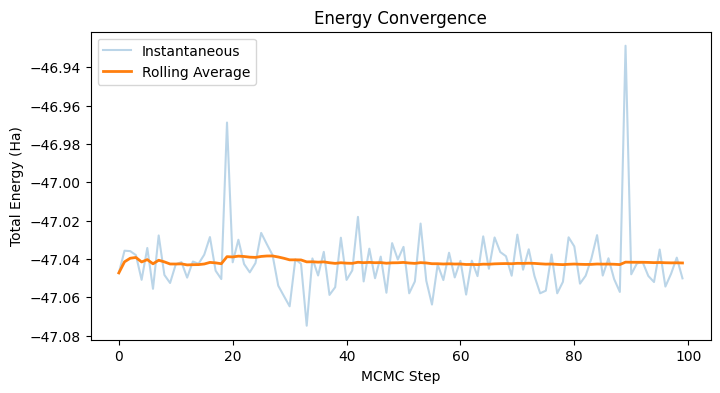

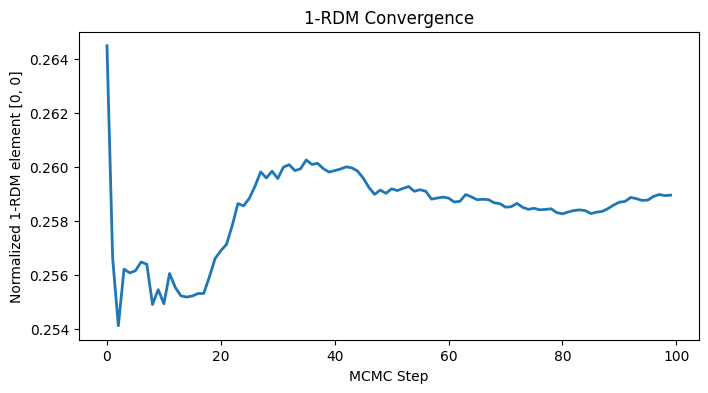

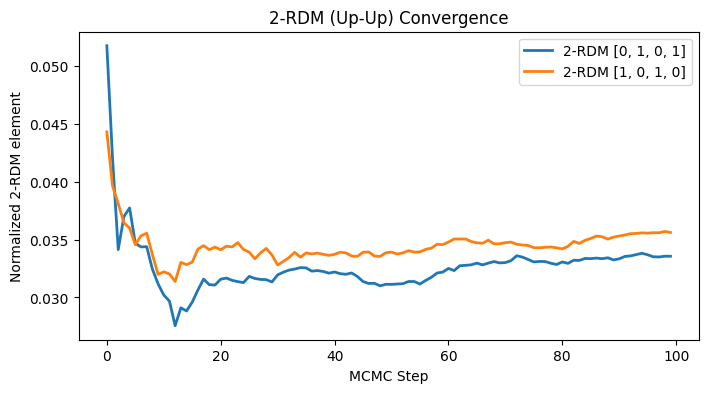

Ni_sq shape: (100, 7)
First Ni_sq values: [0.02297274 0.02316011 0.02300906 0.02296059 0.02337443]


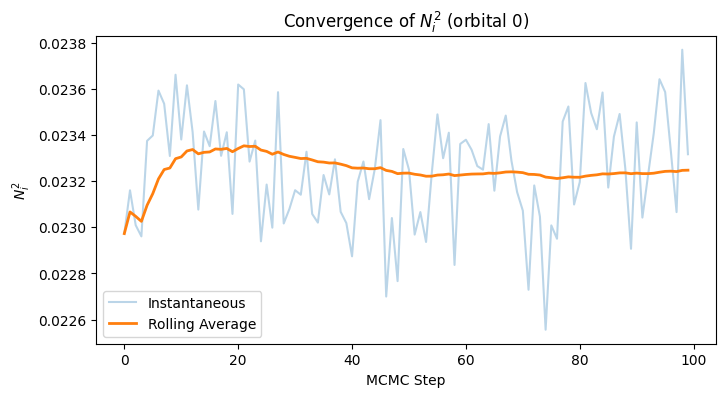

In [5]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# Path to your evaluation stats file
# h5_path = "/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_rdm_eval/evaluation_stats.h5"

run_paths = [
    f"/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_{i}_rdm_eval_gaussian_init_init_by_electron_count/evaluation_stats.h5"
    for i in [2.8, 4.2, 5.0, 5.5, 7.0, 10.0]
]

for h5_path in run_paths:
    print(h5_path)

    with h5py.File(h5_path, "r") as f:
        print("Available datasets:", list(f.keys()))
        
        # 1. Look at total energy convergence
        if 'total_energy_real' in f:
            energy = f['total_energy_real'][:]
            rolling_energy = np.cumsum(energy) / np.arange(1, len(energy) + 1)
            
            plt.figure(figsize=(8, 4))
            plt.plot(energy, alpha=0.3, label="Instantaneous")
            plt.plot(rolling_energy, linewidth=2, label="Rolling Average")
            plt.xlabel("MCMC Step")
            plt.ylabel("Total Energy (Ha)")
            plt.legend()
            plt.title("Energy Convergence")
            plt.show()
    
        # 2. Look at RDM convergence for a specific element, e.g., index [0, 1]
        if 'unnorm_gamma1_up_ii' in f and 'Ni_sq' in f:
            unnorm_gamma1 = f['unnorm_gamma1_up_ii'][:]
            ni_sq_i = f['Ni_sq'][:]
            
            # Calculate the normalized value at each step
            # Note: If your normalization Ni_sq is also accumulated over steps, 
            # you might want to use the rolling average of BOTH before dividing
            roll_unnorm = np.cumsum(unnorm_gamma1, axis=0) / np.arange(1, len(unnorm_gamma1) + 1)[:, None]
            roll_ni = np.cumsum(ni_sq_i, axis=0) / np.arange(1, len(ni_sq_i) + 1)[:, None]
            
            # Gamma normalized step-by-step
            roll_gamma1 = roll_unnorm / roll_ni
            
            # Let's say we want to plot the convergence of the 1-RDM element [0]
            plt.figure(figsize=(8, 4))
            plt.plot(roll_gamma1[:, 0], linewidth=2)
            plt.xlabel("MCMC Step")
            plt.ylabel("Normalized 1-RDM element [0, 0]")
            plt.title("1-RDM Convergence")
            plt.show()
    
        if 'unnorm_two_rdm_up_up' in f and 'Ni_sq' in f:
            unnorm_gamma2 = f['unnorm_two_rdm_up_up'][:]  # Shape: (steps, N_orbs, N_orbs, N_orbs, N_orbs)
            ni_sq = f['Ni_sq'][:]                         # Shape: (steps, N_orbs)
            
            # Calculate rolling averages over MCMC steps for the numerator
            roll_unnorm_gamma2 = np.cumsum(unnorm_gamma2, axis=0) / np.arange(1, len(unnorm_gamma2) + 1)[:, None, None, None, None]
            
            # Calculate rolling averages over MCMC steps for the normalizer
            roll_ni = np.cumsum(ni_sq, axis=0) / np.arange(1, len(ni_sq) + 1)[:, None]
            
            # For the full 2-RDM tensor (i, j, k, l), the normalizer is sqrt(N_i^2 * N_j^2 * N_k^2 * N_l^2)
            # Using broadcasting to construct the 4D normalization tensor
            norm_2rdm = np.sqrt(
                roll_ni[:, :, None, None, None] * 
                roll_ni[:, None, :, None, None] * 
                roll_ni[:, None, None, :, None] * 
                roll_ni[:, None, None, None, :]
            )
            
            # Gamma2 normalized step-by-step
            roll_gamma2 = roll_unnorm_gamma2 / norm_2rdm
            
            # Plot convergence of specific 2-RDM elements, e.g. [0, 1, 0, 1] and [1, 0, 1, 0]
            plt.figure(figsize=(8, 4))
            plt.plot(roll_gamma2[:, 0, 1, 0, 1], linewidth=2, label="2-RDM [0, 1, 0, 1]")
            plt.plot(roll_gamma2[:, 1, 0, 1, 0], linewidth=2, label="2-RDM [1, 0, 1, 0]")
            
            plt.xlabel("MCMC Step")
            plt.ylabel("Normalized 2-RDM element")
            plt.title("2-RDM (Up-Up) Convergence")
            plt.legend()
            plt.show()



        # 3. Look at convergence of Ni_sq
        if 'Ni_sq' in f:
            ni_sq = f['Ni_sq'][:]

            print("Ni_sq shape:", ni_sq.shape)
            print("First Ni_sq values:", ni_sq[:5, 0])

            # Cumulative / rolling average over MCMC steps
            rolling_ni_sq = (
                np.cumsum(ni_sq, axis=0)
                / np.arange(1, len(ni_sq) + 1)[:, None]
            )

            # Plot Ni_sq for orbital 0
            plt.figure(figsize=(8, 4))
            plt.plot(
                ni_sq[:, 0],
                alpha=0.3,
                label="Instantaneous"
            )
            plt.plot(
                rolling_ni_sq[:, 0],
                linewidth=2,
                label="Rolling Average"
            )

            plt.xlabel("MCMC Step")
            plt.ylabel(r"$N_i^2$")
            plt.title(r"Convergence of $N_i^2$ (orbital 0)")
            plt.legend()
            plt.show()

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_spin_6_6/train_stats.h5
Extracting datasets: ['energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'loss', 'pmove', 'total_energy', 'total_energy_real', 'total_energy_real_var']


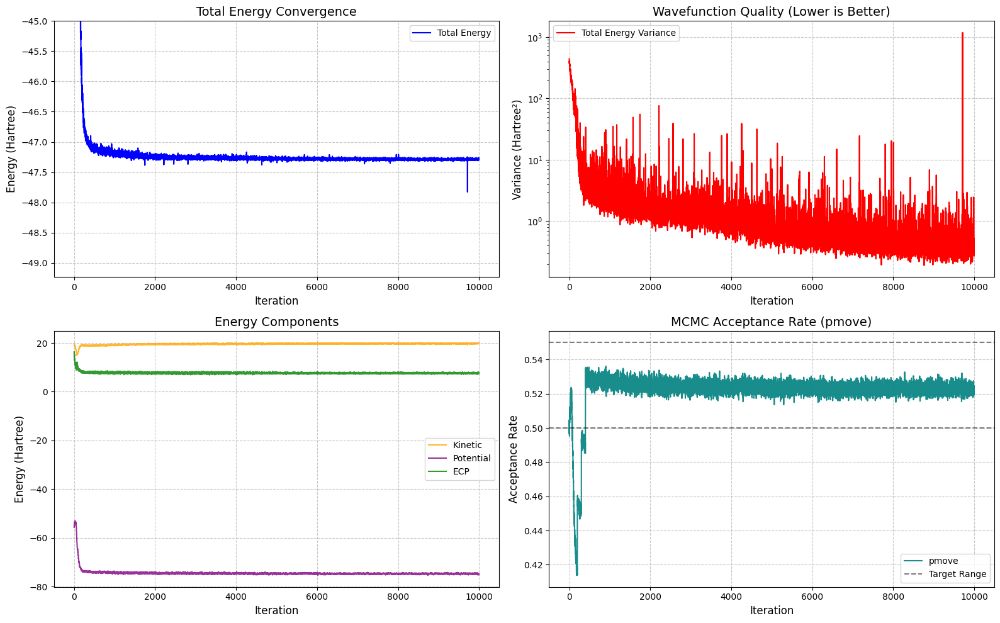

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_4.2_spin_6_6/train_stats.h5
Extracting datasets: ['energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'loss', 'pmove', 'total_energy', 'total_energy_real', 'total_energy_real_var']


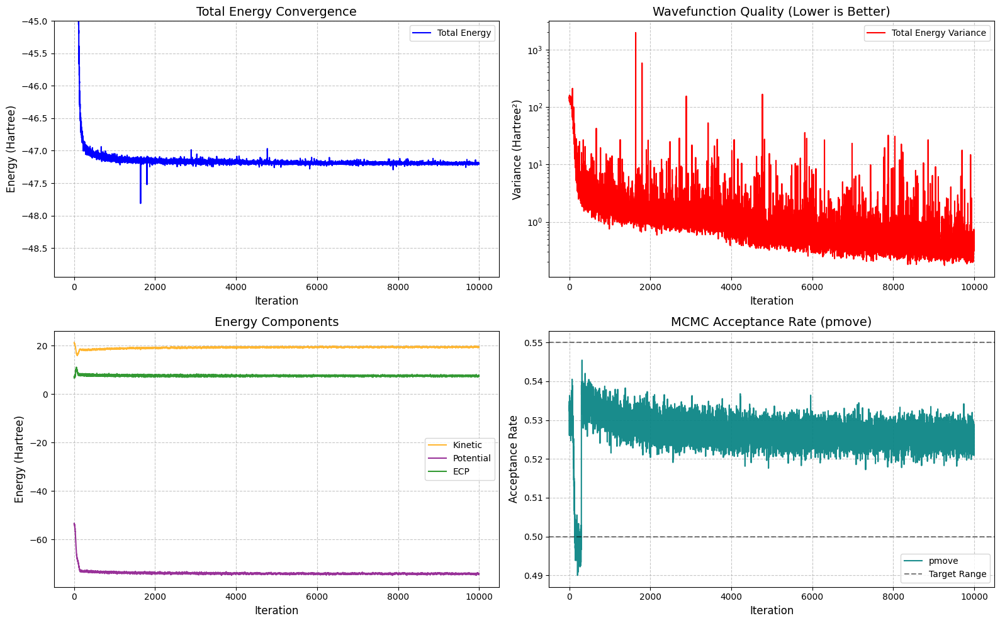

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.0_spin_6_6/train_stats.h5
Extracting datasets: ['energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'loss', 'pmove', 'total_energy', 'total_energy_real', 'total_energy_real_var']


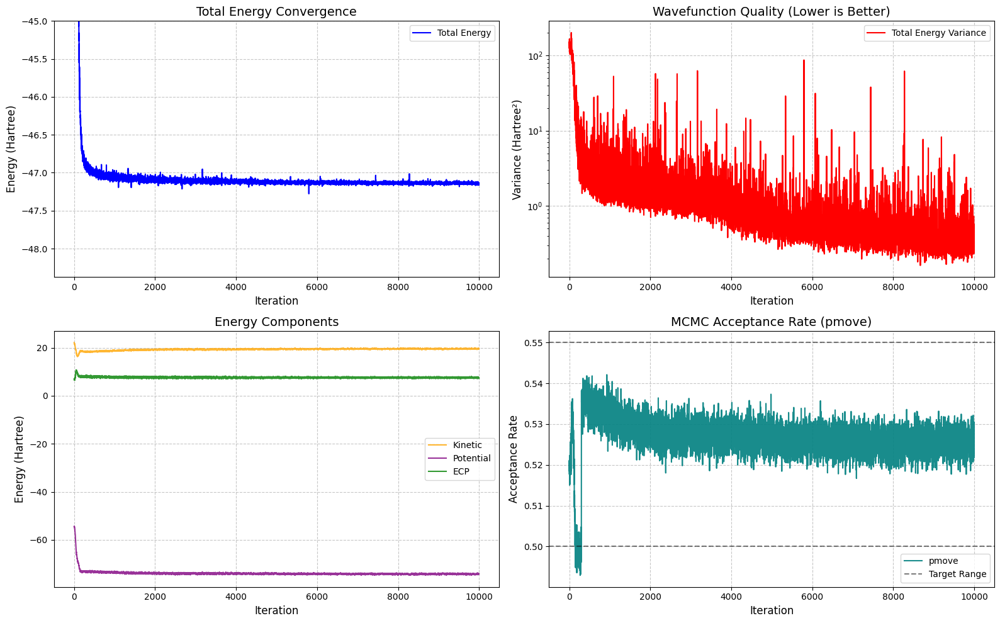

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_5.5_spin_6_6/train_stats.h5
Extracting datasets: ['energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'loss', 'pmove', 'total_energy', 'total_energy_real', 'total_energy_real_var']


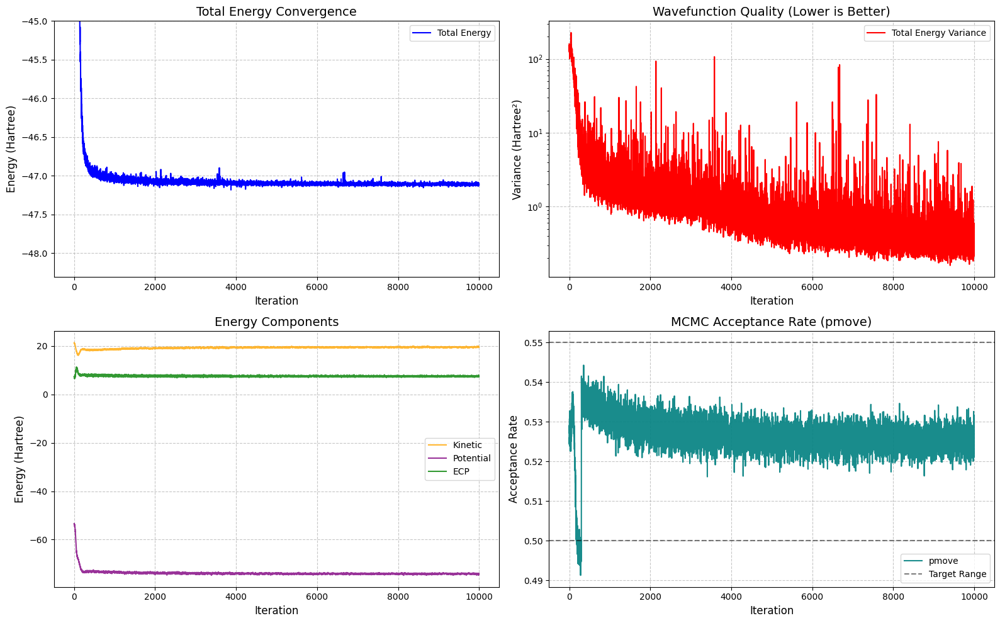

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_7.0_spin_6_6/train_stats.h5
Extracting datasets: ['energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'loss', 'pmove', 'total_energy', 'total_energy_real', 'total_energy_real_var']


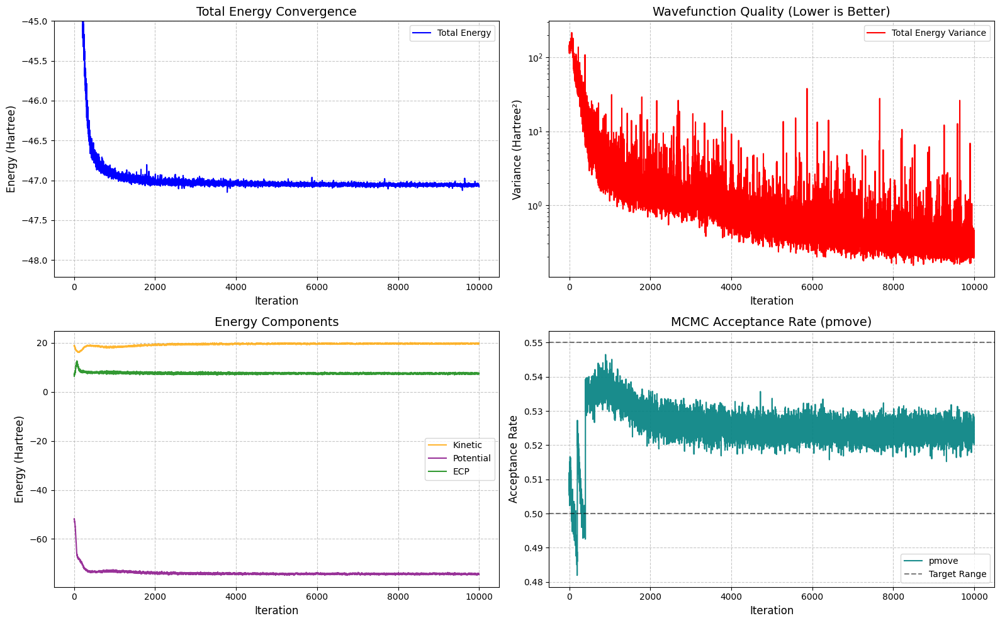

/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_10.0_spin_6_6/train_stats.h5
Extracting datasets: ['energy:ecp', 'energy:ecp_var', 'energy:kinetic', 'energy:kinetic_var', 'energy:potential', 'energy:potential_var', 'loss', 'pmove', 'total_energy', 'total_energy_real', 'total_energy_real_var']


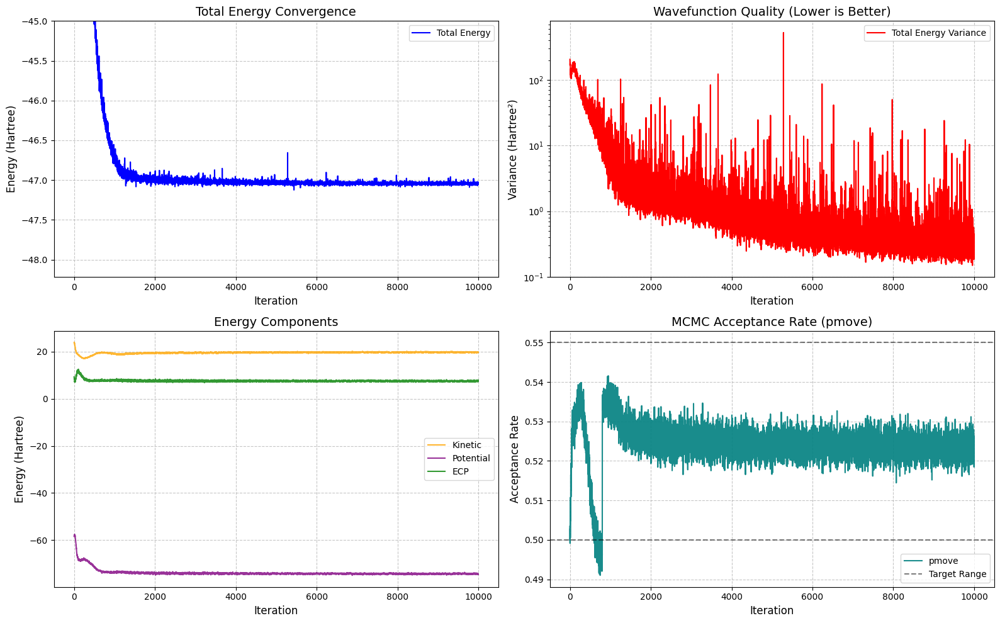

In [4]:
import h5py
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the file path /rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_2.8_spin_6_6
file_paths = [
    f"/rds/user/jc2405/hpc-work/JaQMC/jaqmc/runs/sc_h_chain_{i}_spin_6_6/train_stats.h5"
    for i in [2.8, 4.2, 5.0, 5.5, 7.0, 10.0]
]

for file_path in file_paths:
    print(file_path)
    if not os.path.exists(file_path):
        print(f"Error: File not found at {file_path}")
    else:
        # Read the HDF5 file
        with h5py.File(file_path, "r") as f:
            print("Extracting datasets:", list(f.keys()))
            
            # Means
            total_energy = f["total_energy"][:]
            kinetic = f["energy:kinetic"][:]
            potential = f["energy:potential"][:]
            ecp = f["energy:ecp"][:]
            
            # Variances
            total_energy_var = f["total_energy_real_var"][:]
    
            pmove = f["pmove"][:]
            
            # Generate the x-axis (iterations) based on the array length
            steps = np.arange(len(total_energy))
    
        # Create a figure with a 2x2 grid (4 subplots)
        fig, axes = plt.subplots(2, 2, figsize=(16, 10))
        axes = axes.flatten()
    
        # --- Plot 1: Total Energy Convergence ---
        axes[0].plot(steps, total_energy, label="Total Energy", color='blue', linewidth=1.5)
        axes[0].set_xlabel("Iteration", fontsize=12)
        axes[0].set_ylabel("Energy (Hartree)", fontsize=12)
        axes[0].set_ylim(top=-45)
        axes[0].set_title("Total Energy Convergence", fontsize=14)
        axes[0].grid(True, linestyle='--', alpha=0.7)
        axes[0].legend()
    
        # --- Plot 2: Total Energy Variance ---
        axes[1].semilogy(steps, total_energy_var, label="Total Energy Variance", color='red', linewidth=1.5)
        axes[1].set_xlabel("Iteration", fontsize=12)
        axes[1].set_ylabel("Variance (Hartree²)", fontsize=12)
        axes[1].set_title("Wavefunction Quality (Lower is Better)", fontsize=14)
        axes[1].grid(True, linestyle='--', alpha=0.7)
        axes[1].legend()
    
        # --- Plot 3: Energy Components ---
        axes[2].plot(steps, kinetic, label="Kinetic", color='orange', alpha=0.8)
        axes[2].plot(steps, potential, label="Potential", color='purple', alpha=0.8)
        axes[2].plot(steps, ecp, label="ECP", color='green', alpha=0.8)
        axes[2].set_xlabel("Iteration", fontsize=12)
        axes[2].set_ylabel("Energy (Hartree)", fontsize=12)
        axes[2].set_title("Energy Components", fontsize=14)
        axes[2].grid(True, linestyle='--', alpha=0.7)
        axes[2].legend()
    
        
        
        # 2. Replace the entire Plot 4 (Component Variances) section with this:
        # --- Plot 4: MCMC Acceptance Rate (pmove) ---
        axes[3].plot(steps, pmove, label="pmove", color='teal', alpha=0.9)
        axes[3].axhline(y=0.55, color='black', linestyle='--', alpha=0.5, label="Target Range")
        axes[3].axhline(y=0.50, color='black', linestyle='--', alpha=0.5)
        axes[3].set_xlabel("Iteration", fontsize=12)
        axes[3].set_ylabel("Acceptance Rate", fontsize=12)
        axes[3].set_title("MCMC Acceptance Rate (pmove)", fontsize=14)
        axes[3].grid(True, linestyle='--', alpha=0.7)
        axes[3].legend()
    
        plt.tight_layout()
        plt.show()